In [4]:
%load_ext autoreload
%autoreload 2
from condTrainingTools import NFTrainer
import helper_functions as hf
from functools import partial
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
import json
import torch
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
import h5py
#torch.set_default_tensor_type('torch.cuda.FloatTensor') if torch.cuda.is_available() else print ('cpu')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Background

Loading train sample


  1%|▏         | 1/80 [00:00<00:02, 26.60it/s]

100000 training events
Training flow BKG_mjjCond


Iteration 10 Complete
Loss:  11.617972373962402
Iteration 20 Complete
Loss:  10.592545509338379
Iteration 30 Complete
Loss:  9.939943313598633
Iteration 40 Complete
Loss:  9.85893726348877
Iteration 50 Complete
Loss:  9.668128967285156
Iteration 60 Complete
Loss:  9.718008041381836
Iteration 70 Complete
Loss:  9.873106002807617
Loading test sample


  5%|▌         | 4/80 [00:04<01:21,  1.07s/it]


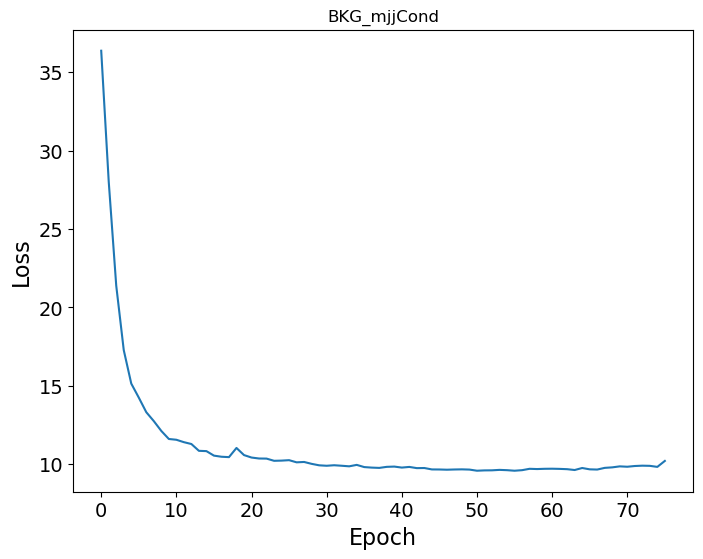

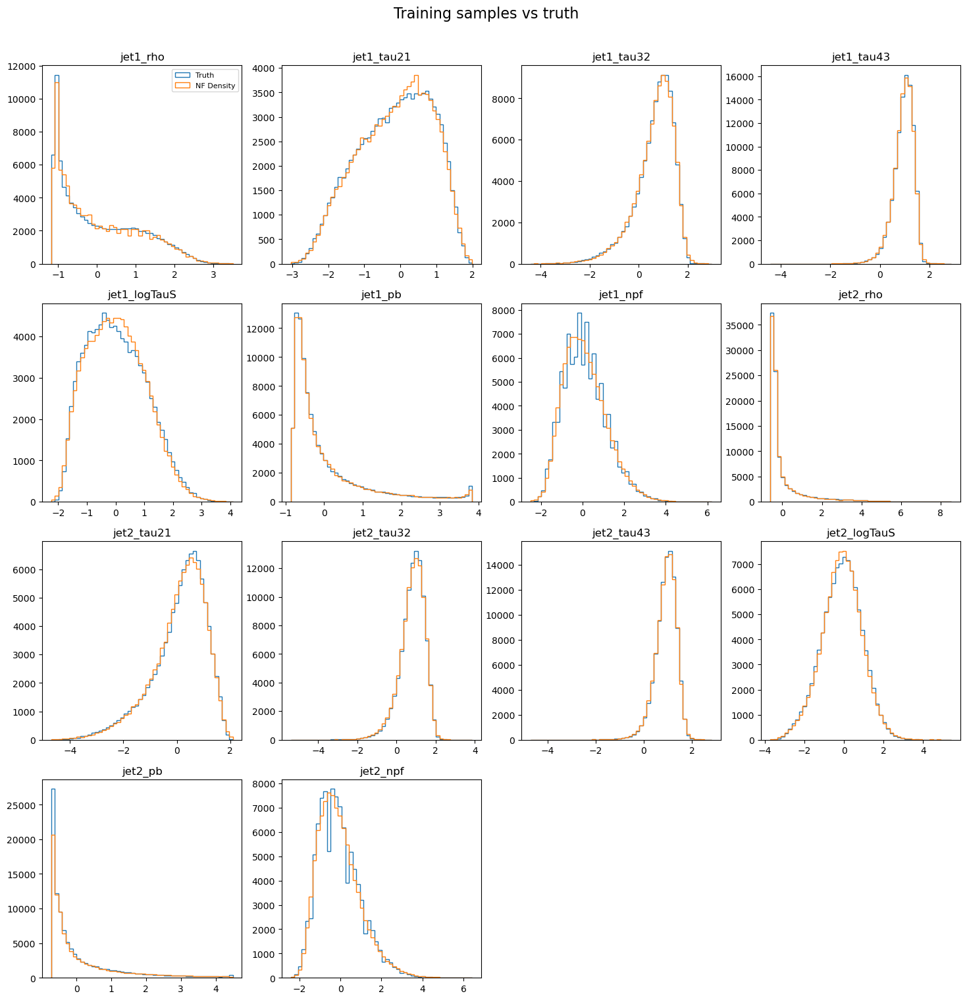

Loading test sample


  5%|▌         | 4/80 [00:00<00:04, 15.95it/s]


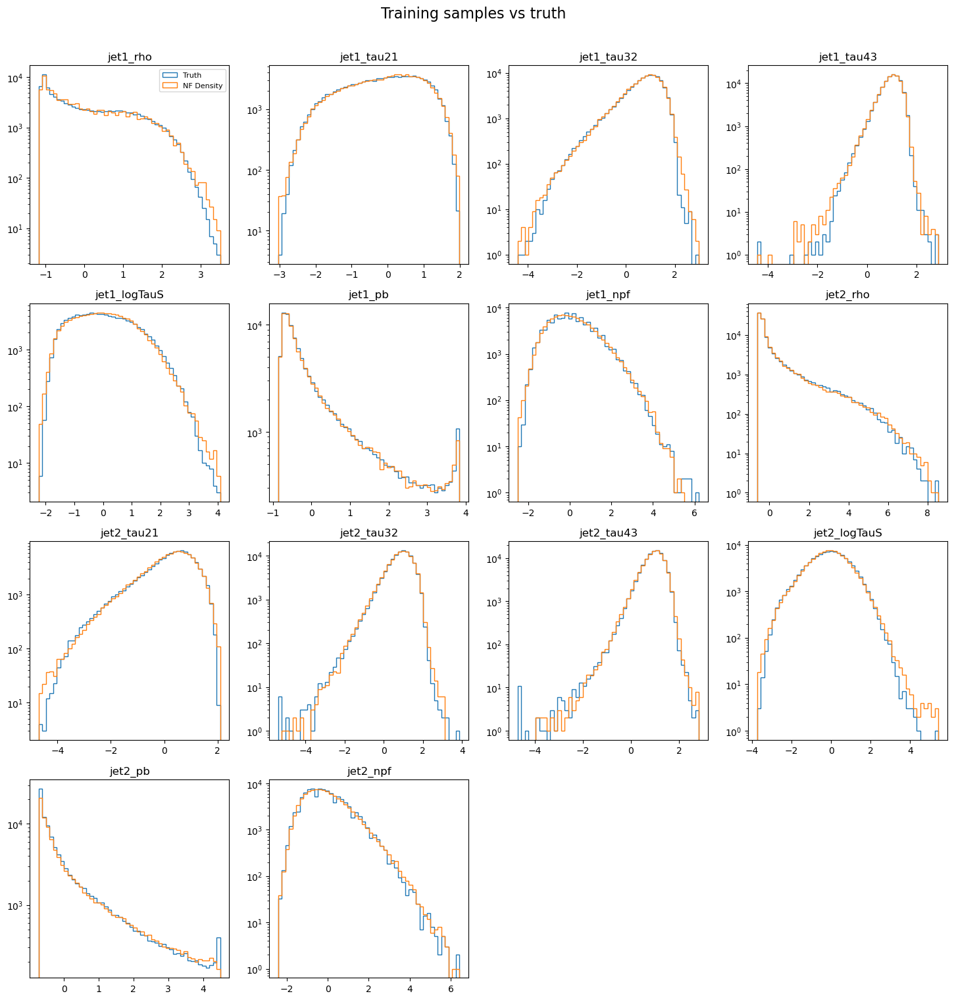

In [10]:
# Background
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "BKG"
reference = "BKG"
modelName = "BKG_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Data Sideband

Loading train sample


  2%|▎         | 1/40 [00:05<03:24,  5.24s/it]


100000 training events
Training flow DATA_mjjCond
Iteration 10 Complete
Loss:  11.585436820983887
Iteration 20 Complete
Loss:  10.013862609863281
Iteration 30 Complete
Loss:  9.685797691345215
Iteration 40 Complete
Loss:  9.49997329711914
Iteration 50 Complete
Loss:  9.353015899658203
Iteration 60 Complete
Loss:  9.46766185760498
Iteration 70 Complete
Loss:  9.632680892944336
Loading test sample


 15%|█▌        | 6/40 [00:23<02:14,  3.97s/it]


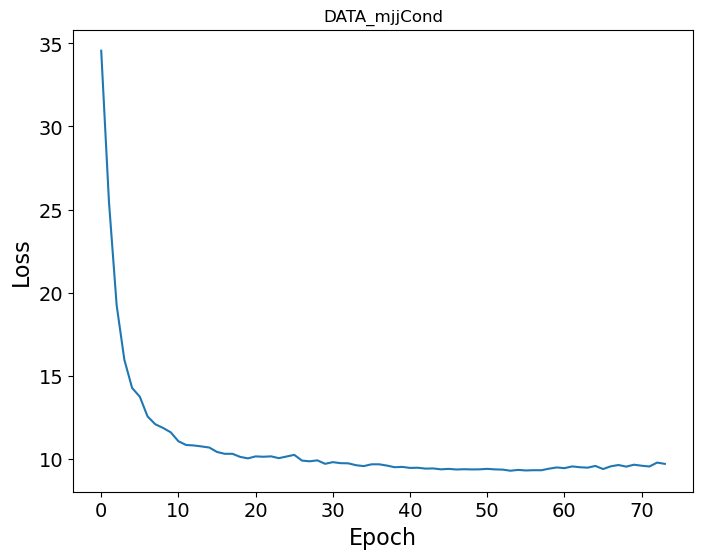

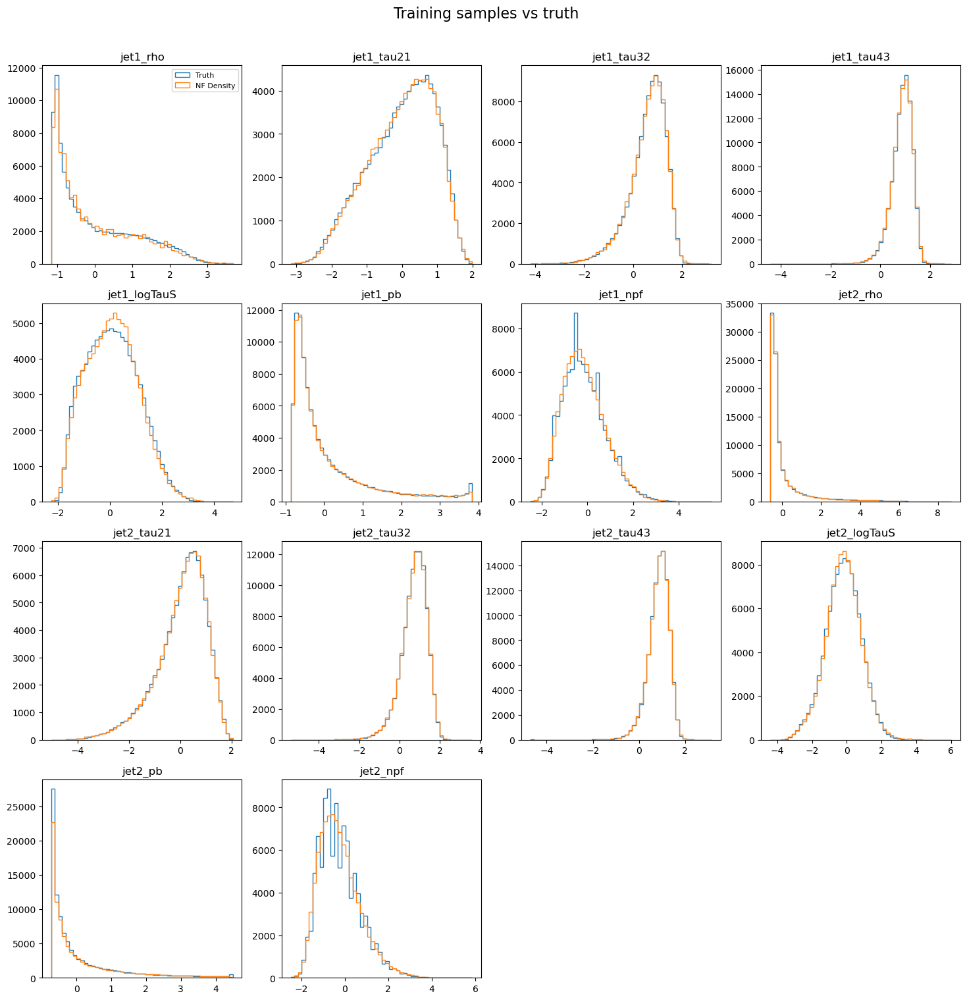

Loading test sample


 15%|█▌        | 6/40 [00:07<00:42,  1.26s/it]


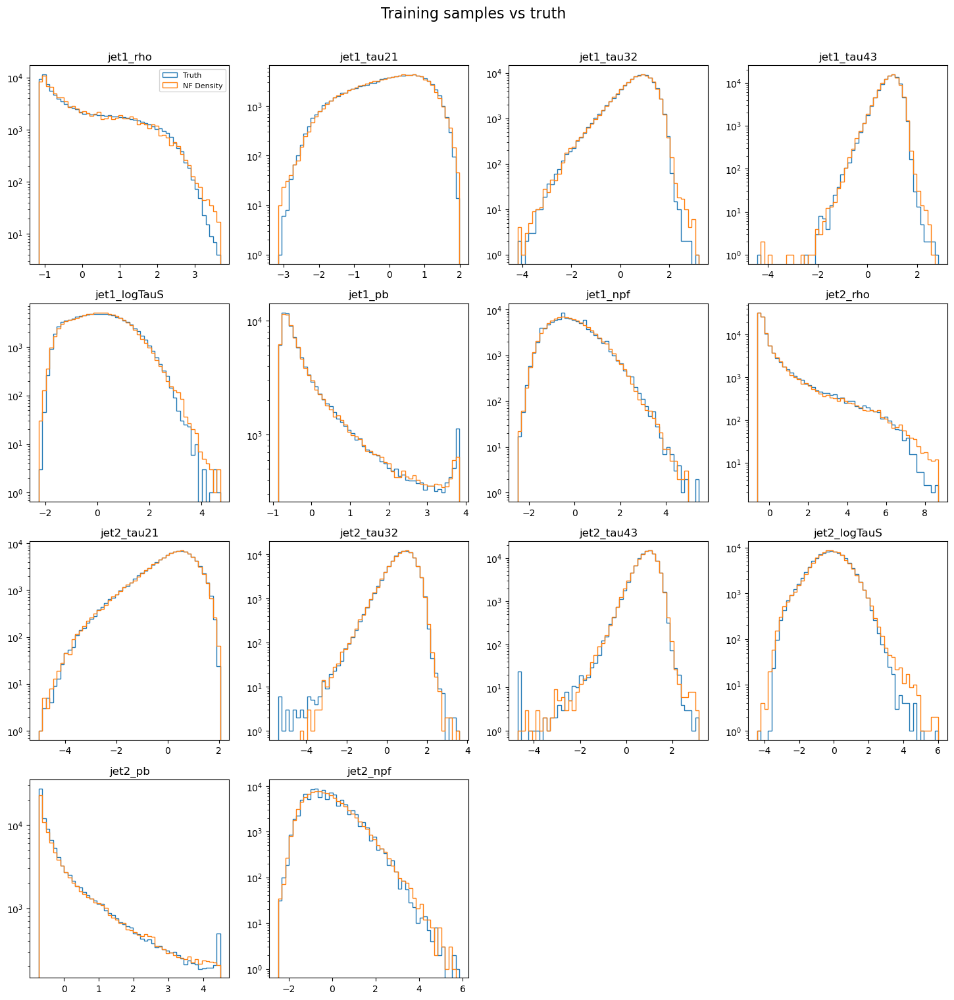

In [11]:
# Background
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "DATA"
reference = "BKG" # normalizing to Monte Carlo mean/std just for consistency w/ other trainings
modelName = "DATA_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs,sideband=True) # Adding sideband cut pre-training!
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# XYY3000_Y170_Yp170

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.39it/s]


99916 training events
Training flow XYY3000_Y170_Yp170_mjjCond
Iteration 10 Complete
Loss:  12.700799942016602
Iteration 20 Complete
Loss:  10.542792320251465
Iteration 30 Complete
Loss:  9.820755958557129
Iteration 40 Complete
Loss:  9.535411834716797
Iteration 50 Complete
Loss:  9.478524208068848
Iteration 60 Complete
Loss:  9.475829124450684
Iteration 70 Complete
Loss:  10.238170623779297
Iteration 80 Complete
Loss:  12.22868537902832
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 60.26it/s]


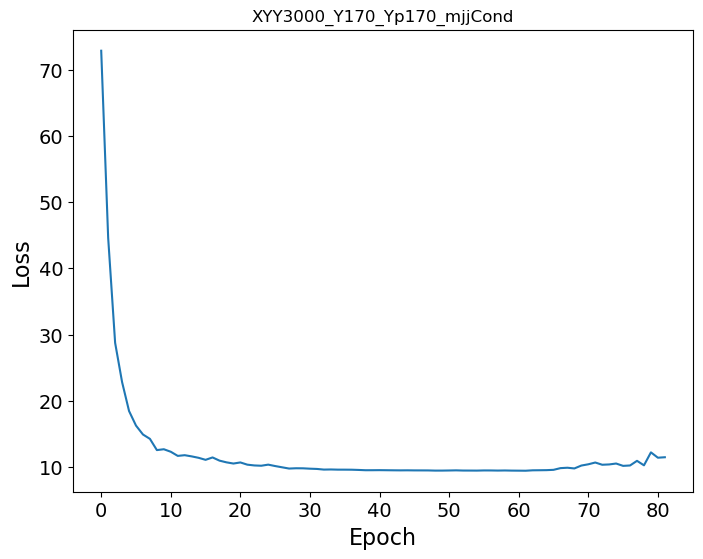

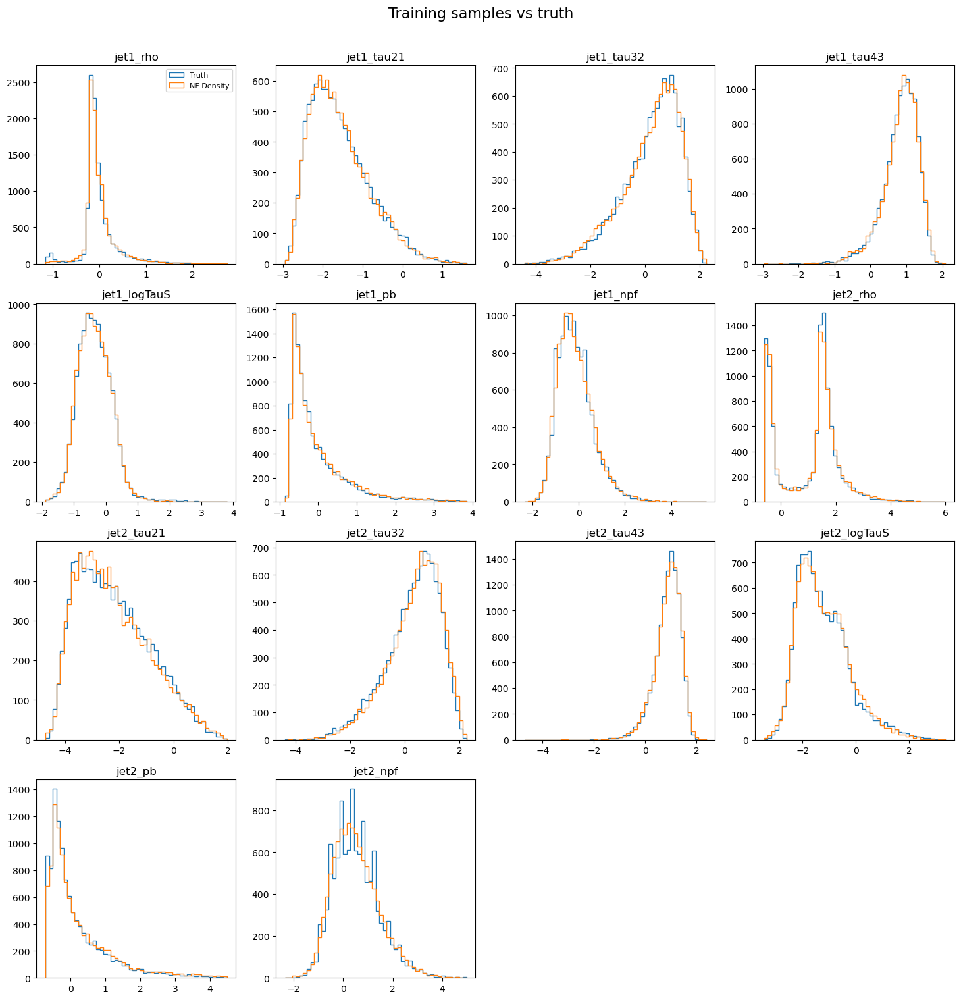

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 62.21it/s]


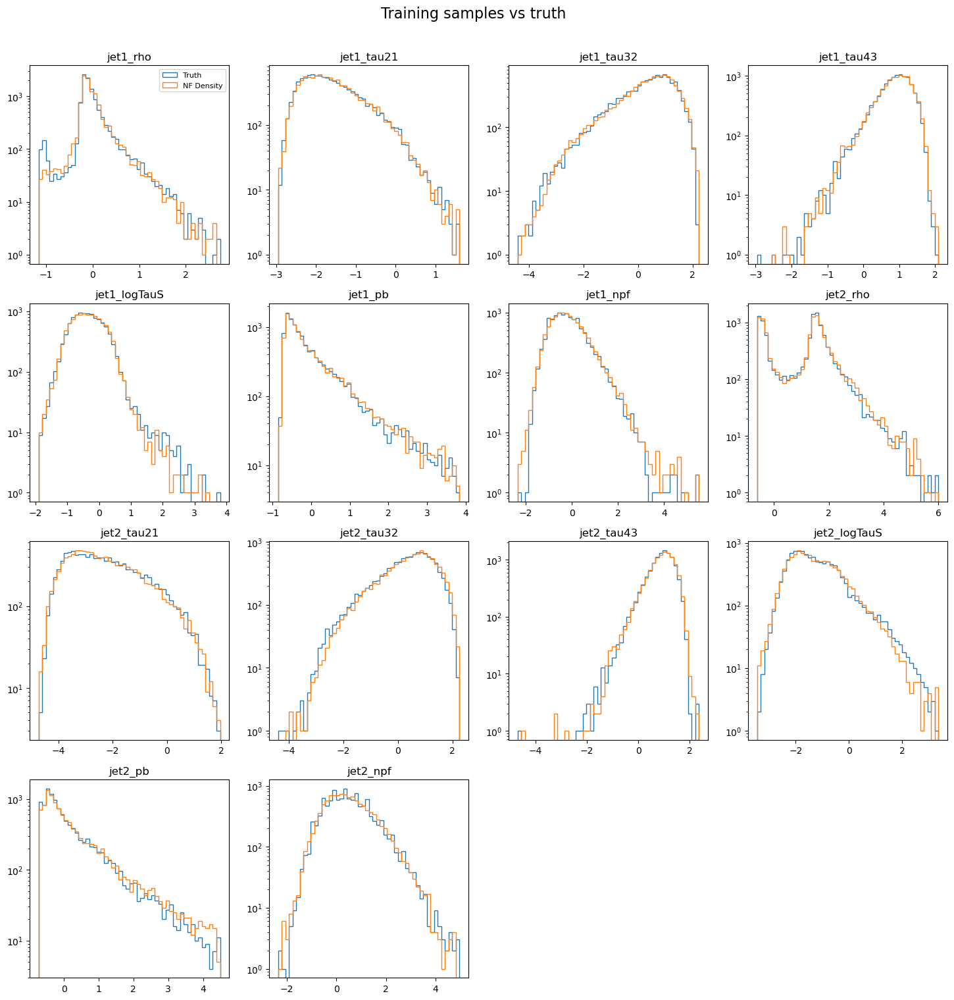

In [12]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "XYY3000_Y170_Yp170"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=5000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Wp3000_B400_T170

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.77it/s]


87874 training events
Training flow Wp3000_B400_T170_mjjCond
Iteration 10 Complete
Loss:  16.325443267822266
Iteration 20 Complete
Loss:  14.628443717956543
Iteration 30 Complete
Loss:  14.114174842834473
Iteration 40 Complete
Loss:  13.941033363342285
Iteration 50 Complete
Loss:  13.89128589630127
Iteration 60 Complete
Loss:  13.890246391296387
Iteration 70 Complete
Loss:  13.979140281677246
Iteration 80 Complete
Loss:  14.067010879516602
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 64.67it/s]


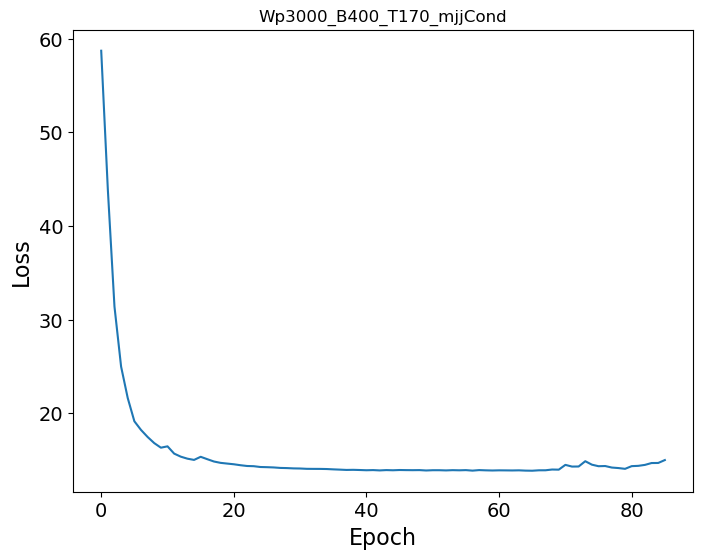

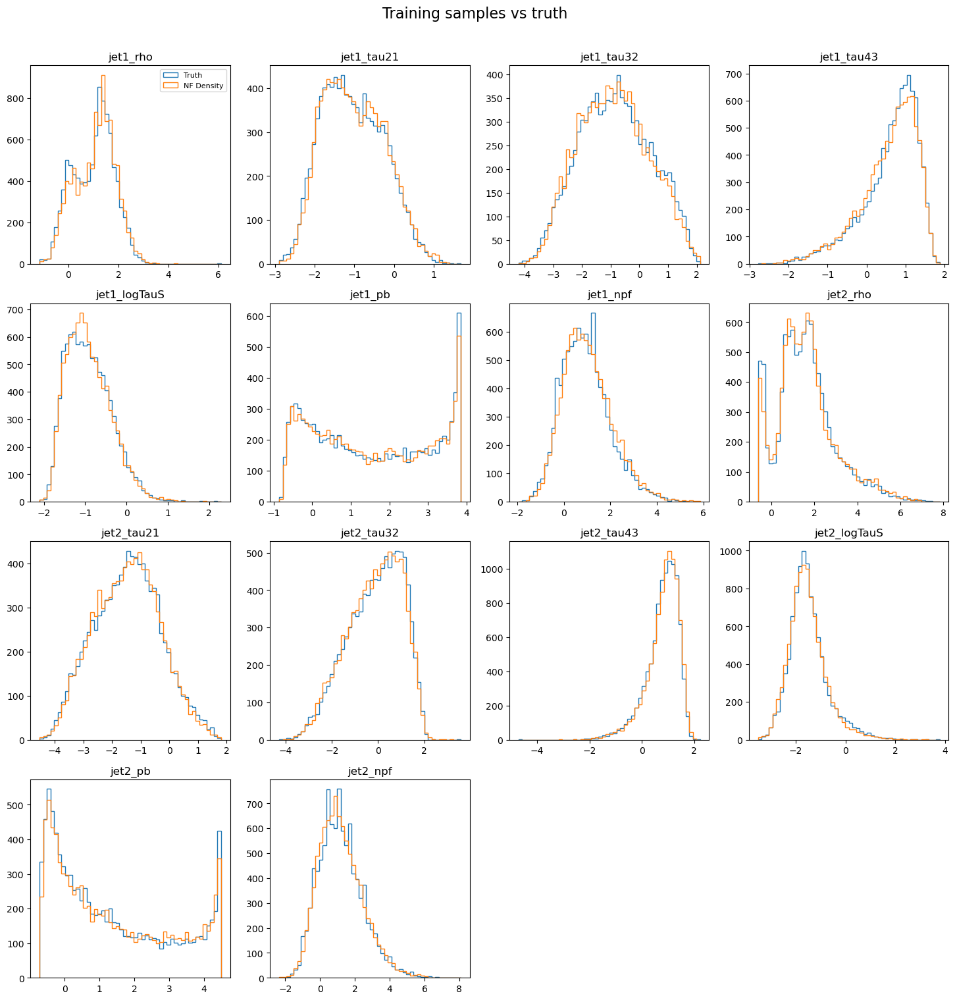

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 65.40it/s]


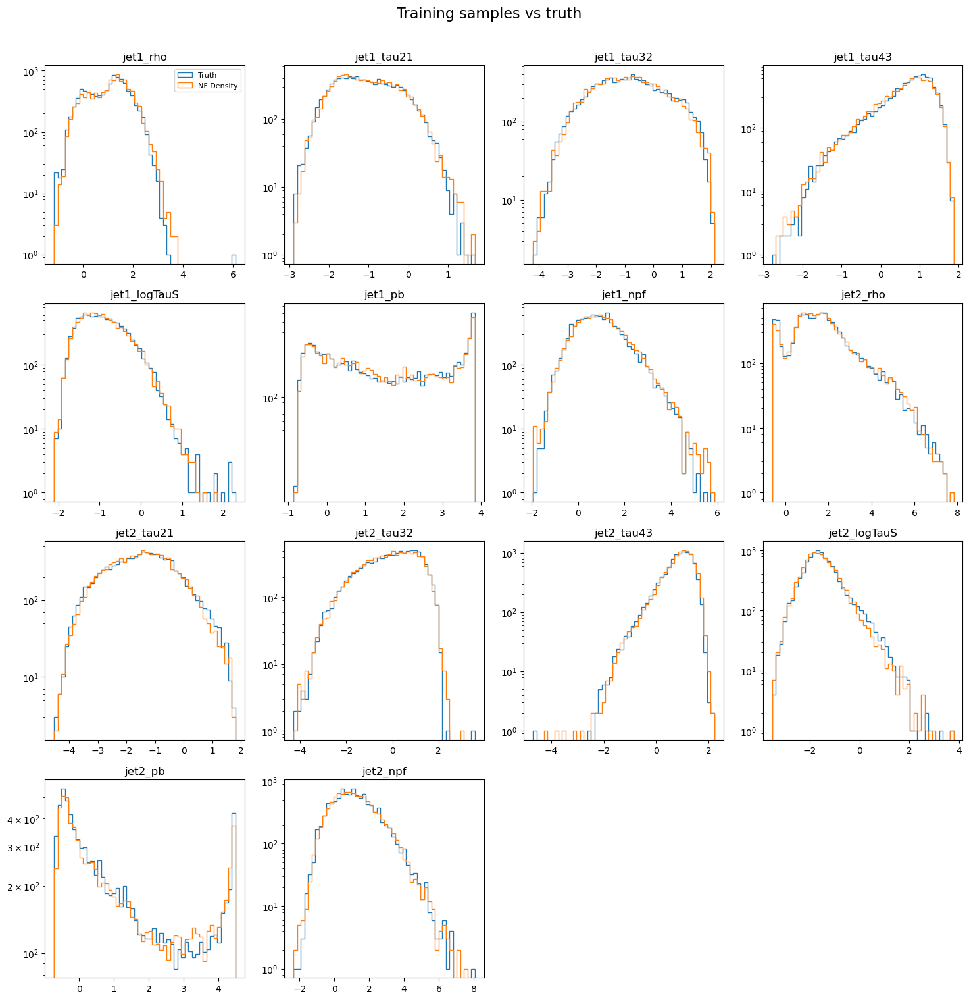

In [14]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "Wp3000_B400_T170"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=5000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Qstar2000_W400

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.74it/s]


74583 training events
Training flow Qstar2000_W400
Iteration 10 Complete
Loss:  13.900527954101562
Iteration 20 Complete
Loss:  12.738961219787598
Iteration 30 Complete
Loss:  12.308578491210938
Iteration 40 Complete
Loss:  11.774666786193848
Iteration 50 Complete
Loss:  11.40095329284668
Iteration 60 Complete
Loss:  11.523475646972656
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 74.59it/s]


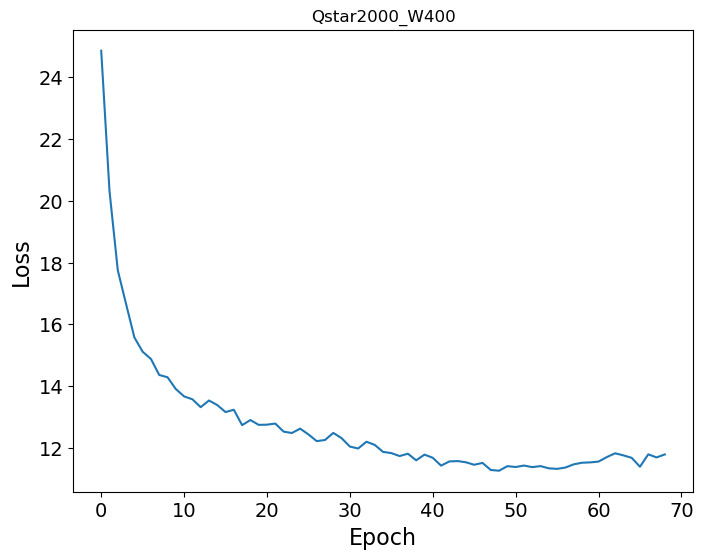

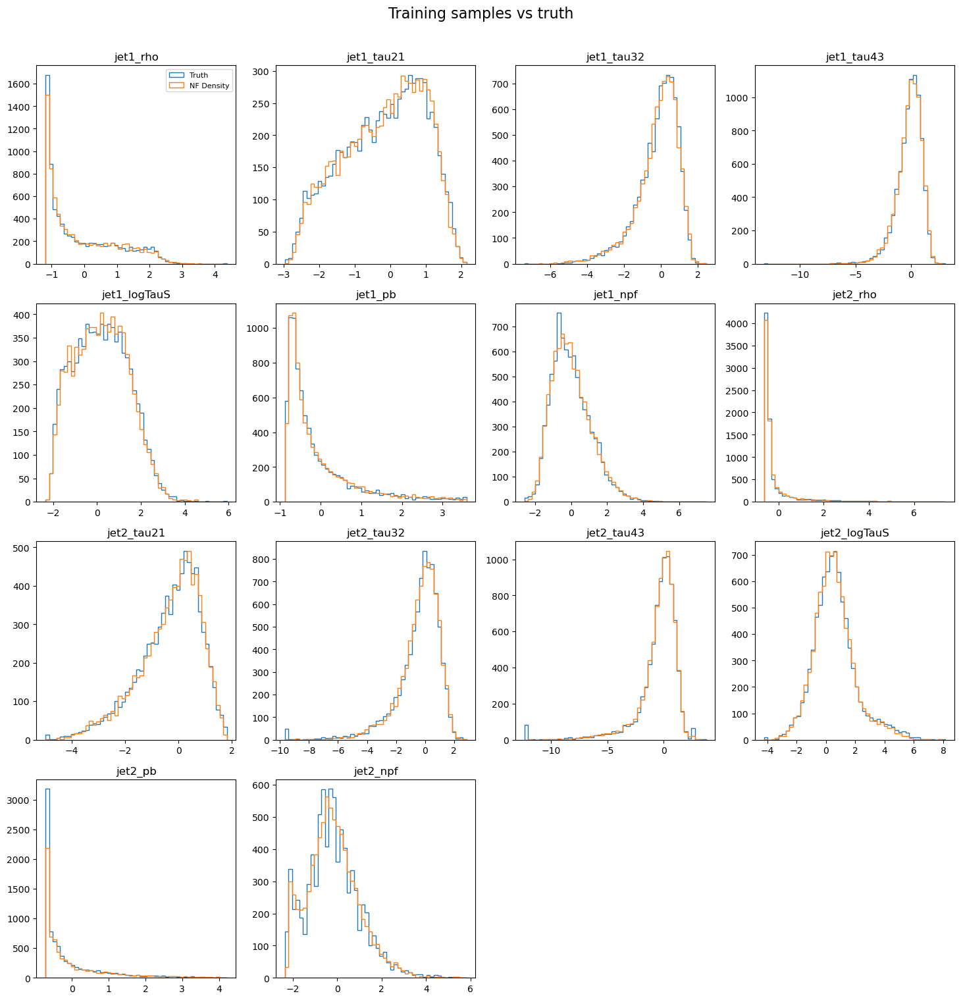

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 88.15it/s]


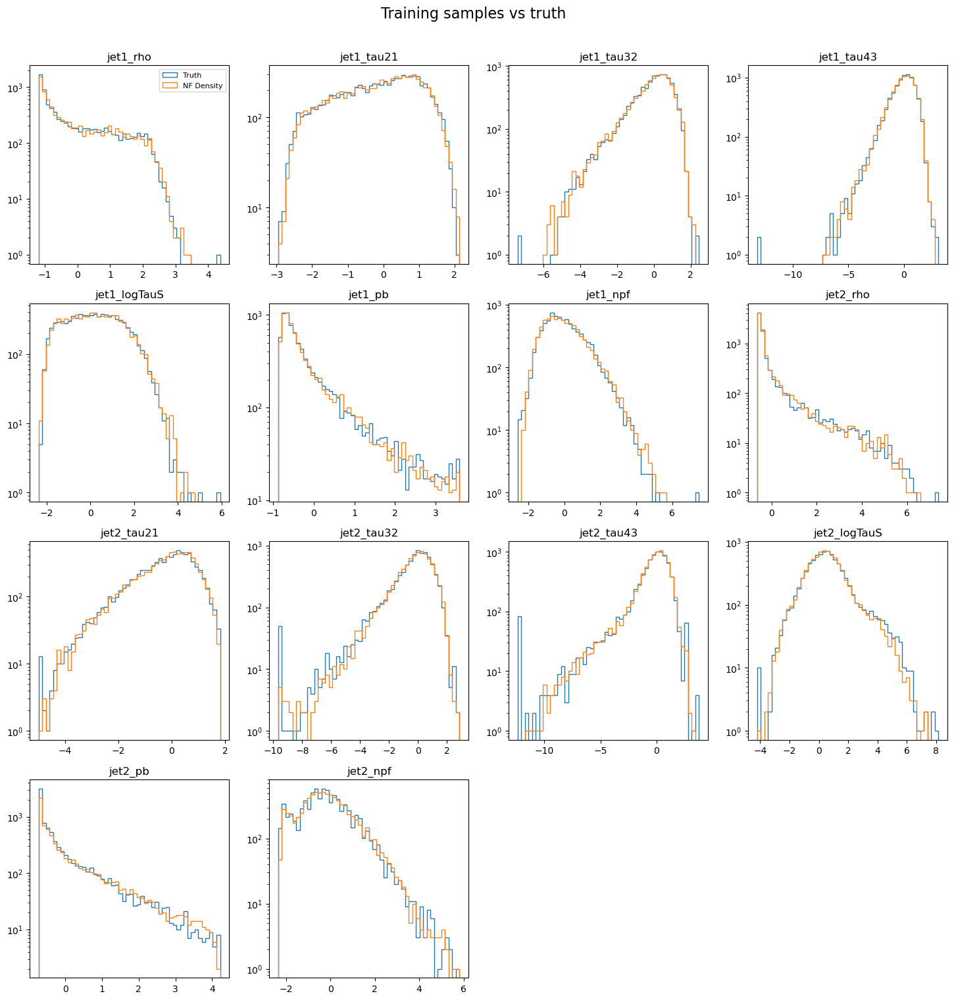

In [11]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "Qstar2000_W400"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=3000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Wkk3000_R400

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.78it/s]


72497 training events
Training flow Wkk3000_R400
Iteration 10 Complete
Loss:  16.665447235107422
Iteration 20 Complete
Loss:  15.367899894714355
Iteration 30 Complete
Loss:  14.643831253051758
Iteration 40 Complete
Loss:  13.880558967590332
Iteration 50 Complete
Loss:  13.557693481445312
Iteration 60 Complete
Loss:  13.580291748046875
Iteration 70 Complete
Loss:  14.066779136657715
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 75.64it/s]


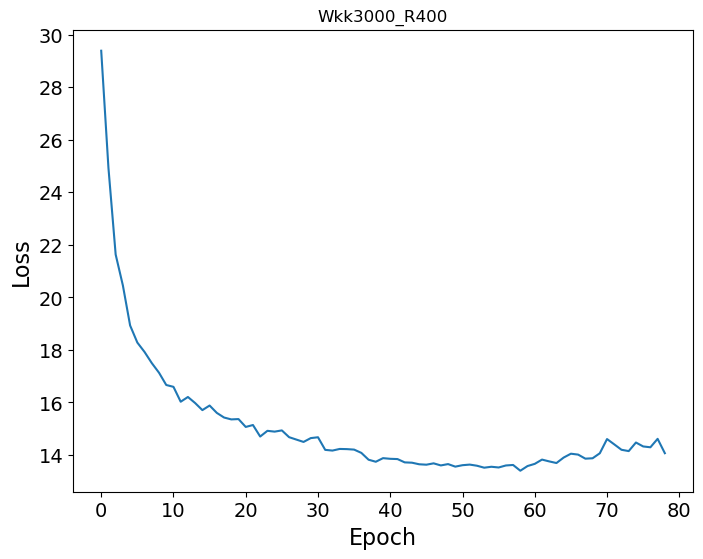

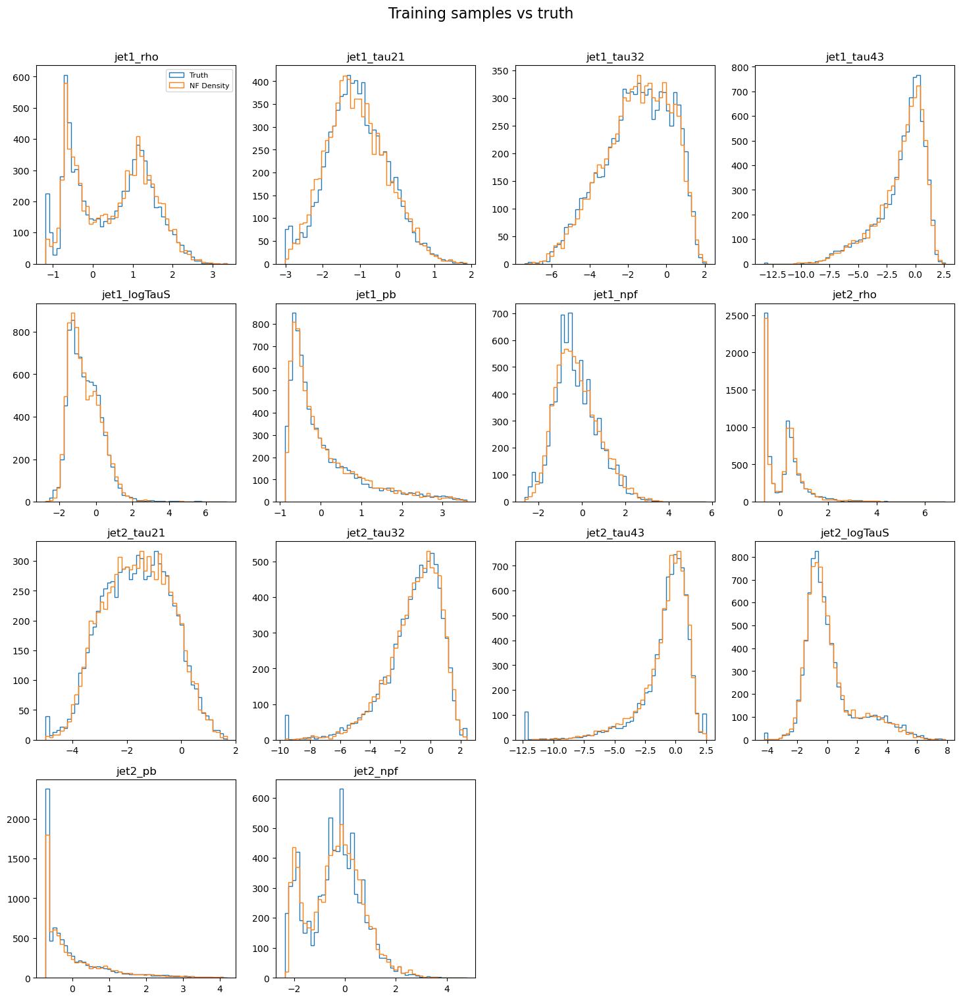

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 78.97it/s]


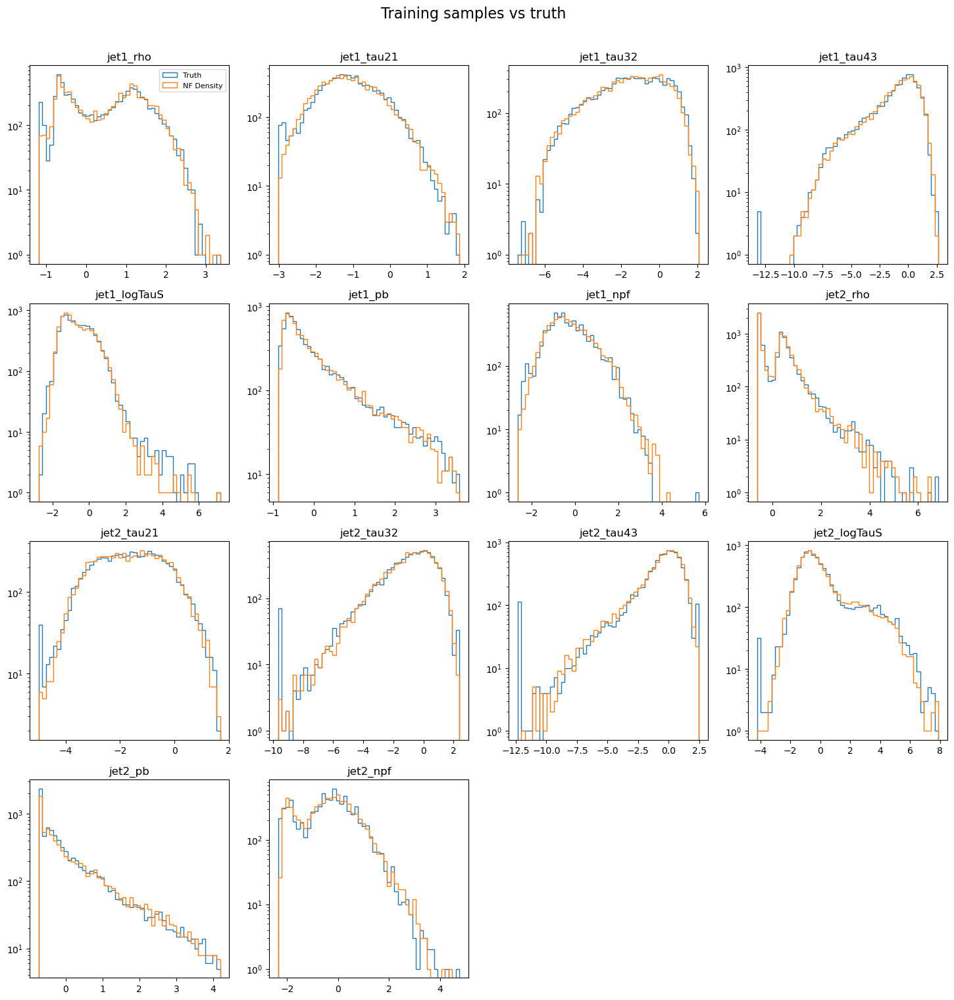

In [12]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "Wkk3000_R400"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=3000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# RSG3000

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


89615 training events
Training flow RSG3000
Iteration 10 Complete
Loss:  14.485882759094238
Iteration 20 Complete
Loss:  14.038556098937988
Iteration 30 Complete
Loss:  13.801313400268555
Iteration 40 Complete
Loss:  13.67796516418457
Iteration 50 Complete
Loss:  13.623409271240234
Iteration 60 Complete
Loss:  13.686514854431152
Iteration 70 Complete
Loss:  13.649789810180664
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 71.50it/s]


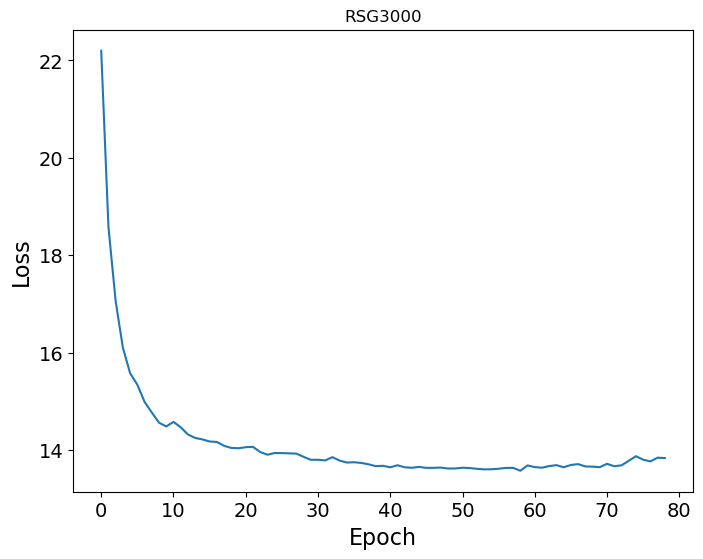

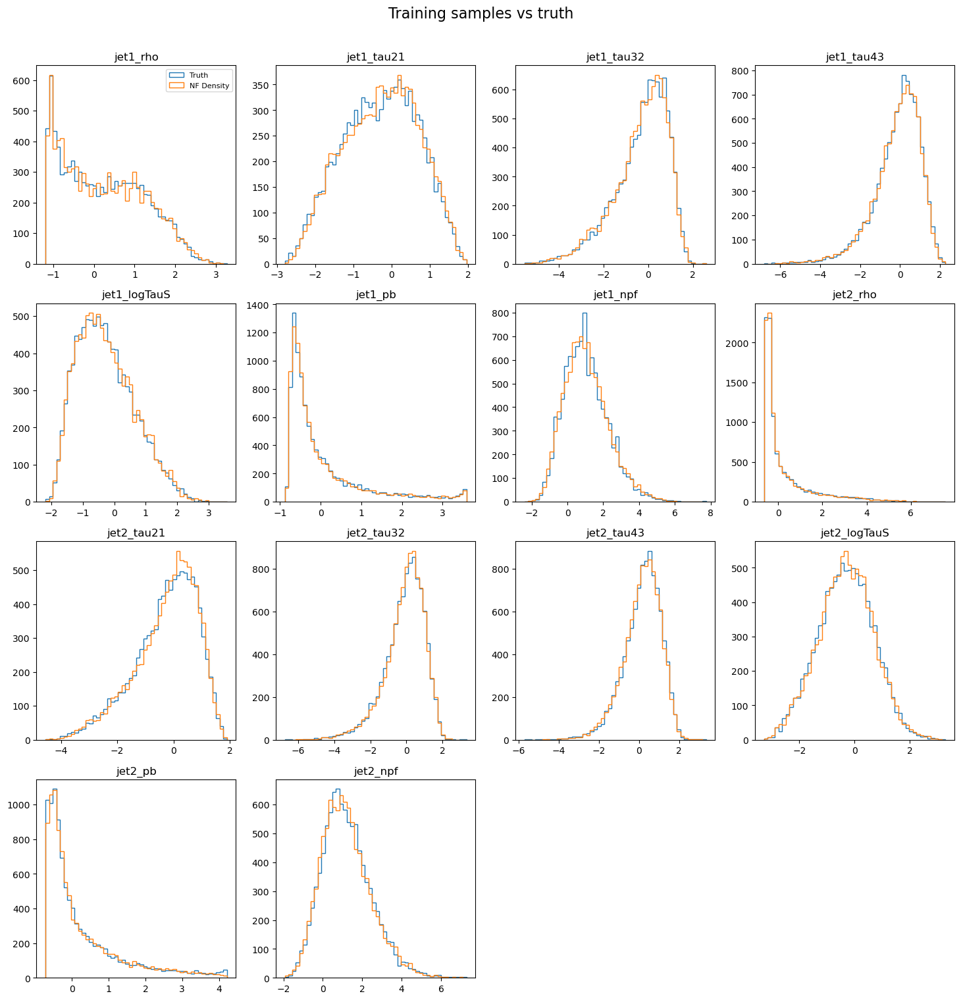

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 71.47it/s]


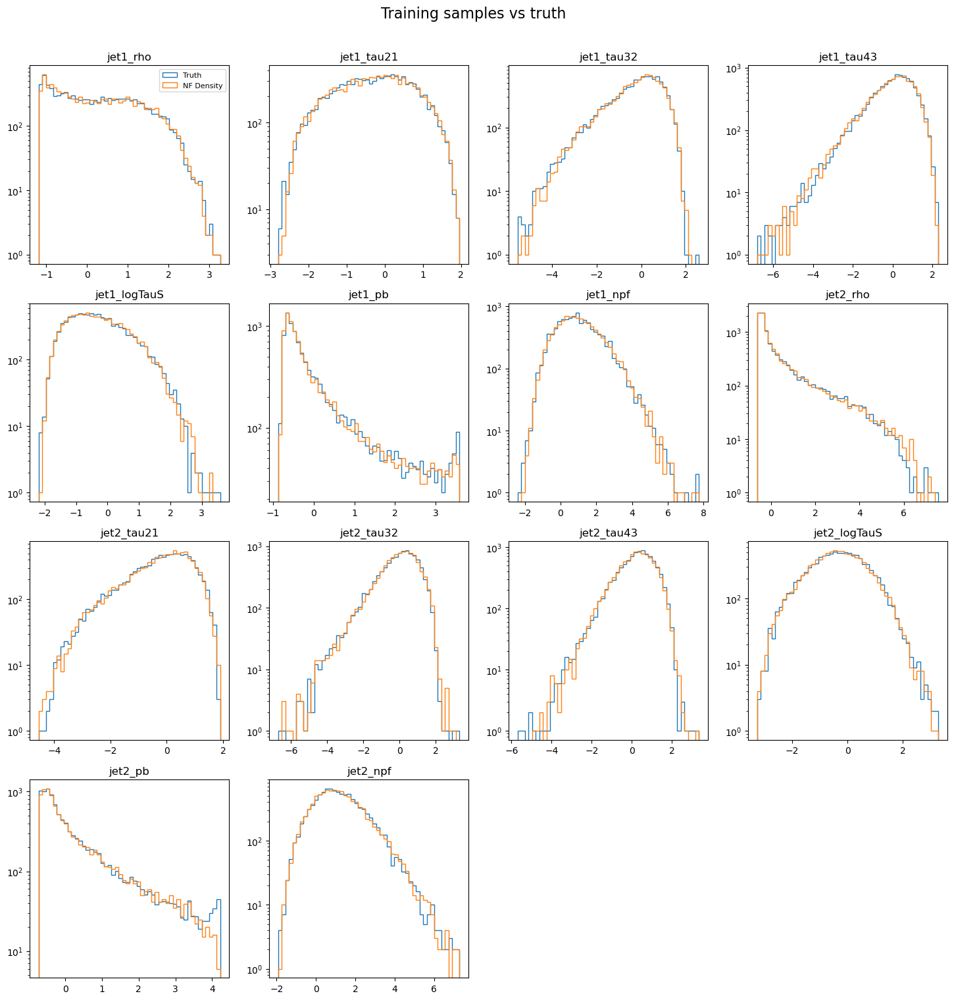

In [13]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "RSG3000"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=3000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Wp2000_B400_T170

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.83it/s]


73654 training events
Training flow Wp2000_B400_T170
Iteration 10 Complete
Loss:  16.158601760864258
Iteration 20 Complete
Loss:  15.351099014282227
Iteration 30 Complete
Loss:  15.121018409729004
Iteration 40 Complete
Loss:  14.956513404846191
Iteration 50 Complete
Loss:  14.92888069152832
Iteration 60 Complete
Loss:  14.934184074401855
Iteration 70 Complete
Loss:  14.98466682434082
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 82.47it/s]


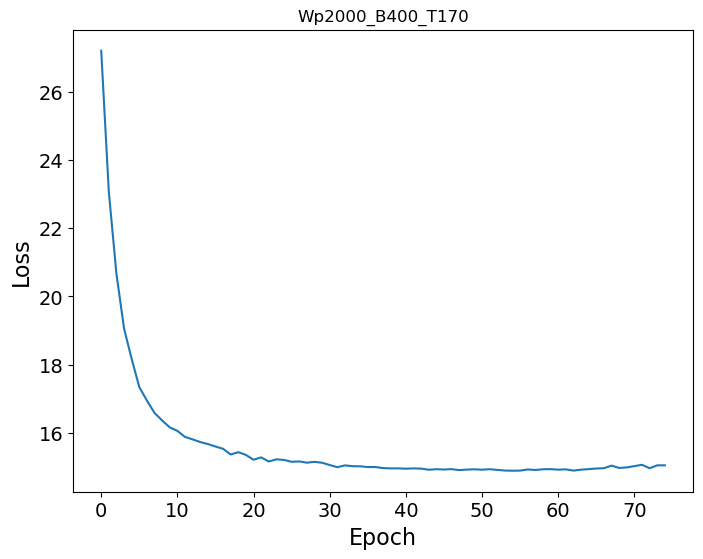

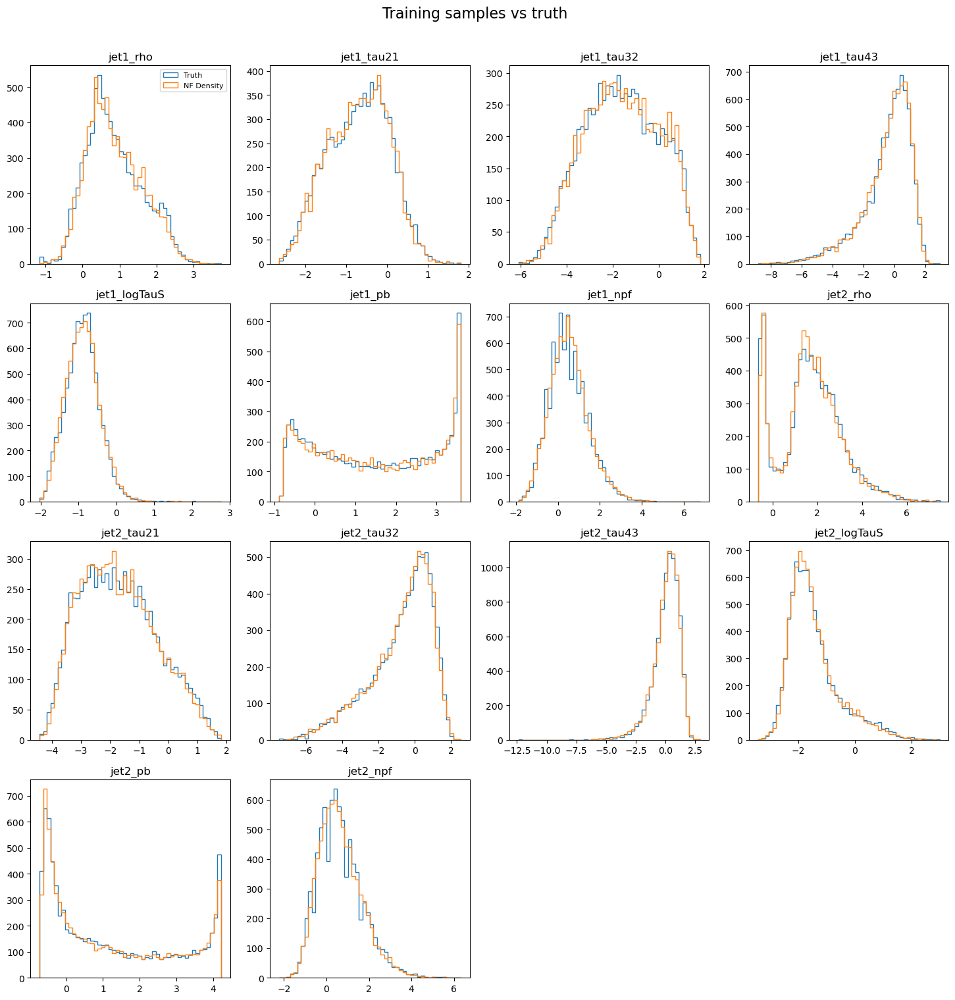

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 88.75it/s]


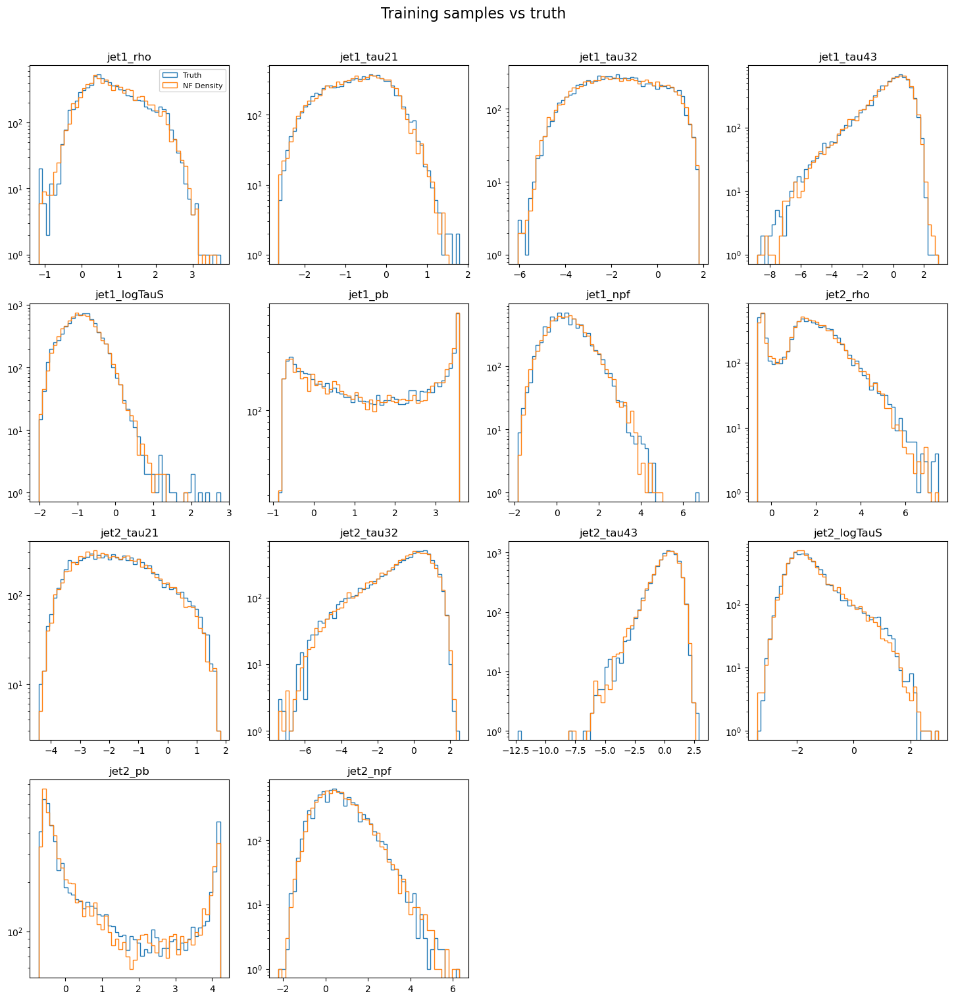

In [3]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "Wp2000_B400_T170"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=3000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Wp5000_B400_T170

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.88it/s]


81312 training events
Training flow Wp5000_B400_T170
Iteration 10 Complete
Loss:  17.465715408325195
Iteration 20 Complete
Loss:  16.74514389038086
Iteration 30 Complete
Loss:  16.4759521484375
Iteration 40 Complete
Loss:  16.371349334716797
Iteration 50 Complete
Loss:  16.313831329345703
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 85.12it/s]


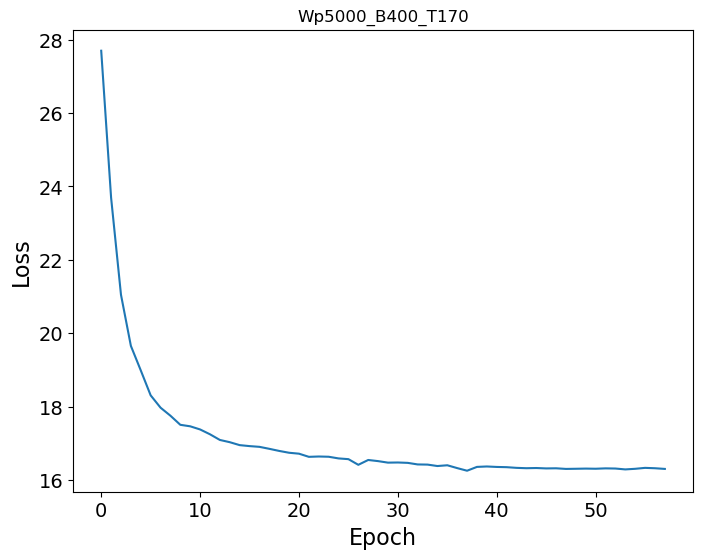

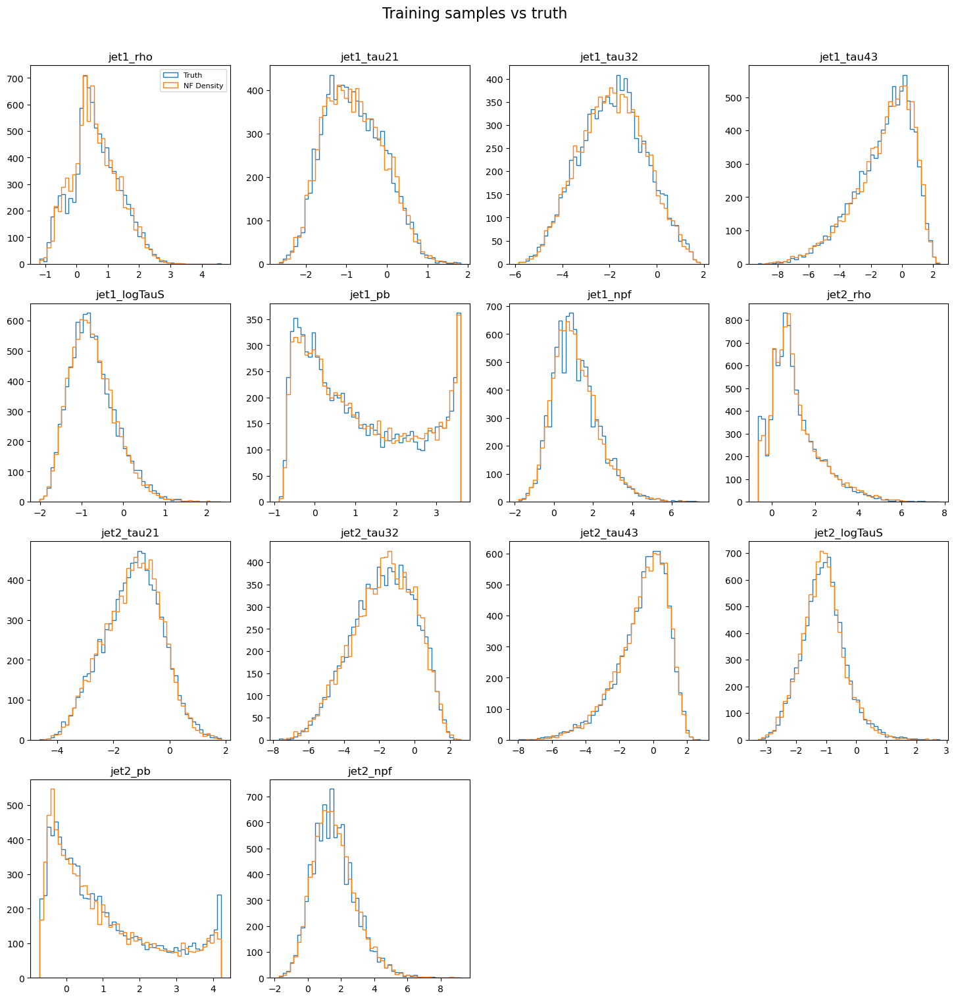

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 79.74it/s]


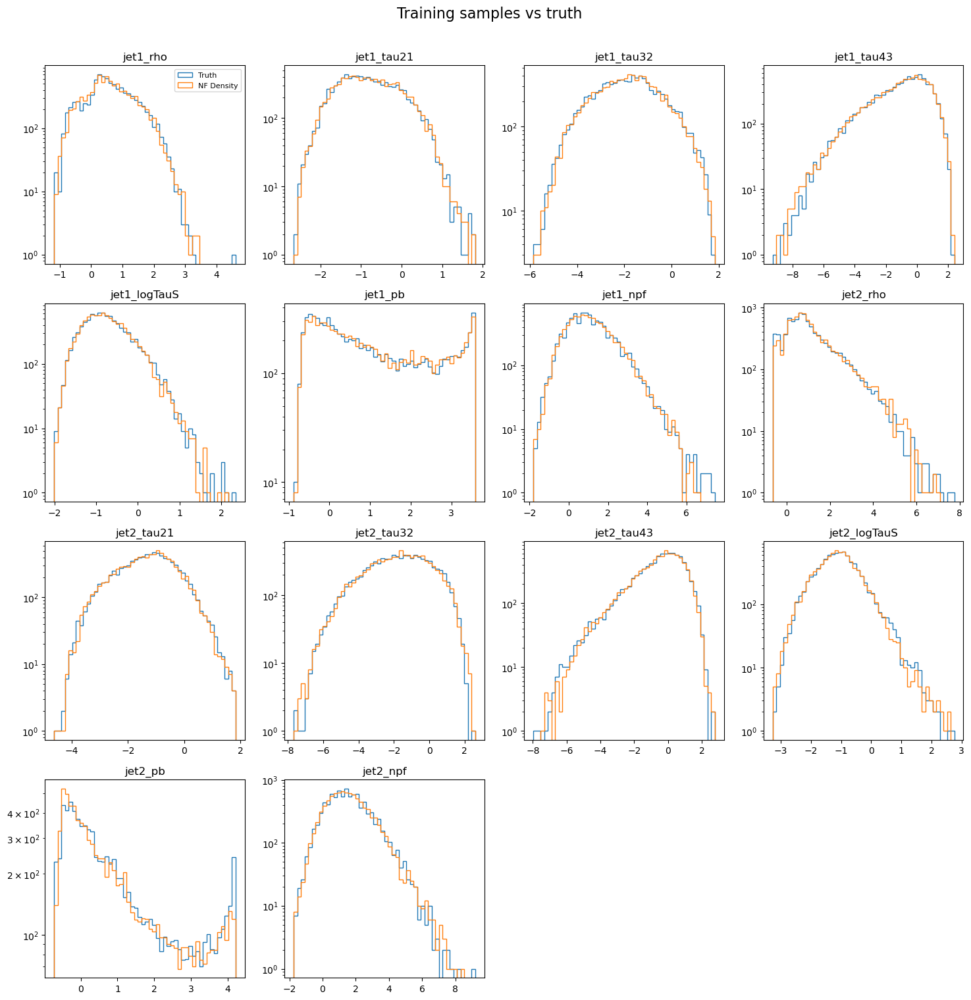

In [4]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = "Wp5000_B400_T170"
reference = "BKG"
modelName = sample+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=3000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Merged Wp_B400_T170

Loading train sample


100%|██████████| 1/1 [00:00<00:00, 73.89it/s]


loading Wp2000_B400_T170, 73654 events


100%|██████████| 1/1 [00:00<00:00,  9.63it/s]


loading Wp3000_B400_T170, 87874 events


100%|██████████| 1/1 [00:00<00:00, 64.32it/s]

loading Wp5000_B400_T170, 81312 events


242840 training events
Training flow Wp235_B400_T170_mjjCond
Iteration 10 Complete
Loss:  15.41317367553711
Iteration 20 Complete
Loss:  14.315912246704102
Iteration 30 Complete
Loss:  13.92928409576416
Iteration 40 Complete
Loss:  13.7650728225708
Iteration 50 Complete
Loss:  13.737625122070312
Iteration 60 Complete
Loss:  13.707124710083008
Iteration 70 Complete
Loss:  14.023808479309082
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 72.11it/s]


loading Wp2000_B400_T170, 8184 events


100%|██████████| 1/1 [00:00<00:00, 65.09it/s]


loading Wp3000_B400_T170, 9764 events


100%|██████████| 1/1 [00:00<00:00, 56.96it/s]

loading Wp5000_B400_T170, 9035 events


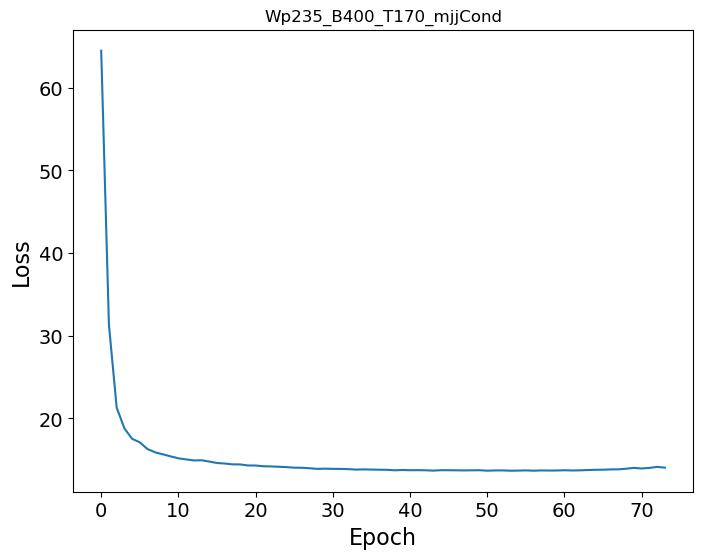

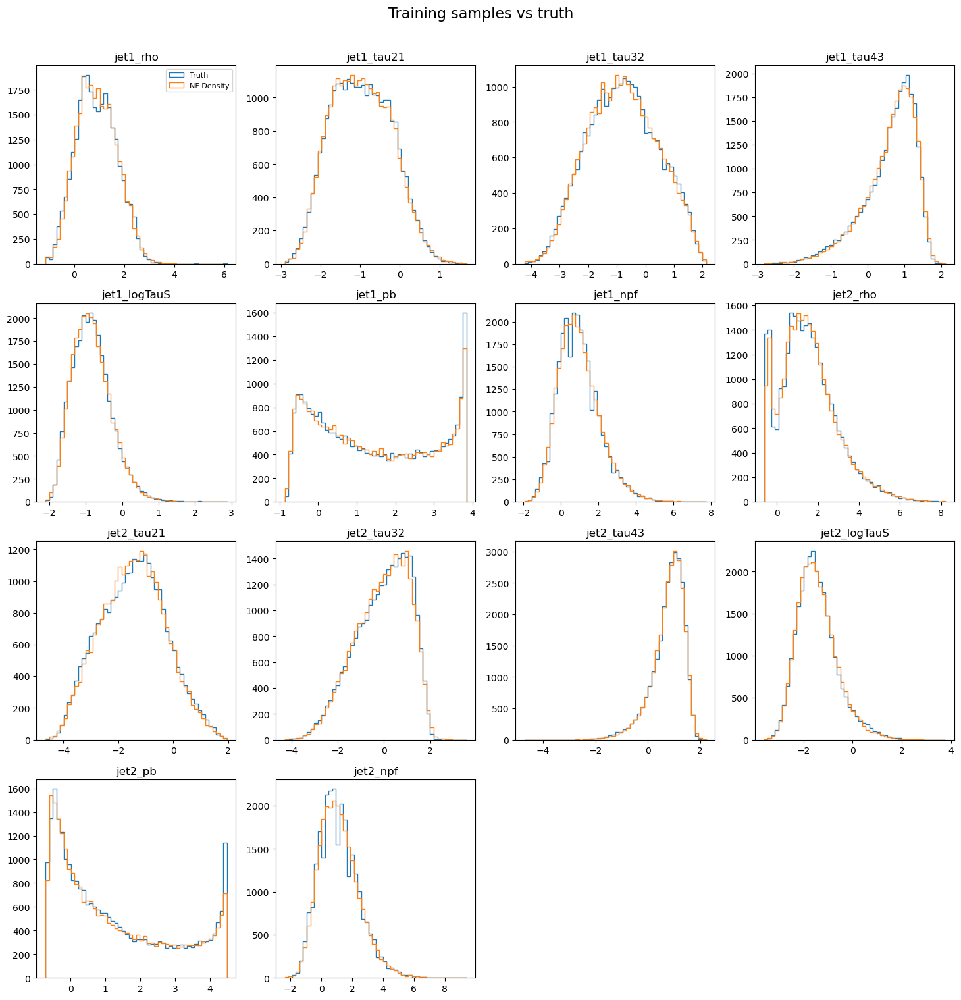

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 72.25it/s]


loading Wp2000_B400_T170, 8184 events


100%|██████████| 1/1 [00:00<00:00, 60.53it/s]


loading Wp3000_B400_T170, 9764 events


100%|██████████| 1/1 [00:00<00:00, 64.57it/s]

loading Wp5000_B400_T170, 9035 events


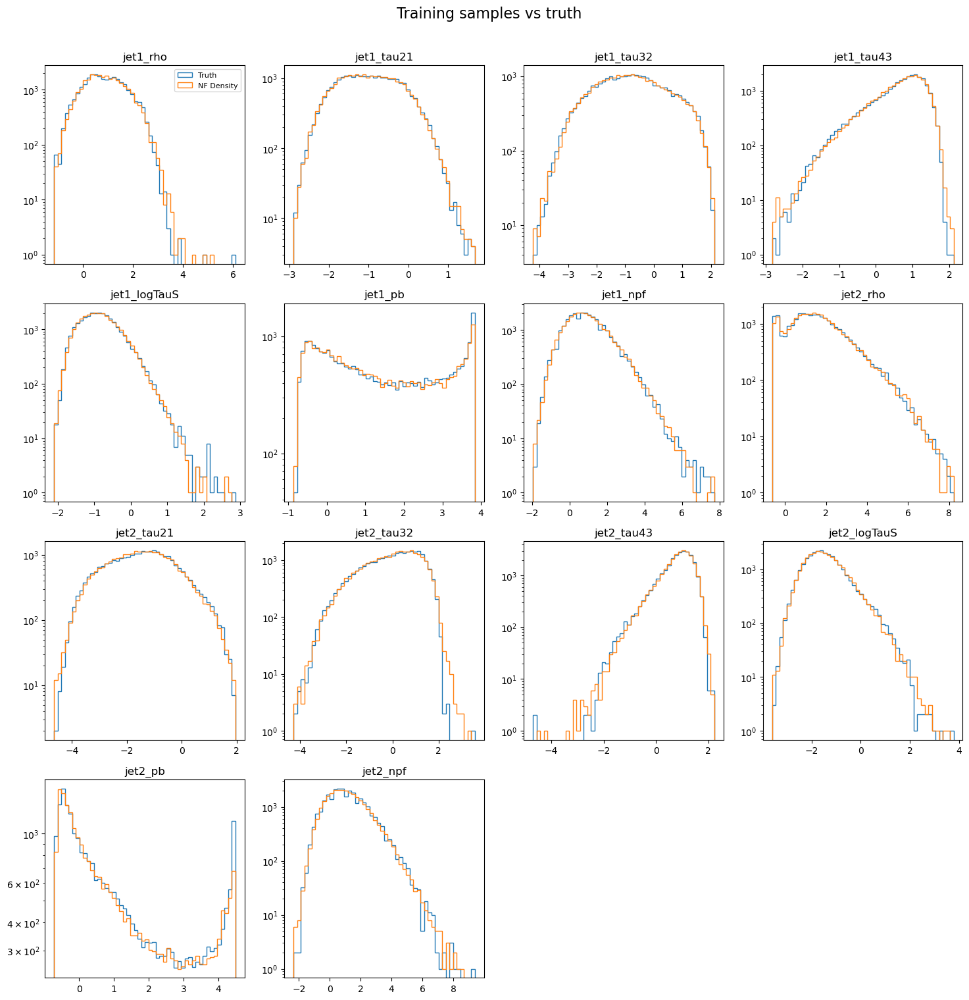

In [21]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = ["Wp2000_B400_T170","Wp3000_B400_T170","Wp5000_B400_T170"]
reference = "BKG"
modelName = "Wp235_B400_T170_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=5000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  4.20it/s]


loading Wp2000_B170_T170, 78782 events


100%|██████████| 1/1 [00:00<00:00,  4.53it/s]


loading Wp3000_B170_T170, 88371 events


100%|██████████| 1/1 [00:00<00:00,  6.05it/s]


loading Wp5000_B170_T170, 78171 events
245324 training events
Training flow Wp235_B170_T170_mjjCond
Iteration 10 Complete
Loss:  15.126280784606934
Iteration 20 Complete
Loss:  14.025839805603027
Iteration 30 Complete
Loss:  13.676342010498047
Iteration 40 Complete
Loss:  13.517274856567383
Iteration 50 Complete
Loss:  13.487750053405762
Iteration 60 Complete
Loss:  13.484713554382324
Iteration 70 Complete
Loss:  13.755768775939941
Iteration 80 Complete
Loss:  13.782821655273438
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 61.36it/s]


loading Wp2000_B170_T170, 8754 events


100%|██████████| 1/1 [00:00<00:00, 55.54it/s]


loading Wp3000_B170_T170, 9820 events


100%|██████████| 1/1 [00:00<00:00, 61.73it/s]

loading Wp5000_B170_T170, 8686 events


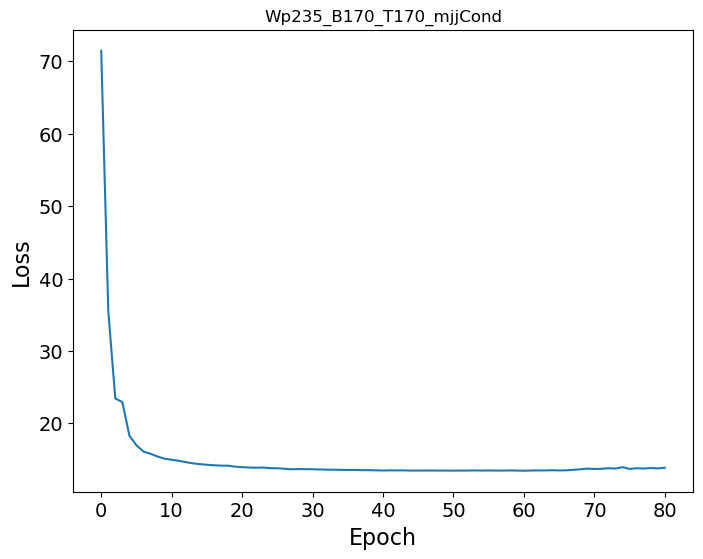

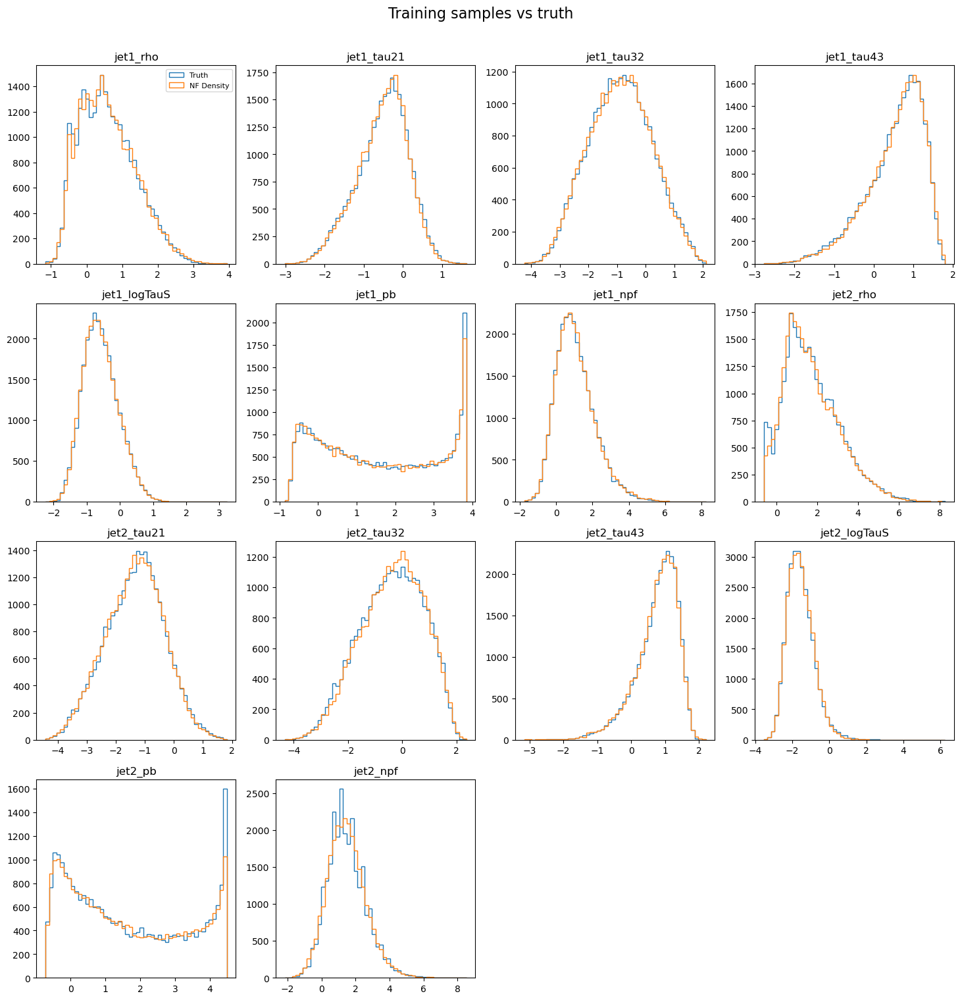

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 69.68it/s]


loading Wp2000_B170_T170, 8754 events


100%|██████████| 1/1 [00:00<00:00, 64.98it/s]


loading Wp3000_B170_T170, 9820 events


100%|██████████| 1/1 [00:00<00:00, 69.63it/s]

loading Wp5000_B170_T170, 8686 events


In [ ]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
sample = ["Wp2000_B170_T170","Wp3000_B170_T170","Wp5000_B170_T170"]
reference = "BKG"
modelName = "Wp235_B170_T170_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 1000000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=5000,n_epoch=200,patience=20,learning_rate=1e-4,T_max=50,eta_min=1e-5,print_interval=10)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Combined trainings based on daughter mass, 2 & 3 TeV resonances

In [4]:
from samples import daughterGroups_2and3TeV
print(daughterGroups_2and3TeV.keys())

dict_keys(['M25-25', 'M25-80', 'M25-170', 'M25-400', 'M80-80', 'M80-170', 'M80-400', 'M170-170', 'M170-400', 'M400-400'])


Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


loading XYY2000_Y25_Yp25, 50000 events


100%|██████████| 1/1 [00:00<00:00,  3.28it/s]


loading XYY3000_Y25_Yp25, 50000 events
100000 training events
Training flow M25-25
Iteration 10 Complete
Loss:  9.954968452453613
Iteration 20 Complete
Loss:  9.127869606018066
Iteration 30 Complete
Loss:  8.784217834472656
Iteration 40 Complete
Loss:  8.555130958557129
Iteration 50 Complete
Loss:  8.410184860229492
Iteration 60 Complete
Loss:  8.423473358154297
Iteration 70 Complete
Loss:  8.611786842346191
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 70.13it/s]


loading XYY2000_Y25_Yp25, 10992 events


100%|██████████| 1/1 [00:00<00:00, 72.36it/s]

loading XYY3000_Y25_Yp25, 11131 events


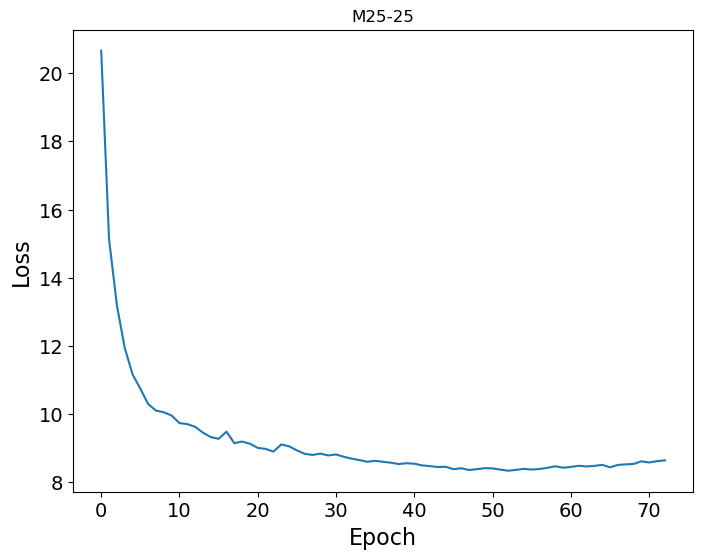

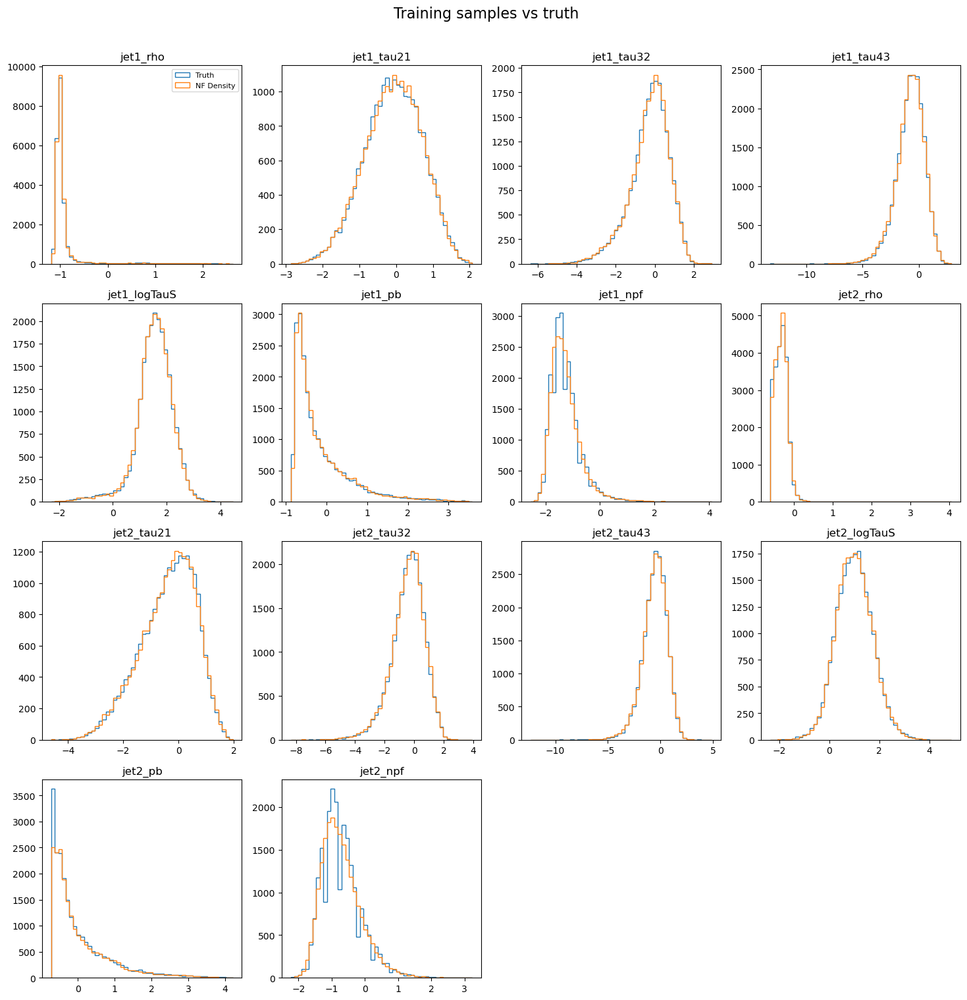

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 69.25it/s]


loading XYY2000_Y25_Yp25, 10992 events


100%|██████████| 1/1 [00:00<00:00, 74.74it/s]

loading XYY3000_Y25_Yp25, 11131 events


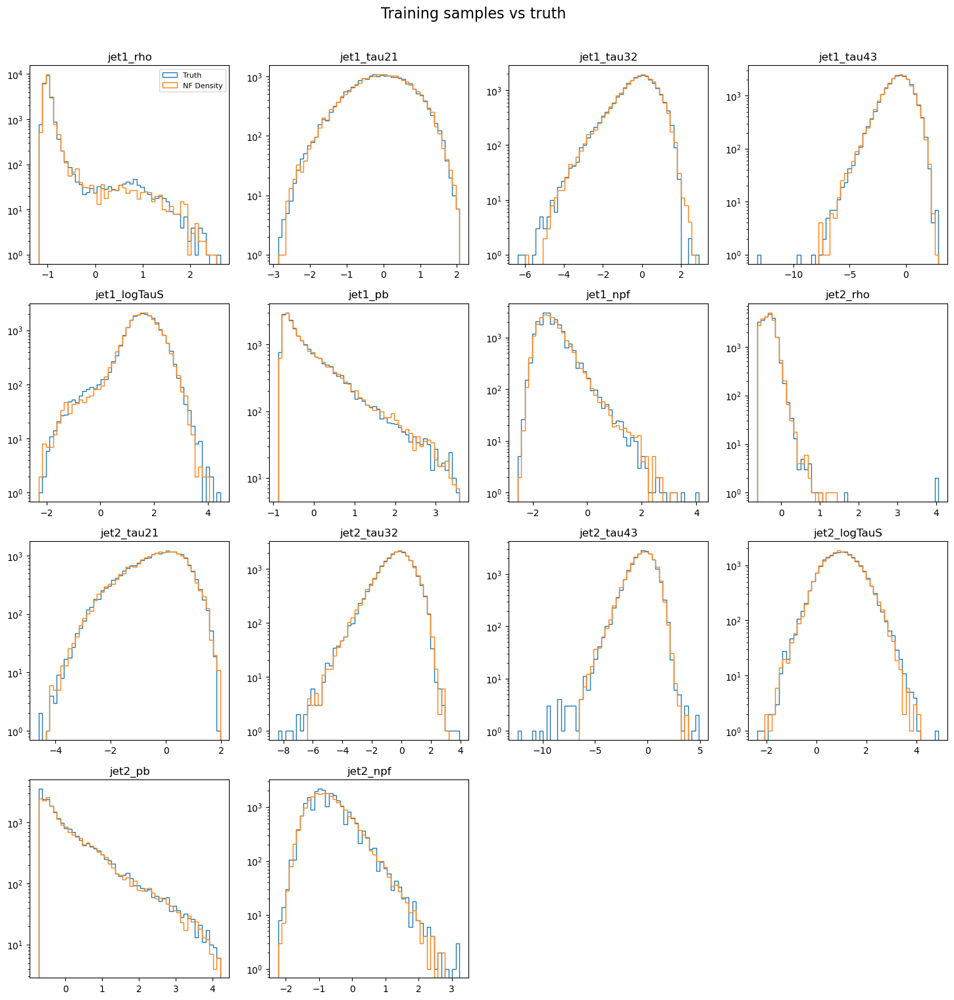

In [15]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M25-25"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.15it/s]


loading XYY2000_Y25_Yp80, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.18it/s]


loading XYY3000_Y25_Yp80, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.34it/s]


loading XYY3000_Y80_Yp25, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


loading XYY2000_Y80_Yp25, 25000 events
100000 training events
Training flow M25-80
Iteration 10 Complete
Loss:  11.11877155303955
Iteration 20 Complete
Loss:  10.465004920959473
Iteration 30 Complete
Loss:  10.120437622070312
Iteration 40 Complete
Loss:  9.913412094116211
Iteration 50 Complete
Loss:  9.828184127807617
Iteration 60 Complete
Loss:  9.844795227050781
Iteration 70 Complete
Loss:  9.916171073913574
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 77.00it/s]


loading XYY2000_Y25_Yp80, 10999 events


100%|██████████| 1/1 [00:00<00:00, 75.46it/s]


loading XYY3000_Y25_Yp80, 11122 events


100%|██████████| 1/1 [00:00<00:00, 79.18it/s]


loading XYY3000_Y80_Yp25, 11114 events


100%|██████████| 1/1 [00:00<00:00, 78.33it/s]

loading XYY2000_Y80_Yp25, 10973 events


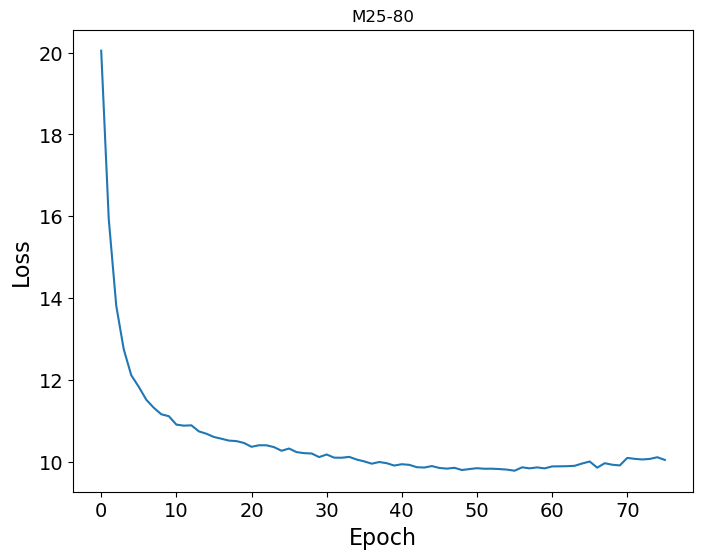

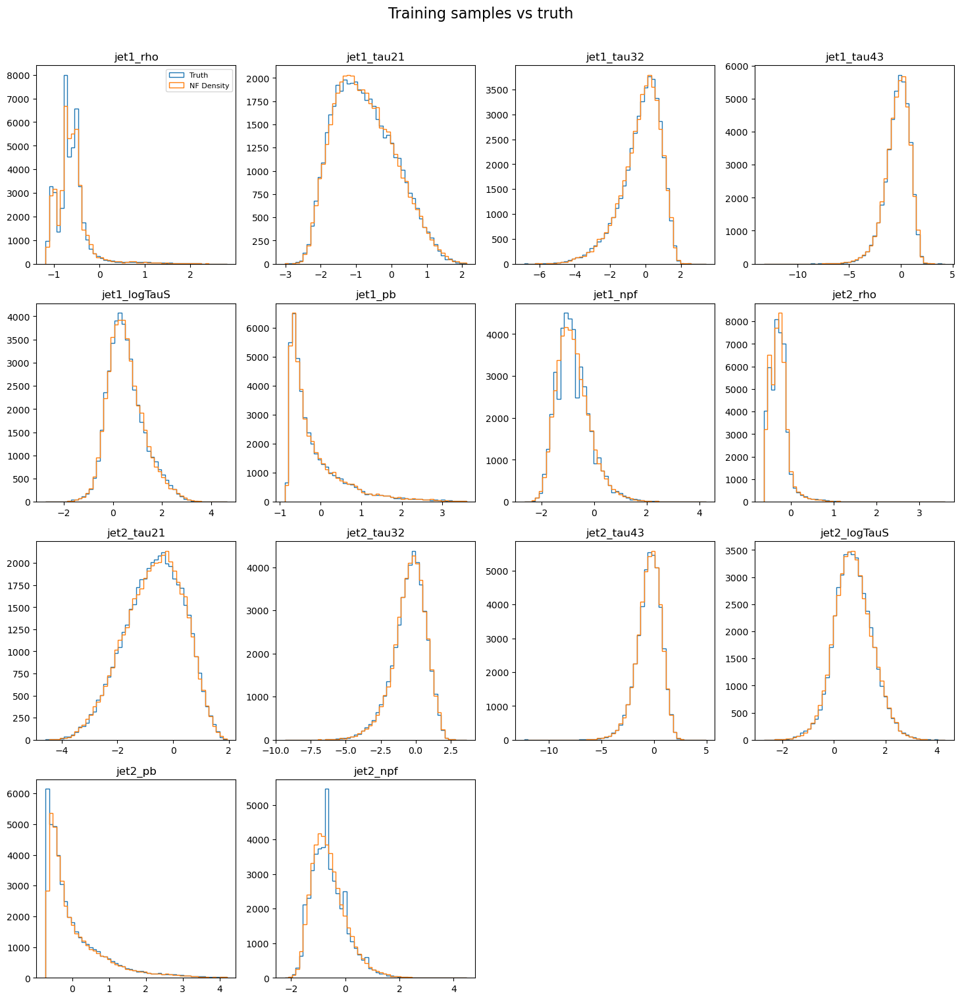

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 74.43it/s]


loading XYY2000_Y25_Yp80, 10999 events


100%|██████████| 1/1 [00:00<00:00, 75.02it/s]


loading XYY3000_Y25_Yp80, 11122 events


100%|██████████| 1/1 [00:00<00:00, 70.85it/s]


loading XYY3000_Y80_Yp25, 11114 events


100%|██████████| 1/1 [00:00<00:00, 74.93it/s]

loading XYY2000_Y80_Yp25, 10973 events


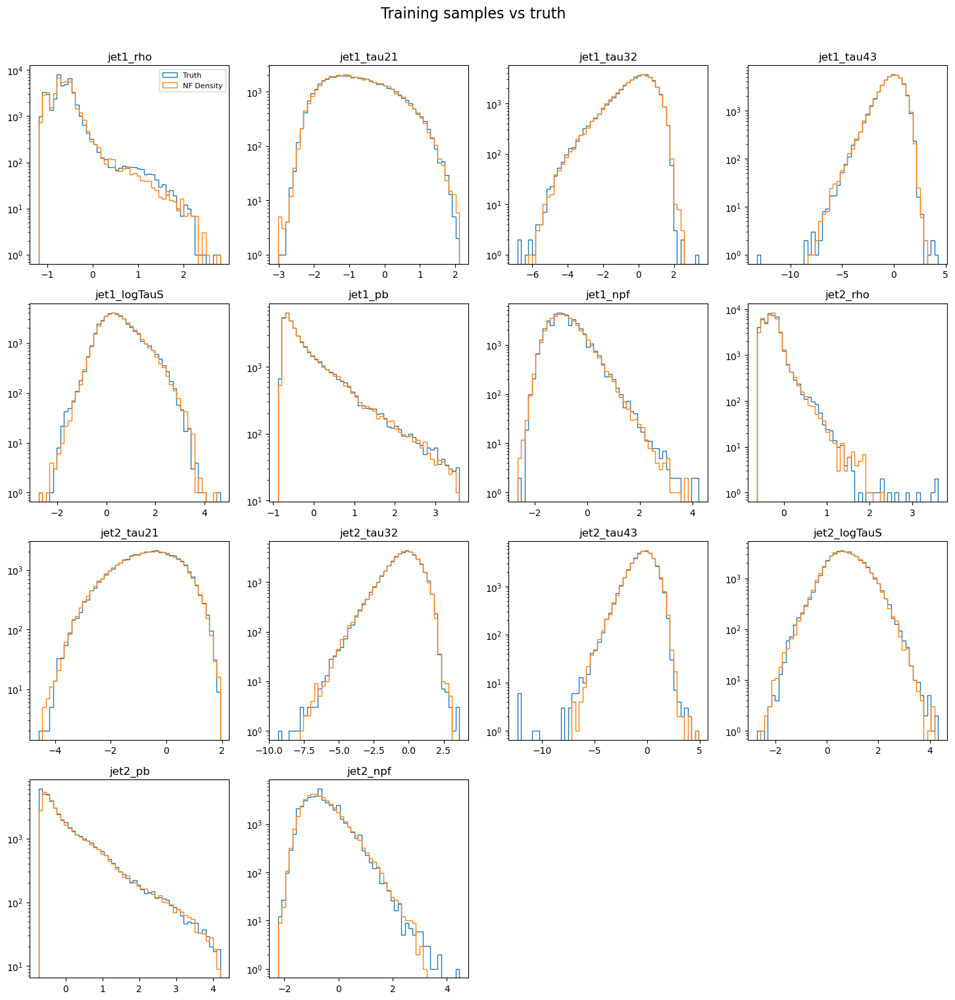

In [16]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M25-80"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.72it/s]


loading Wp2000_B25_T170, 20000 events


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


loading Wp3000_B25_T170, 20000 events


100%|██████████| 1/1 [00:00<00:00,  3.61it/s]


loading XYY3000_Y170_Yp25, 20000 events


100%|██████████| 1/1 [00:00<00:00,  4.85it/s]


loading XYY2000_Y170_Yp25, 20000 events


100%|██████████| 1/1 [00:00<00:00,  3.76it/s]


loading XYY3000_Y25_Yp170, 20000 events
100000 training events
Training flow M25-170
Iteration 10 Complete
Loss:  14.406049728393555
Iteration 20 Complete
Loss:  13.712446212768555
Iteration 30 Complete
Loss:  13.413859367370605
Iteration 40 Complete
Loss:  13.190202713012695
Iteration 50 Complete
Loss:  13.12860107421875
Iteration 60 Complete
Loss:  13.194103240966797
Iteration 70 Complete
Loss:  13.235369682312012
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 70.66it/s]


loading Wp2000_B25_T170, 8237 events


100%|██████████| 1/1 [00:00<00:00, 67.92it/s]


loading Wp3000_B25_T170, 9994 events


100%|██████████| 1/1 [00:00<00:00, 66.88it/s]


loading XYY3000_Y170_Yp25, 11114 events


100%|██████████| 1/1 [00:00<00:00, 73.27it/s]


loading XYY2000_Y170_Yp25, 10895 events


100%|██████████| 1/1 [00:00<00:00, 67.21it/s]

loading XYY3000_Y25_Yp170, 10451 events


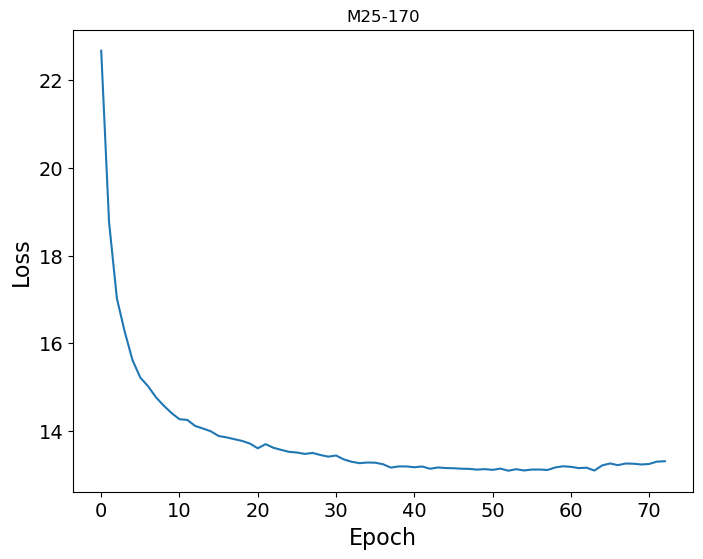

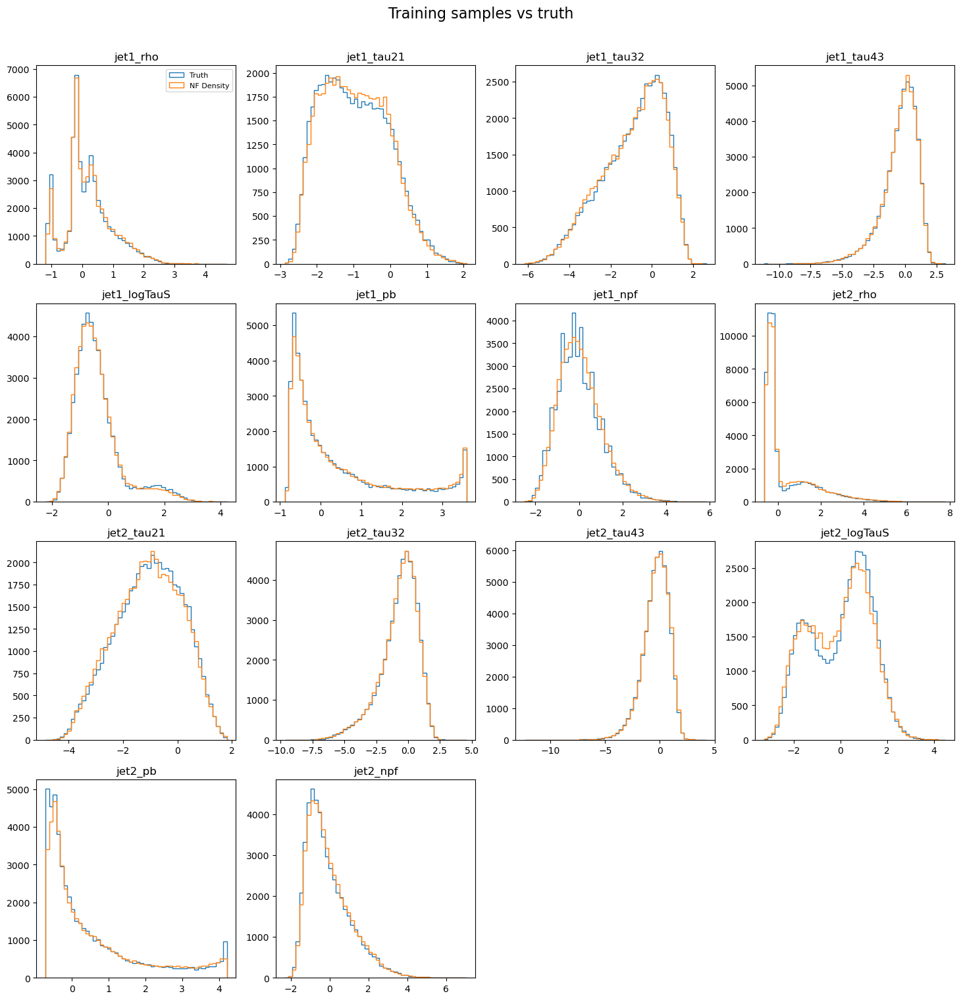

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 68.72it/s]


loading Wp2000_B25_T170, 8237 events


100%|██████████| 1/1 [00:00<00:00, 62.65it/s]


loading Wp3000_B25_T170, 9994 events


100%|██████████| 1/1 [00:00<00:00, 64.08it/s]


loading XYY3000_Y170_Yp25, 11114 events


100%|██████████| 1/1 [00:00<00:00, 73.08it/s]


loading XYY2000_Y170_Yp25, 10895 events


100%|██████████| 1/1 [00:00<00:00, 67.02it/s]

loading XYY3000_Y25_Yp170, 10451 events


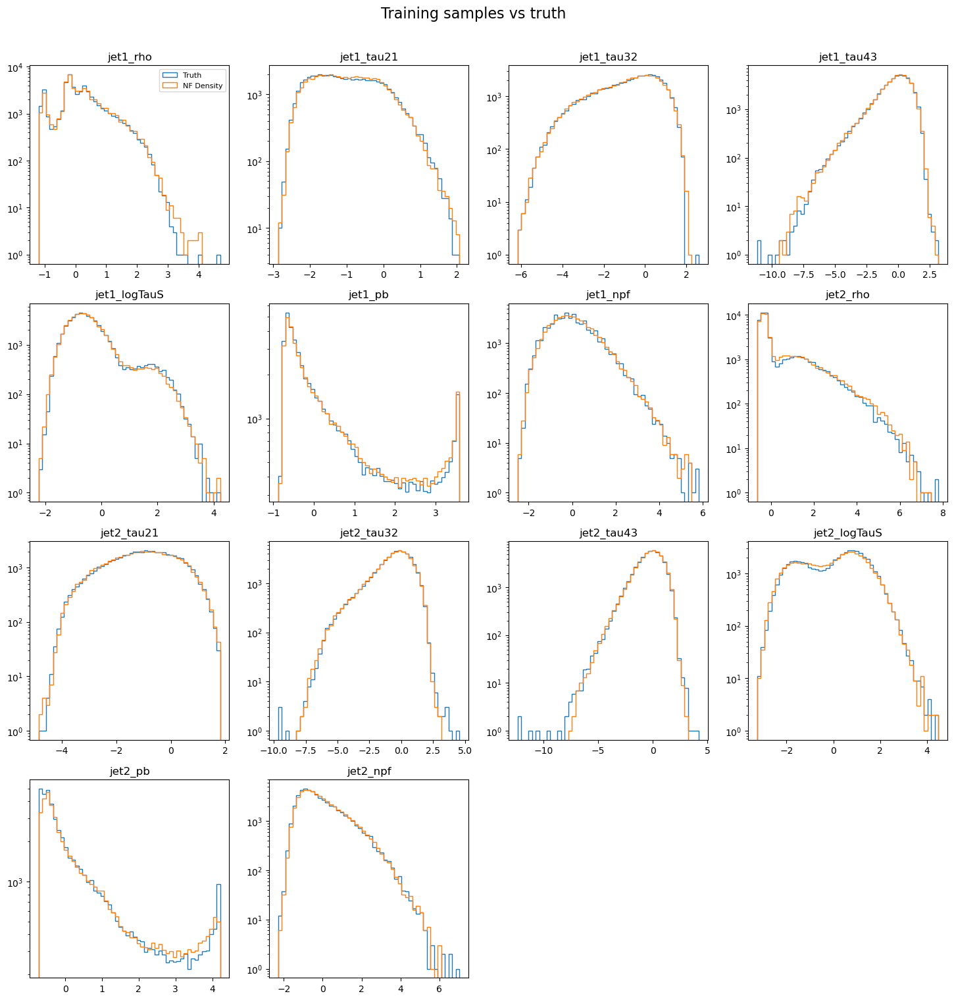

In [17]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M25-170"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.46it/s]


loading XYY2000_Y400_Yp25, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.52it/s]


loading XYY3000_Y25_Yp400, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.07it/s]


loading XYY3000_Y400_Yp25, 25000 events


100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


loading XYY2000_Y25_Yp400, 25000 events
100000 training events
Training flow M25-400
Iteration 10 Complete
Loss:  11.85180950164795
Iteration 20 Complete
Loss:  11.157891273498535
Iteration 30 Complete
Loss:  10.963111877441406
Iteration 40 Complete
Loss:  10.770275115966797
Iteration 50 Complete
Loss:  10.60880184173584
Iteration 60 Complete
Loss:  10.692212104797363
Iteration 70 Complete
Loss:  10.792783737182617
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 70.91it/s]


loading XYY2000_Y400_Yp25, 10586 events


100%|██████████| 1/1 [00:00<00:00, 71.79it/s]


loading XYY3000_Y25_Yp400, 11120 events


100%|██████████| 1/1 [00:00<00:00, 72.60it/s]


loading XYY3000_Y400_Yp25, 11030 events


100%|██████████| 1/1 [00:00<00:00, 77.56it/s]

loading XYY2000_Y25_Yp400, 10936 events


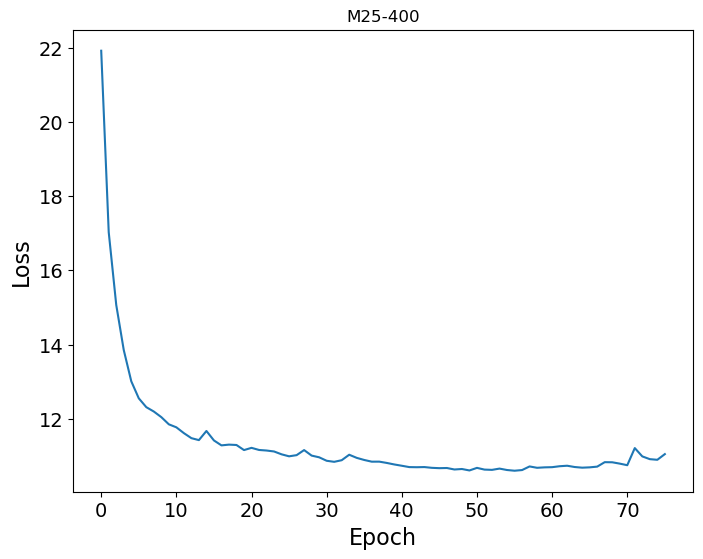

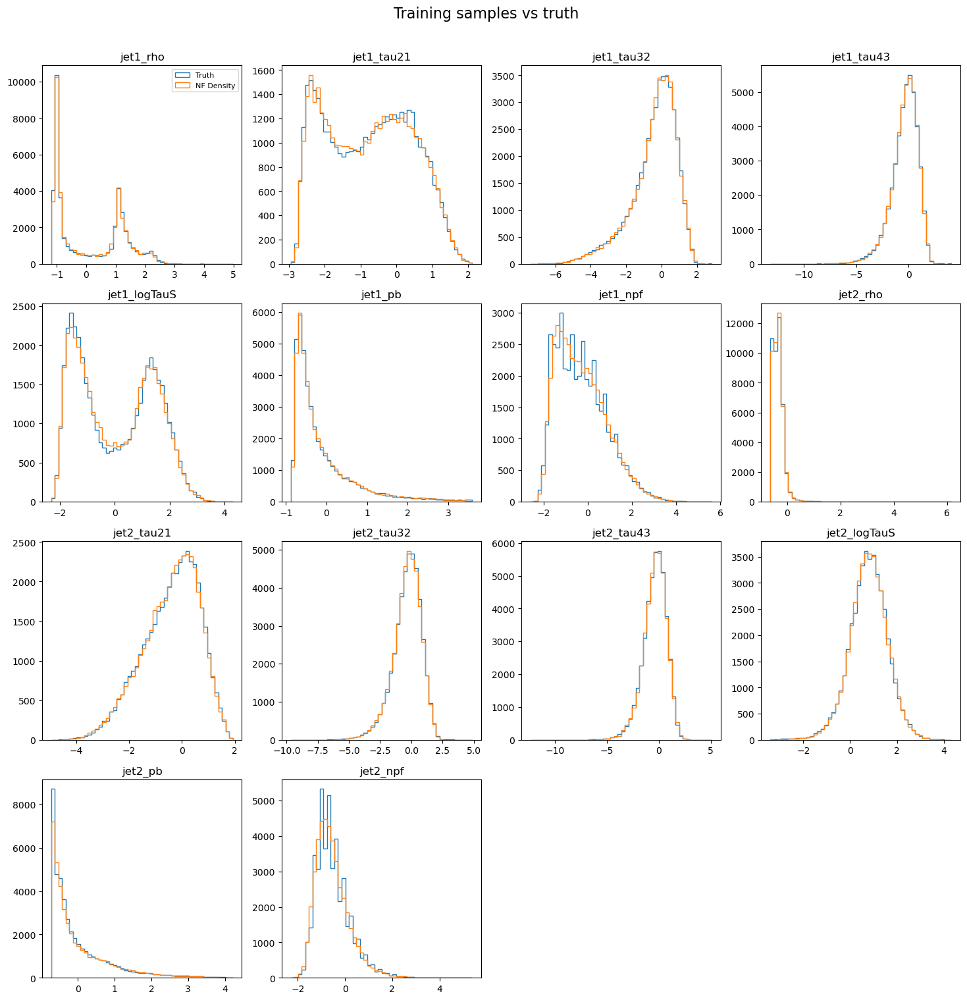

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 70.52it/s]


loading XYY2000_Y400_Yp25, 10586 events


100%|██████████| 1/1 [00:00<00:00, 75.65it/s]


loading XYY3000_Y25_Yp400, 11120 events


100%|██████████| 1/1 [00:00<00:00, 76.71it/s]


loading XYY3000_Y400_Yp25, 11030 events


100%|██████████| 1/1 [00:00<00:00, 71.61it/s]

loading XYY2000_Y25_Yp400, 10936 events


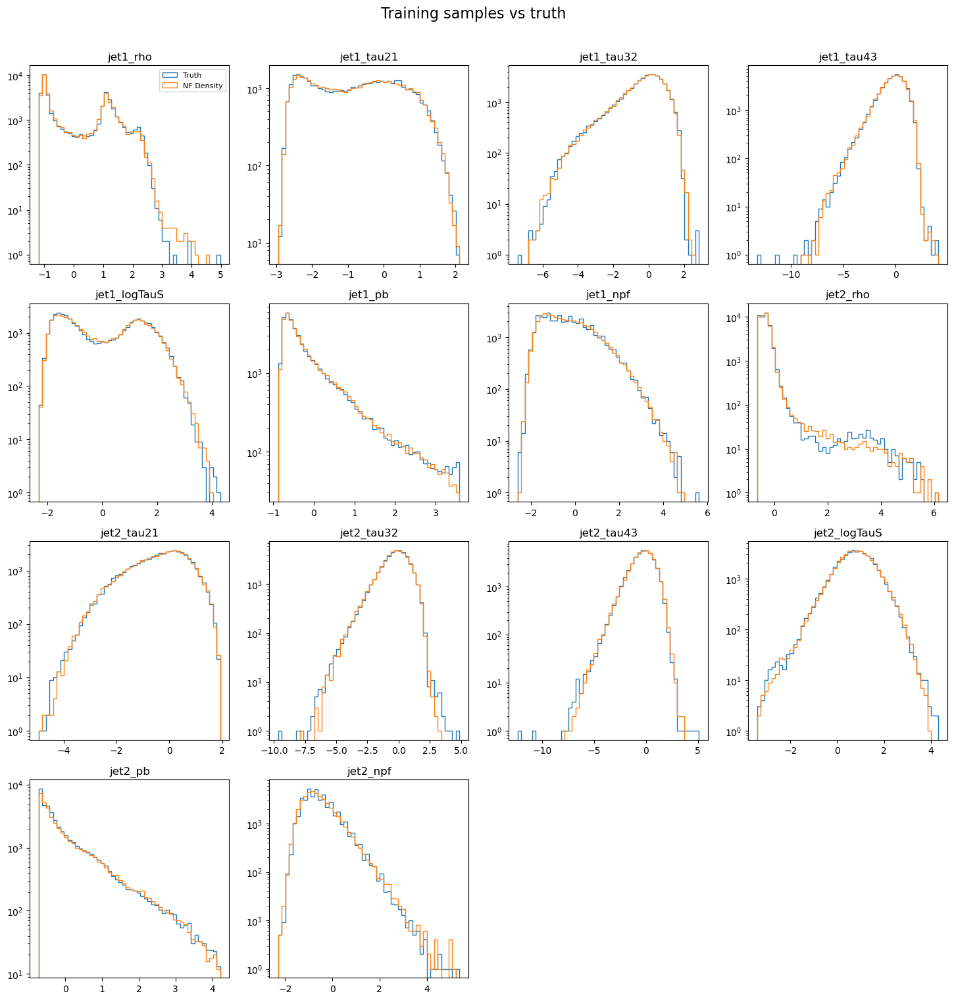

In [18]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M25-400"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.71it/s]


loading XYY2000_Y80_Yp80, 50000 events


100%|██████████| 1/1 [00:00<00:00,  6.30it/s]


loading XYY3000_Y80_Yp80, 22039 events
72039 training events
Training flow M80-80
Iteration 10 Complete
Loss:  11.571812629699707
Iteration 20 Complete
Loss:  10.710404396057129
Iteration 30 Complete
Loss:  10.363479614257812
Iteration 40 Complete
Loss:  10.17613697052002
Iteration 50 Complete
Loss:  10.110194206237793
Iteration 60 Complete
Loss:  10.130009651184082
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 71.27it/s]


loading XYY2000_Y80_Yp80, 10985 events


100%|██████████| 1/1 [00:00<00:00, 100.20it/s]

loading XYY3000_Y80_Yp80, 2449 events


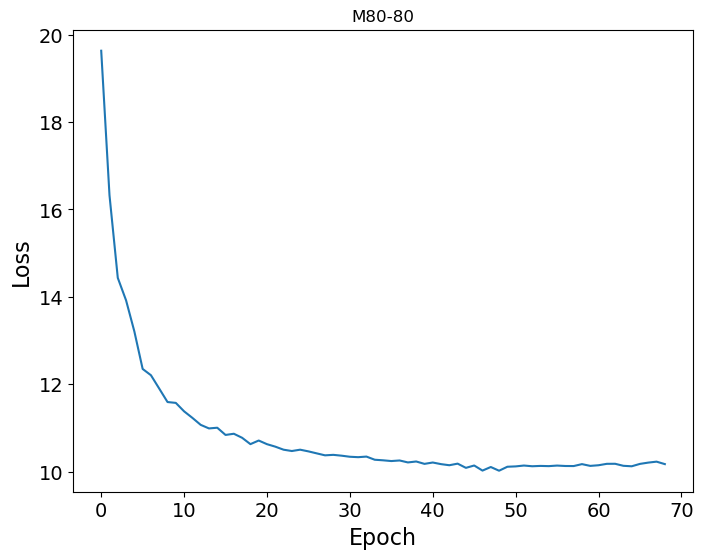

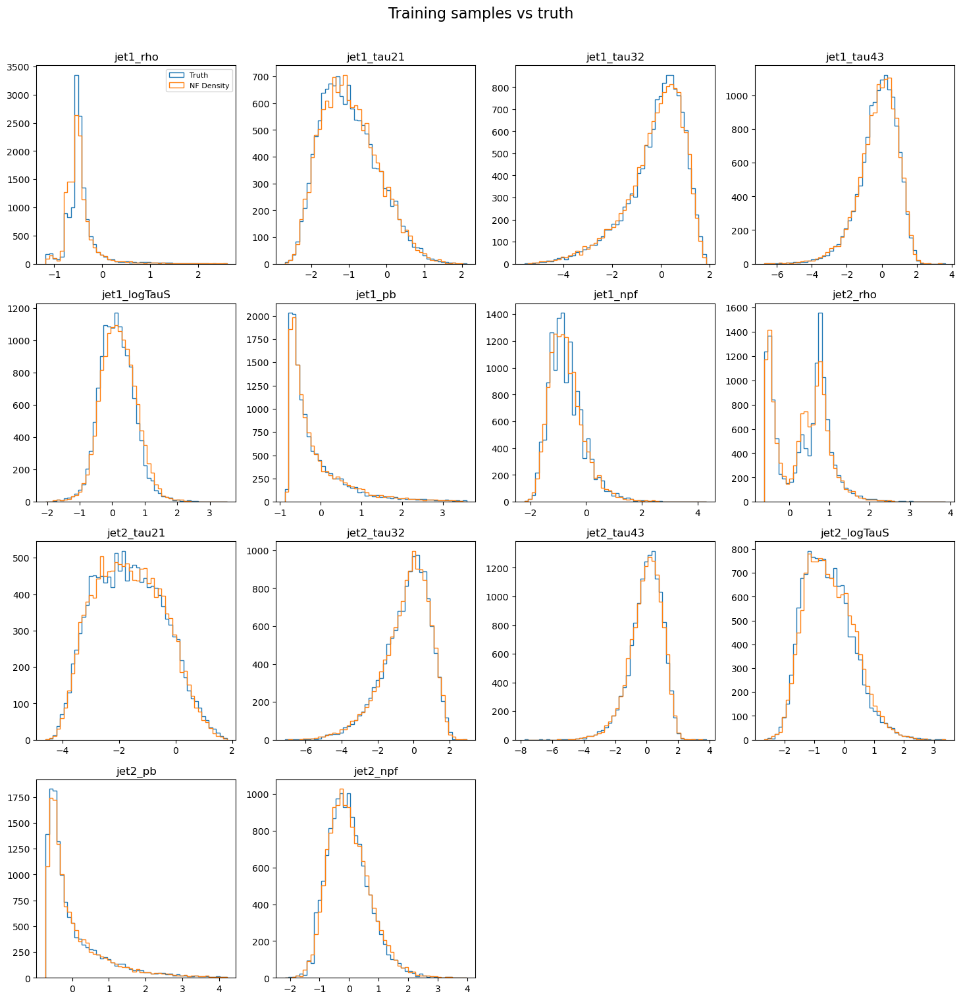

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 68.13it/s]


loading XYY2000_Y80_Yp80, 10985 events


100%|██████████| 1/1 [00:00<00:00, 98.23it/s]

loading XYY3000_Y80_Yp80, 2449 events


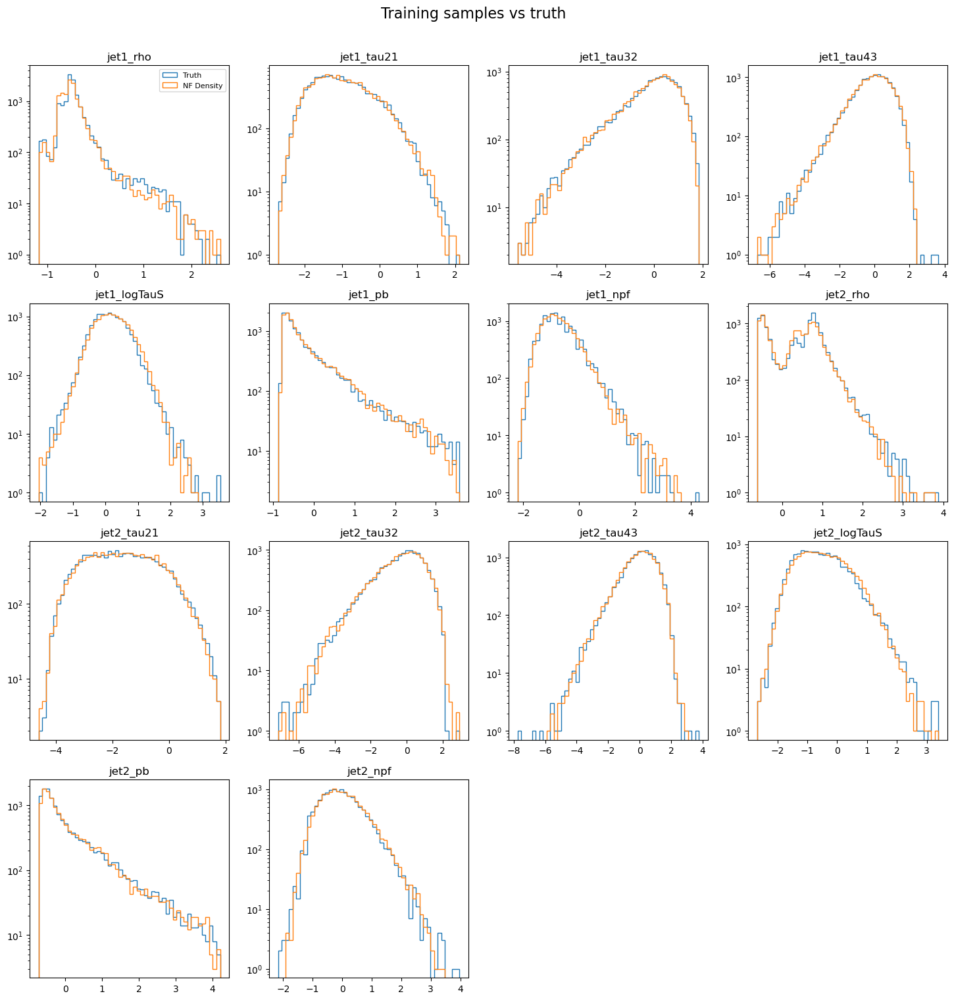

In [19]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M80-80"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00, 84.70it/s]


loading Wkk2000_R170, 12500 events


100%|██████████| 1/1 [00:00<00:00, 74.46it/s]


loading Wkk3000_R170, 12500 events


100%|██████████| 1/1 [00:00<00:00, 78.88it/s]


loading Wp2000_B80_T170, 12500 events


100%|██████████| 1/1 [00:00<00:00, 68.87it/s]


loading Wp3000_B80_T170, 12500 events


100%|██████████| 1/1 [00:00<00:00, 69.18it/s]


loading XYY2000_Y80_Yp170, 12500 events


100%|██████████| 1/1 [00:00<00:00, 80.80it/s]


loading XYY2000_Y170_Yp80, 12500 events


100%|██████████| 1/1 [00:00<00:00, 70.78it/s]


loading XYY3000_Y170_Yp80, 12500 events


100%|██████████| 1/1 [00:00<00:00, 70.81it/s]

loading XYY3000_Y80_Yp170, 12500 events


100000 training events
Training flow M80-170
Iteration 10 Complete
Loss:  15.205338478088379
Iteration 20 Complete
Loss:  14.360321044921875
Iteration 30 Complete
Loss:  14.030407905578613
Iteration 40 Complete
Loss:  13.834745407104492
Iteration 50 Complete
Loss:  13.720765113830566
Iteration 60 Complete
Loss:  13.778193473815918
Iteration 70 Complete
Loss:  13.867432594299316
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 89.33it/s]


loading Wkk2000_R170, 6867 events


100%|██████████| 1/1 [00:00<00:00, 81.07it/s]


loading Wkk3000_R170, 8411 events


100%|██████████| 1/1 [00:00<00:00, 90.08it/s]


loading Wp2000_B80_T170, 8341 events


100%|██████████| 1/1 [00:00<00:00, 77.30it/s]


loading Wp3000_B80_T170, 9991 events


100%|██████████| 1/1 [00:00<00:00, 75.09it/s]


loading XYY2000_Y80_Yp170, 10981 events


100%|██████████| 1/1 [00:00<00:00, 77.24it/s]


loading XYY2000_Y170_Yp80, 10918 events


100%|██████████| 1/1 [00:00<00:00, 71.54it/s]


loading XYY3000_Y170_Yp80, 11110 events


100%|██████████| 1/1 [00:00<00:00, 76.07it/s]

loading XYY3000_Y80_Yp170, 11123 events


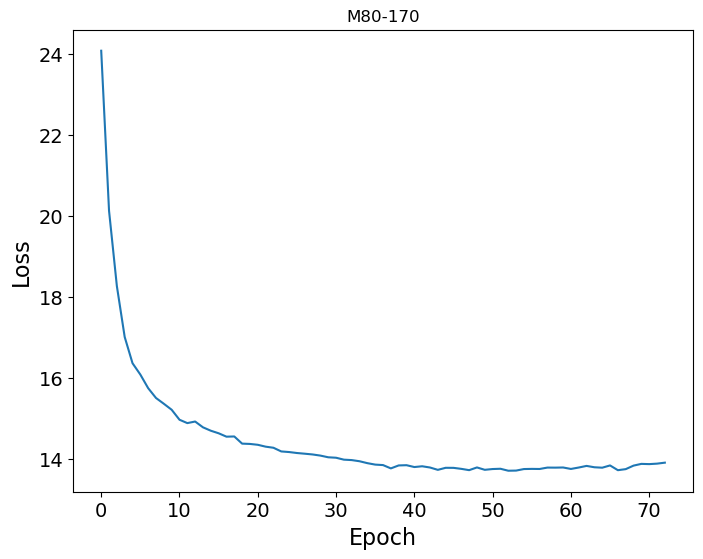

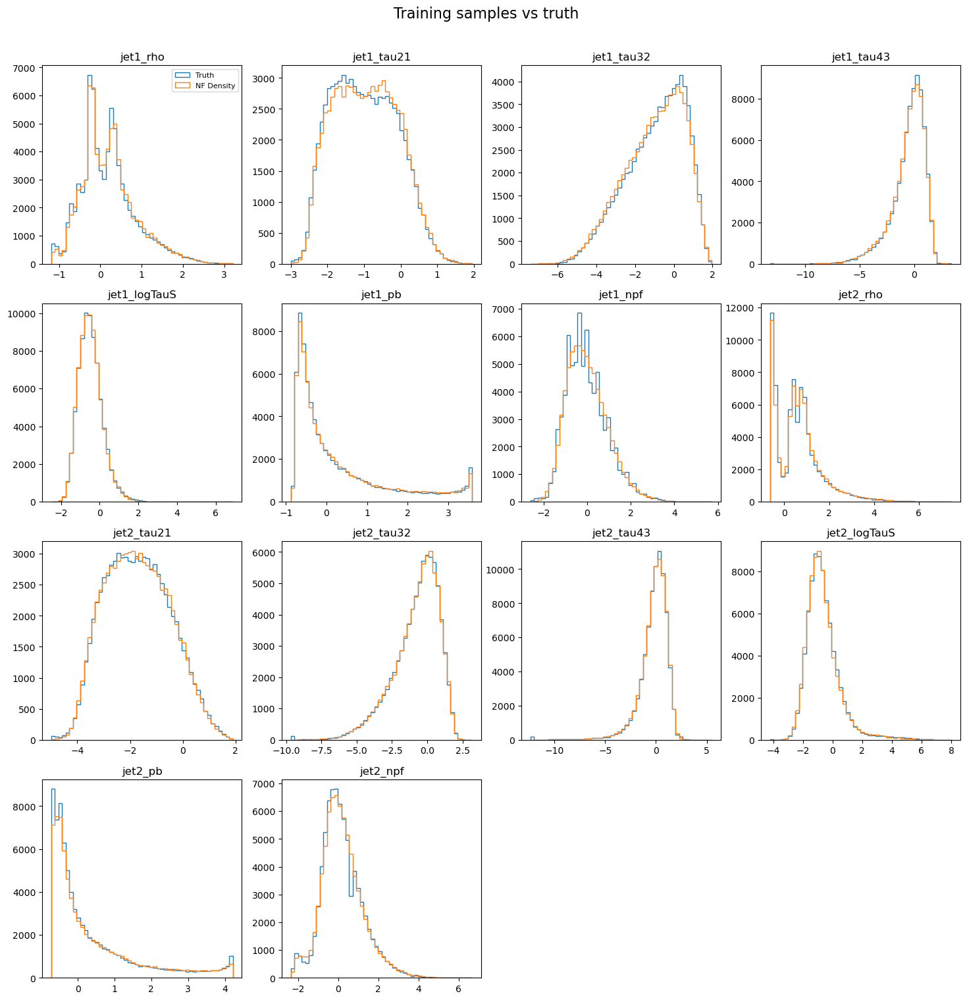

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 90.20it/s]


loading Wkk2000_R170, 6867 events


100%|██████████| 1/1 [00:00<00:00, 81.83it/s]


loading Wkk3000_R170, 8411 events


100%|██████████| 1/1 [00:00<00:00, 84.65it/s]


loading Wp2000_B80_T170, 8341 events


100%|██████████| 1/1 [00:00<00:00, 78.34it/s]


loading Wp3000_B80_T170, 9991 events


100%|██████████| 1/1 [00:00<00:00, 70.20it/s]


loading XYY2000_Y80_Yp170, 10981 events


100%|██████████| 1/1 [00:00<00:00, 77.62it/s]


loading XYY2000_Y170_Yp80, 10918 events


100%|██████████| 1/1 [00:00<00:00, 76.51it/s]


loading XYY3000_Y170_Yp80, 11110 events


100%|██████████| 1/1 [00:00<00:00, 76.67it/s]

loading XYY3000_Y80_Yp170, 11123 events


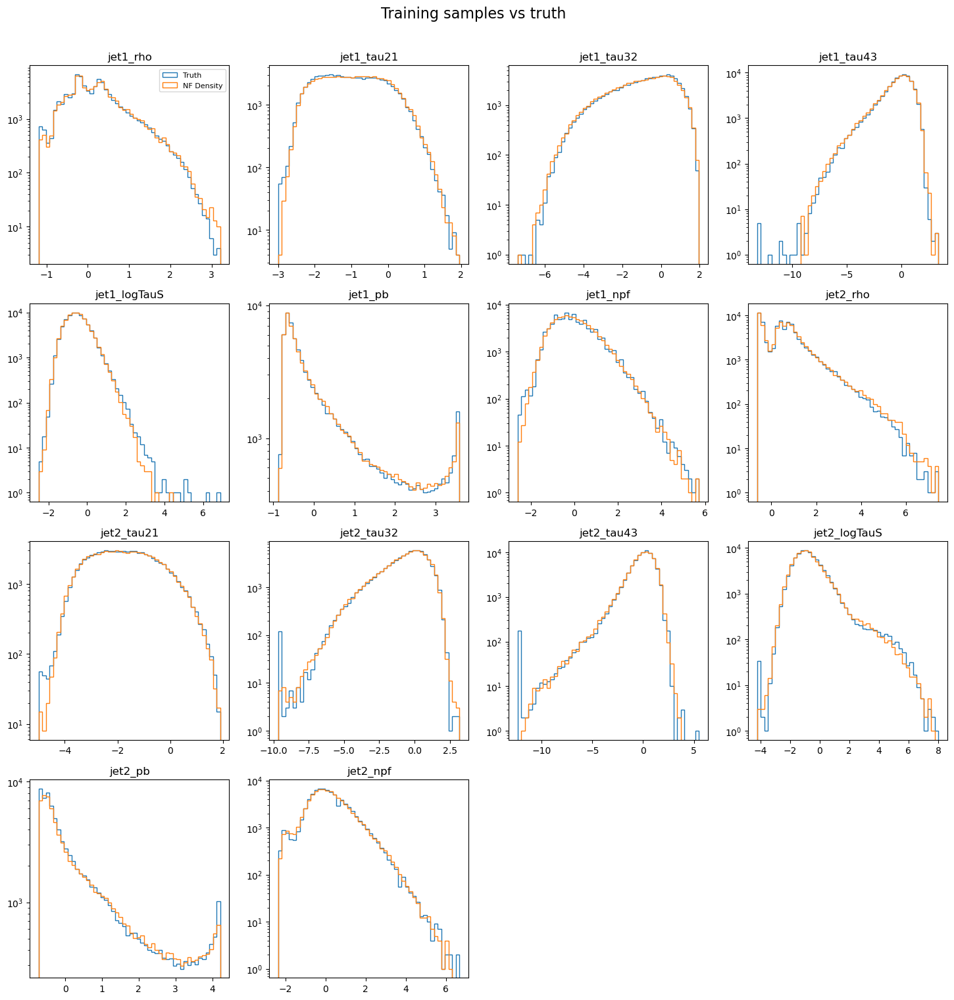

In [21]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M80-170"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.32it/s]


loading Wkk2000_R400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  3.00it/s]


loading Wkk3000_R400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  3.40it/s]


loading XYY2000_Y400_Yp80, 16666 events


100%|██████████| 1/1 [00:00<00:00,  3.17it/s]


loading XYY2000_Y80_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.54it/s]


loading XYY3000_Y80_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


loading XYY3000_Y400_Yp80, 16666 events
99996 training events
Training flow M80-400
Iteration 10 Complete
Loss:  14.235494613647461
Iteration 20 Complete
Loss:  13.207193374633789
Iteration 30 Complete
Loss:  12.804975509643555
Iteration 40 Complete
Loss:  12.51484203338623
Iteration 50 Complete
Loss:  12.388720512390137
Iteration 60 Complete
Loss:  12.415759086608887
Iteration 70 Complete
Loss:  12.709769248962402
Loading test sample


100%|██████████| 1/1 [00:00<00:00,  4.14it/s]


loading Wkk2000_R400, 6106 events


100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


loading Wkk3000_R400, 8056 events


100%|██████████| 1/1 [00:00<00:00,  3.38it/s]


loading XYY2000_Y400_Yp80, 10571 events


100%|██████████| 1/1 [00:00<00:00,  3.58it/s]


loading XYY2000_Y80_Yp400, 8345 events


100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


loading XYY3000_Y80_Yp400, 11122 events


100%|██████████| 1/1 [00:00<00:00,  2.64it/s]


loading XYY3000_Y400_Yp80, 11036 events


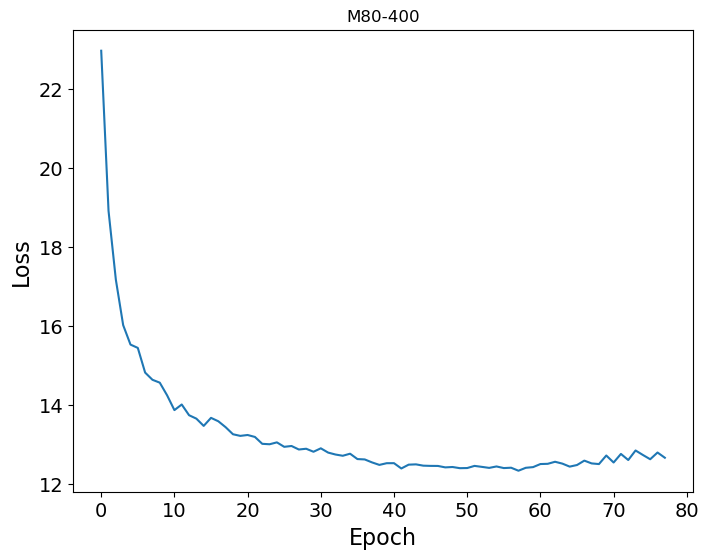

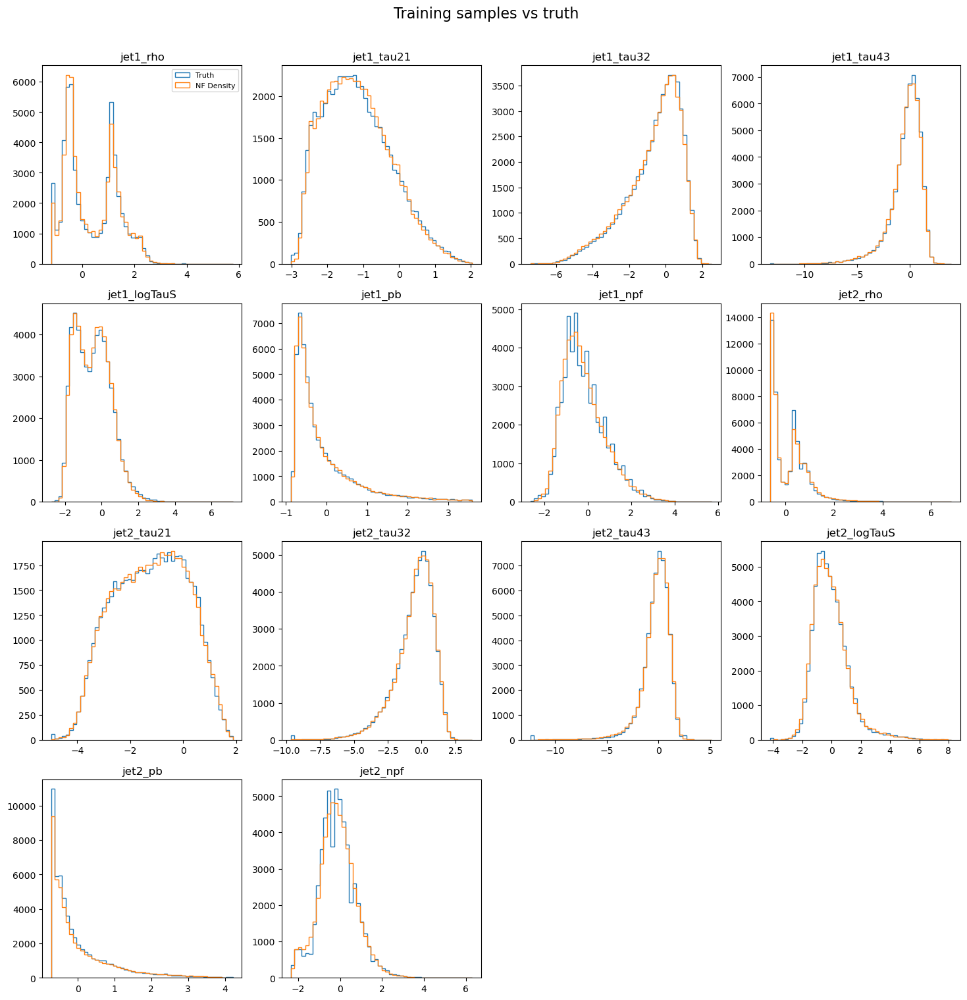

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 73.38it/s]


loading Wkk2000_R400, 6106 events


100%|██████████| 1/1 [00:00<00:00,  7.84it/s]


loading Wkk3000_R400, 8056 events


100%|██████████| 1/1 [00:00<00:00, 60.49it/s]


loading XYY2000_Y400_Yp80, 10571 events


100%|██████████| 1/1 [00:00<00:00, 67.27it/s]


loading XYY2000_Y80_Yp400, 8345 events


100%|██████████| 1/1 [00:00<00:00, 60.78it/s]


loading XYY3000_Y80_Yp400, 11122 events


100%|██████████| 1/1 [00:00<00:00, 61.69it/s]


loading XYY3000_Y400_Yp80, 11036 events


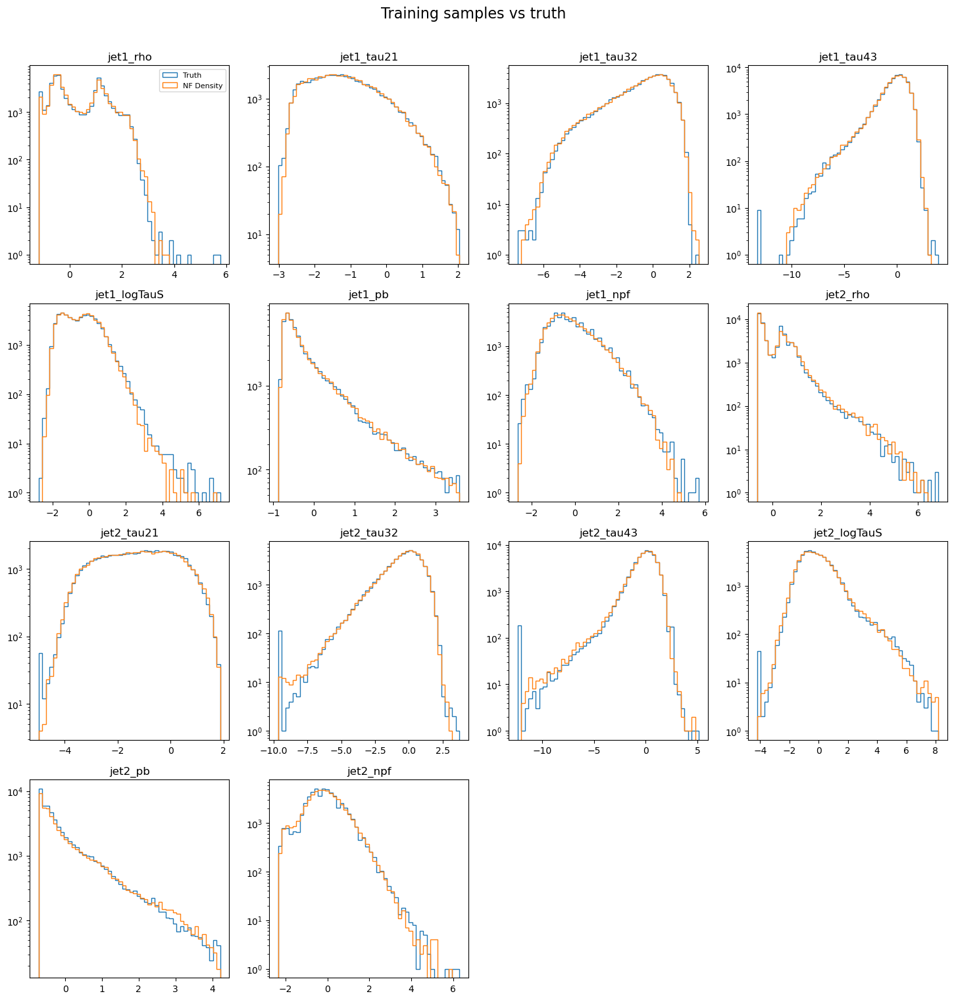

In [5]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M80-400"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.98it/s]


loading Wp2000_B170_T170, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.01it/s]


loading Wp3000_B170_T170, 25000 events


100%|██████████| 1/1 [00:00<00:00,  2.71it/s]


loading XYY3000_Y170_Yp170, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.56it/s]


loading XYY2000_Y170_Yp170, 25000 events
100000 training events
Training flow M170-170
Iteration 10 Complete
Loss:  15.232965469360352
Iteration 20 Complete
Loss:  14.607430458068848
Iteration 30 Complete
Loss:  14.291752815246582
Iteration 40 Complete
Loss:  14.180957794189453
Iteration 50 Complete
Loss:  14.158345222473145
Iteration 60 Complete
Loss:  14.154806137084961
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 18.34it/s]


loading Wp2000_B170_T170, 8754 events


100%|██████████| 1/1 [00:00<00:00,  5.32it/s]


loading Wp3000_B170_T170, 9820 events


100%|██████████| 1/1 [00:00<00:00, 13.13it/s]


loading XYY3000_Y170_Yp170, 11102 events


100%|██████████| 1/1 [00:00<00:00, 10.44it/s]


loading XYY2000_Y170_Yp170, 10892 events


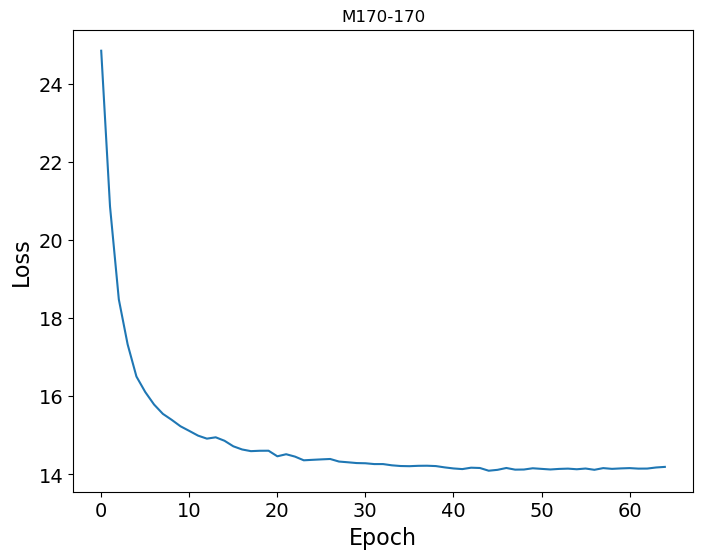

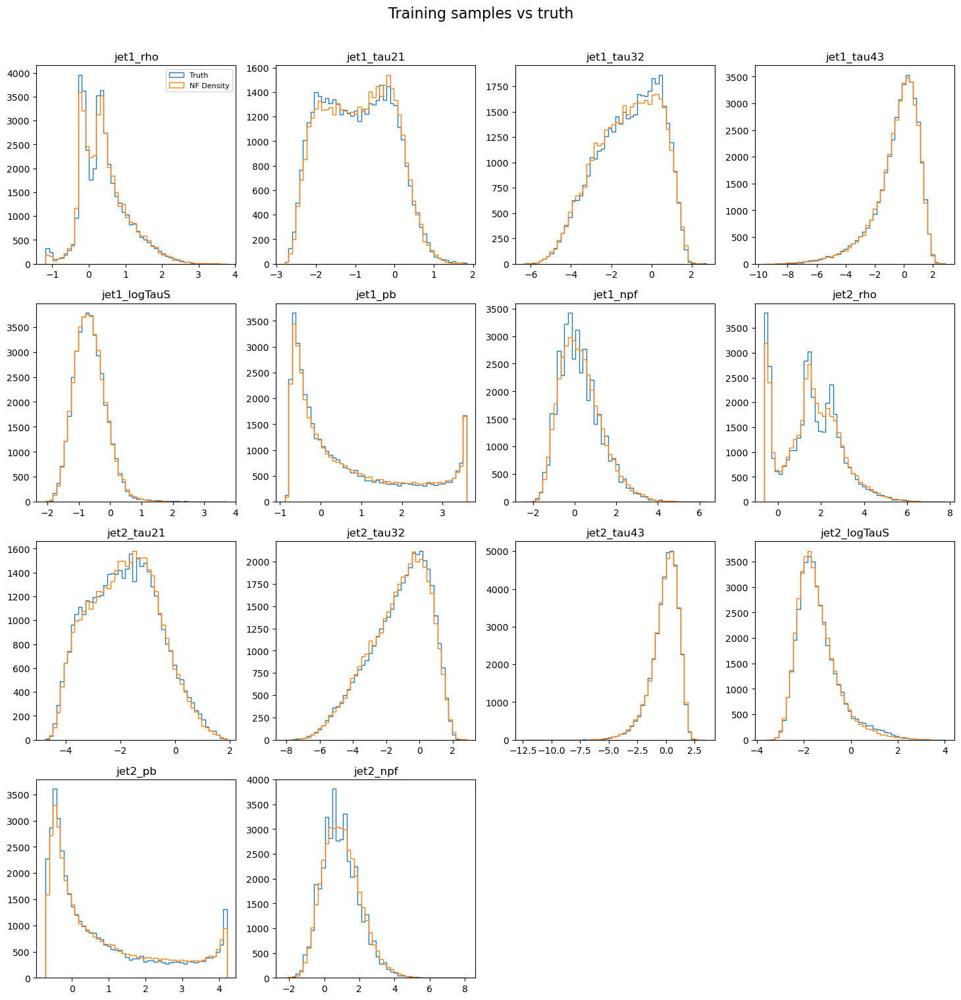

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 72.35it/s]


loading Wp2000_B170_T170, 8754 events


100%|██████████| 1/1 [00:00<00:00, 81.68it/s]


loading Wp3000_B170_T170, 9820 events


100%|██████████| 1/1 [00:00<00:00, 69.92it/s]


loading XYY3000_Y170_Yp170, 11102 events


100%|██████████| 1/1 [00:00<00:00, 69.38it/s]

loading XYY2000_Y170_Yp170, 10892 events


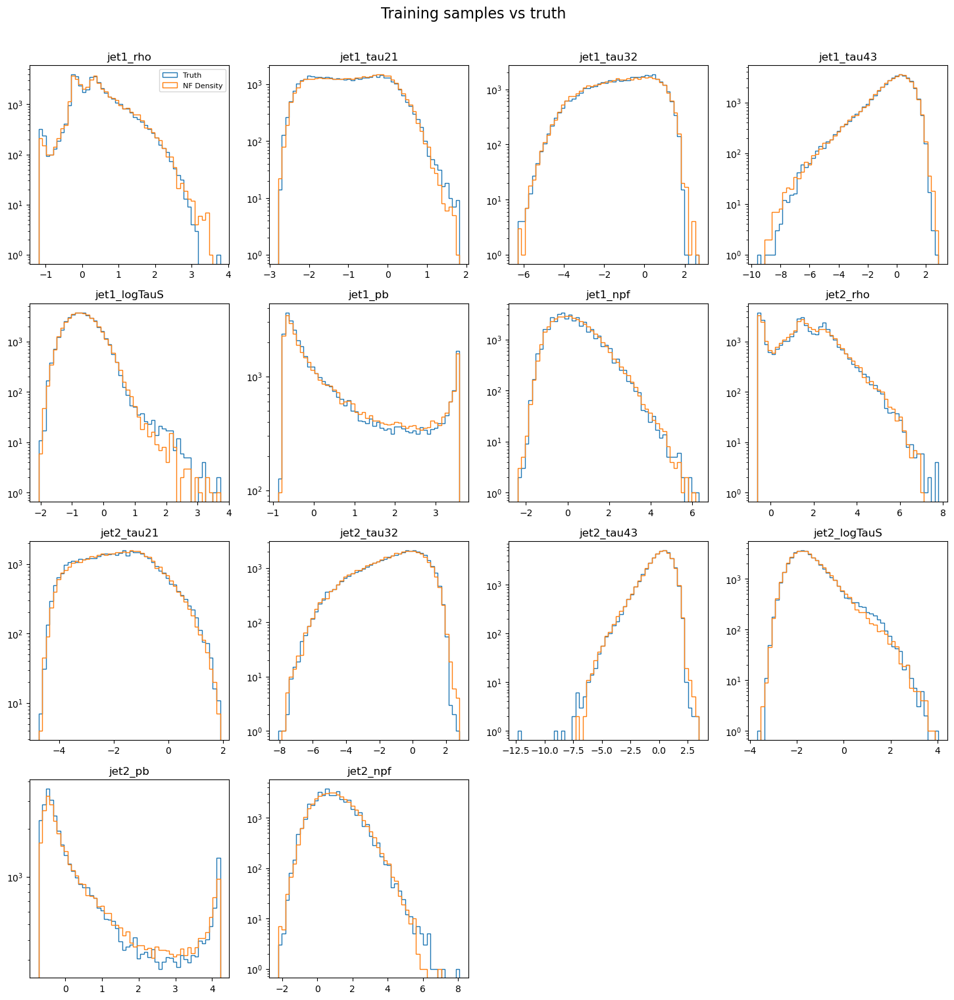

In [6]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M170-170"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  3.21it/s]


loading Wp2000_B400_T170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.62it/s]


loading Wp3000_B400_T170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


loading XYY2000_Y170_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.79it/s]


loading XYY2000_Y400_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.91it/s]


loading XYY3000_Y400_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  3.12it/s]


loading XYY3000_Y170_Yp400, 16666 events
99996 training events
Training flow M170-400
Iteration 10 Complete
Loss:  15.025235176086426
Iteration 20 Complete
Loss:  14.360024452209473
Iteration 30 Complete
Loss:  13.893657684326172
Iteration 40 Complete
Loss:  13.75765609741211
Iteration 50 Complete
Loss:  13.739402770996094
Iteration 60 Complete
Loss:  13.733898162841797
Iteration 70 Complete
Loss:  13.794690132141113
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 16.57it/s]


loading Wp2000_B400_T170, 8184 events


100%|██████████| 1/1 [00:00<00:00, 10.60it/s]


loading Wp3000_B400_T170, 9764 events


100%|██████████| 1/1 [00:00<00:00,  5.49it/s]


loading XYY2000_Y170_Yp400, 10824 events


100%|██████████| 1/1 [00:00<00:00, 60.38it/s]


loading XYY2000_Y400_Yp170, 10538 events


100%|██████████| 1/1 [00:00<00:00, 57.12it/s]


loading XYY3000_Y400_Yp170, 11032 events


100%|██████████| 1/1 [00:00<00:00, 61.33it/s]


loading XYY3000_Y170_Yp400, 11117 events


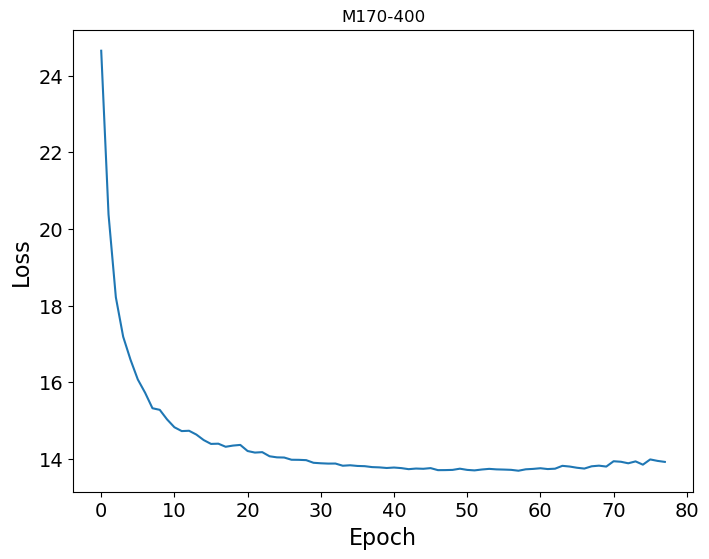

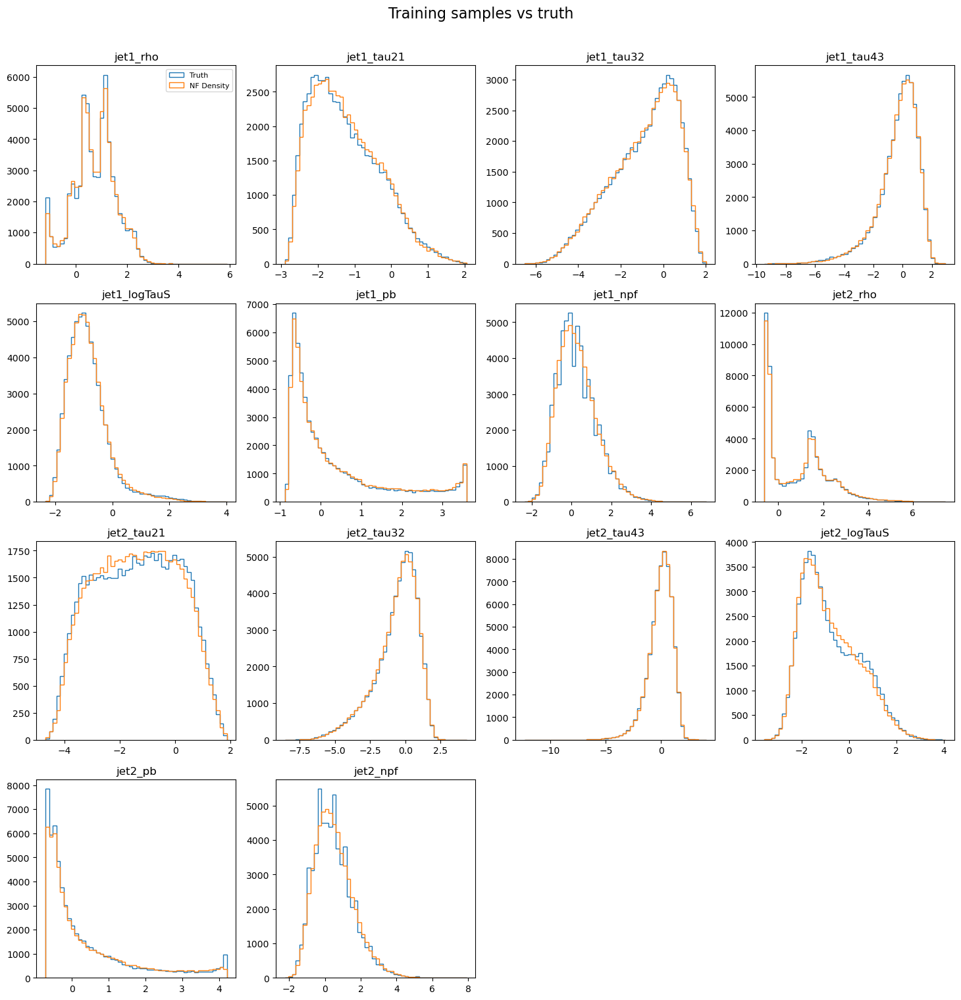

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 83.21it/s]


loading Wp2000_B400_T170, 8184 events


100%|██████████| 1/1 [00:00<00:00, 77.25it/s]


loading Wp3000_B400_T170, 9764 events


100%|██████████| 1/1 [00:00<00:00, 72.68it/s]


loading XYY2000_Y170_Yp400, 10824 events


100%|██████████| 1/1 [00:00<00:00, 73.04it/s]


loading XYY2000_Y400_Yp170, 10538 events


100%|██████████| 1/1 [00:00<00:00, 58.69it/s]


loading XYY3000_Y400_Yp170, 11032 events


100%|██████████| 1/1 [00:00<00:00, 74.66it/s]

loading XYY3000_Y170_Yp400, 11117 events


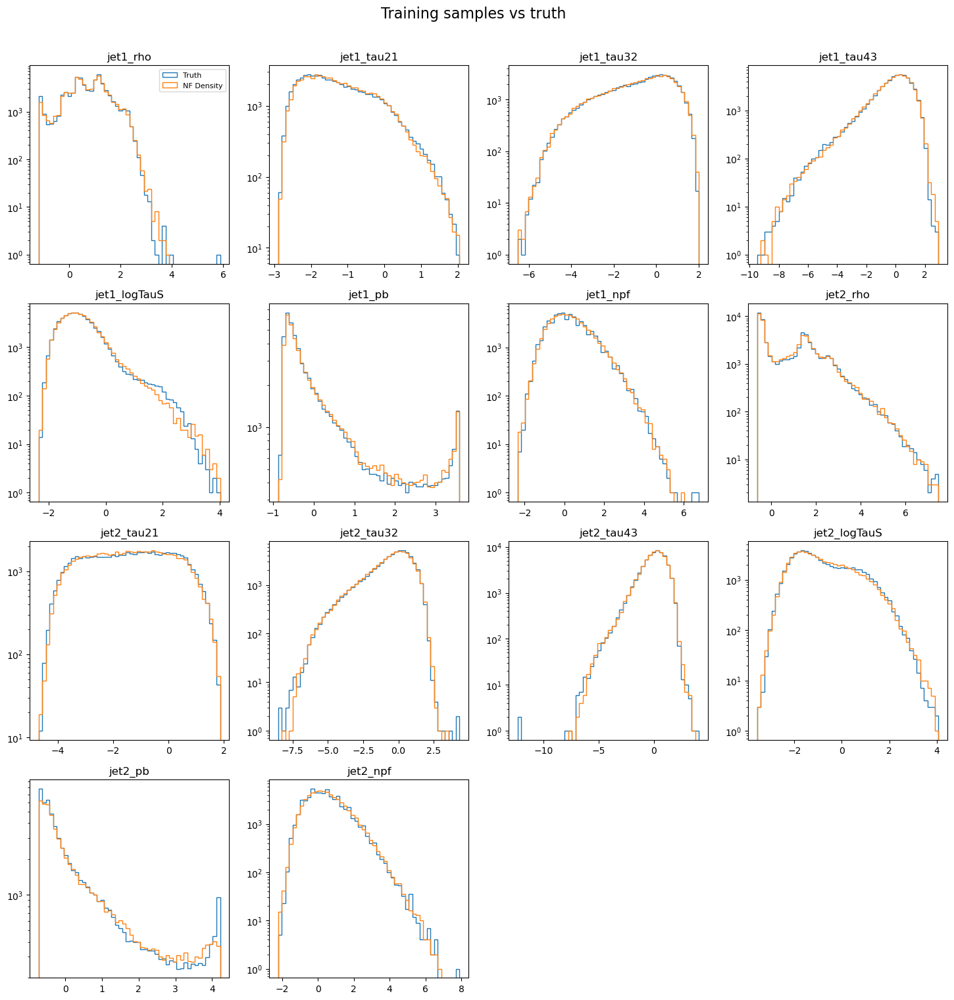

In [7]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M170-400"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.42it/s]


loading YHH2000_H400, 25000 events


100%|██████████| 1/1 [00:00<00:00,  2.12it/s]


loading YHH3000_H400, 25000 events


100%|██████████| 1/1 [00:00<00:00,  3.43it/s]


loading ZTT2000_Tp400, 25000 events


100%|██████████| 1/1 [00:00<00:00,  2.34it/s]


loading ZTT3000_Tp400, 25000 events
100000 training events
Training flow M400-400
Iteration 10 Complete
Loss:  17.32271385192871
Iteration 20 Complete
Loss:  16.753646850585938
Iteration 30 Complete
Loss:  16.52039909362793
Iteration 40 Complete
Loss:  16.45147132873535
Iteration 50 Complete
Loss:  16.394472122192383
Iteration 60 Complete
Loss:  16.398584365844727
Iteration 70 Complete
Loss:  16.529541015625
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 10.61it/s]


loading YHH2000_H400, 18959 events


100%|██████████| 1/1 [00:00<00:00, 48.32it/s]


loading YHH3000_H400, 19554 events


100%|██████████| 1/1 [00:00<00:00, 74.93it/s]


loading ZTT2000_Tp400, 9925 events


100%|██████████| 1/1 [00:00<00:00, 16.73it/s]


loading ZTT3000_Tp400, 16618 events


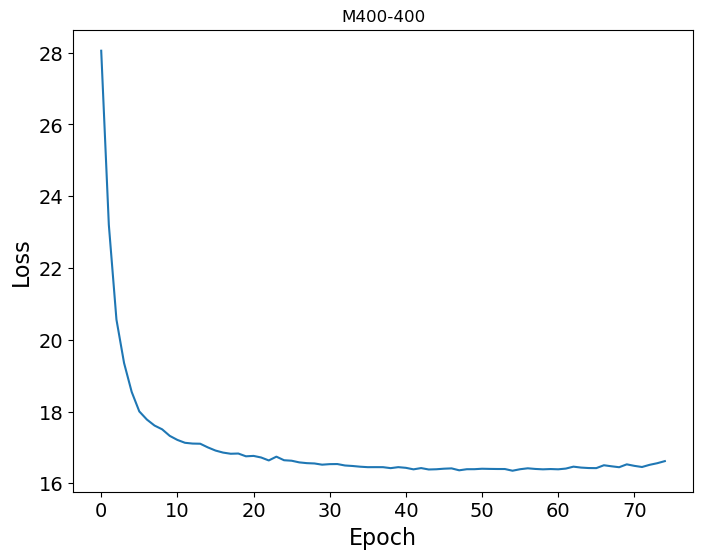

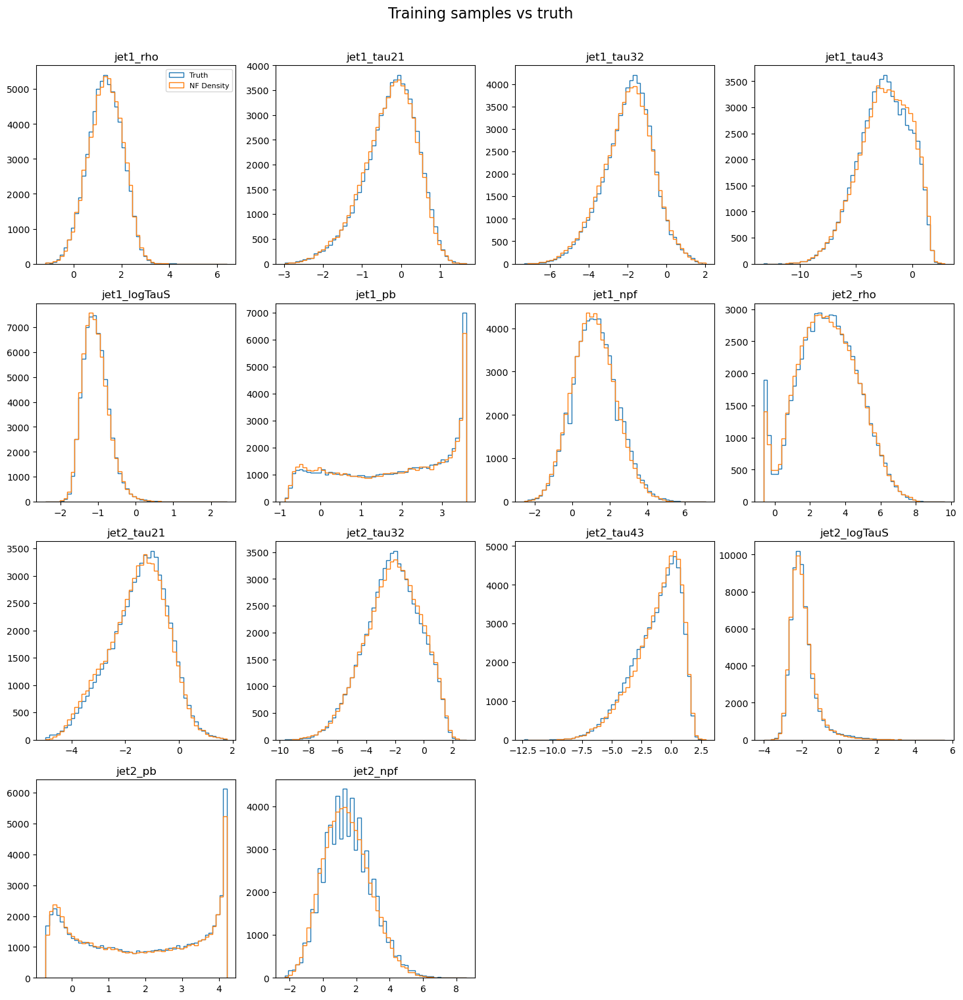

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 38.61it/s]


loading YHH2000_H400, 18959 events


100%|██████████| 1/1 [00:00<00:00, 41.42it/s]


loading YHH3000_H400, 19554 events


100%|██████████| 1/1 [00:00<00:00, 62.01it/s]


loading ZTT2000_Tp400, 9925 events


100%|██████████| 1/1 [00:00<00:00, 44.84it/s]

loading ZTT3000_Tp400, 16618 events


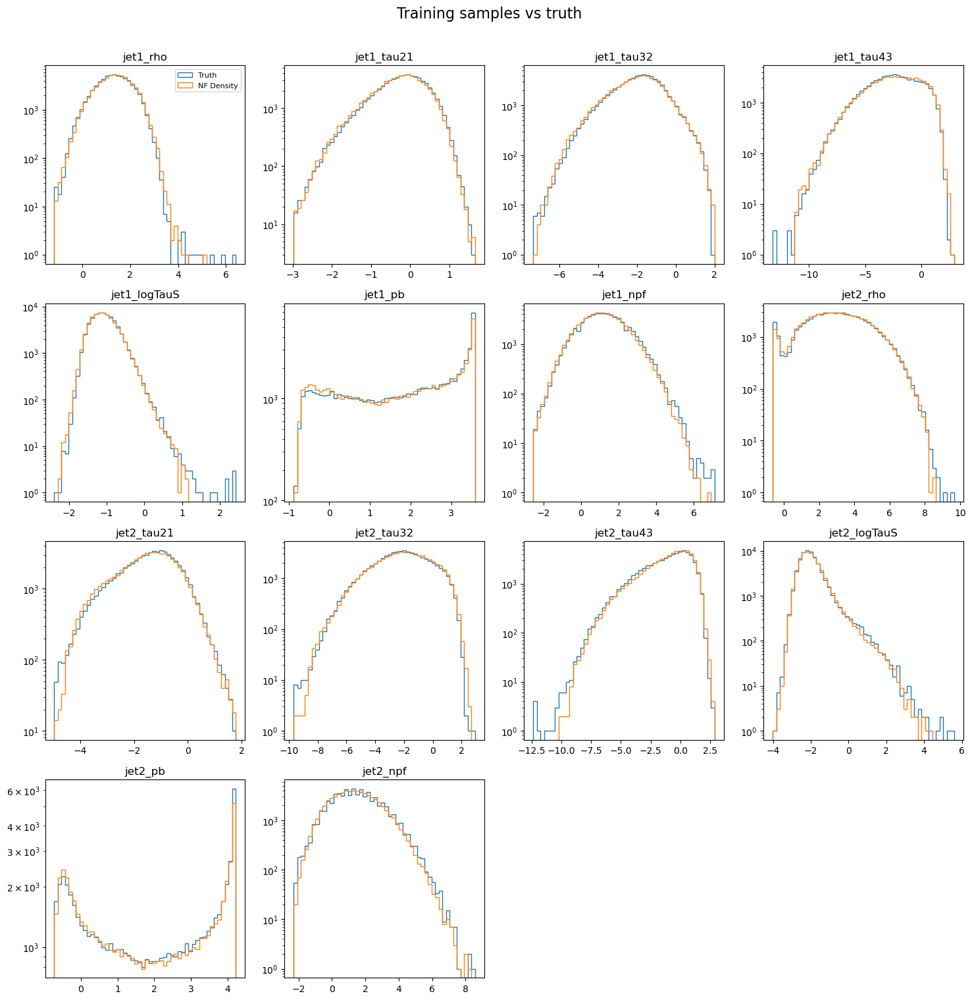

In [8]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "M400-400"
sample = daughterGroups_2and3TeV[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 100000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

# Topology-grouped trainings for heavy daughters (m = 170 or 400)

In [15]:
from samples import topologyGroups_heavyDaughters
print(topologyGroups_heavyDaughters.keys())

dict_keys(['top22_heavy', 'top33_heavy', 'top43_heavy', 'top55_heavy', 'top66_heavy'])


Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.56it/s]


loading XYY2000_Y170_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.09it/s]


loading XYY2000_Y400_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.57it/s]


loading XYY2000_Y400_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.99it/s]


loading XYY2000_Y170_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00, 10.89it/s]


loading XYY3000_Y170_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.51it/s]


loading XYY3000_Y400_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.26it/s]


loading XYY3000_Y400_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.58it/s]


loading XYY3000_Y170_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.27it/s]


loading XYY5000_Y170_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  2.28it/s]


loading XYY5000_Y400_Yp170, 16666 events


100%|██████████| 1/1 [00:00<00:00,  1.98it/s]


loading XYY5000_Y400_Yp400, 16666 events


100%|██████████| 1/1 [00:00<00:00,  3.39it/s]


loading XYY5000_Y170_Yp400, 16666 events
199992 training events
Training flow top22_heavy_mjjCond
Iteration 10 Complete
Loss:  14.942852973937988
Iteration 20 Complete
Loss:  12.74377727508545
Iteration 30 Complete
Loss:  11.727751731872559
Iteration 40 Complete
Loss:  11.336620330810547
Iteration 50 Complete
Loss:  11.248733520507812
Iteration 60 Complete
Loss:  11.257421493530273
Iteration 70 Complete
Loss:  11.483152389526367
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 11.46it/s]


loading XYY2000_Y170_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00,  5.66it/s]


loading XYY2000_Y400_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 68.53it/s]


loading XYY2000_Y400_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 10.64it/s]


loading XYY2000_Y170_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 61.48it/s]


loading XYY3000_Y170_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 57.97it/s]


loading XYY3000_Y400_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00,  6.45it/s]


loading XYY3000_Y400_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 45.62it/s]


loading XYY3000_Y170_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 60.07it/s]


loading XYY5000_Y170_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 54.03it/s]


loading XYY5000_Y400_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 58.39it/s]


loading XYY5000_Y400_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 61.23it/s]


loading XYY5000_Y170_Yp400, 8333 events


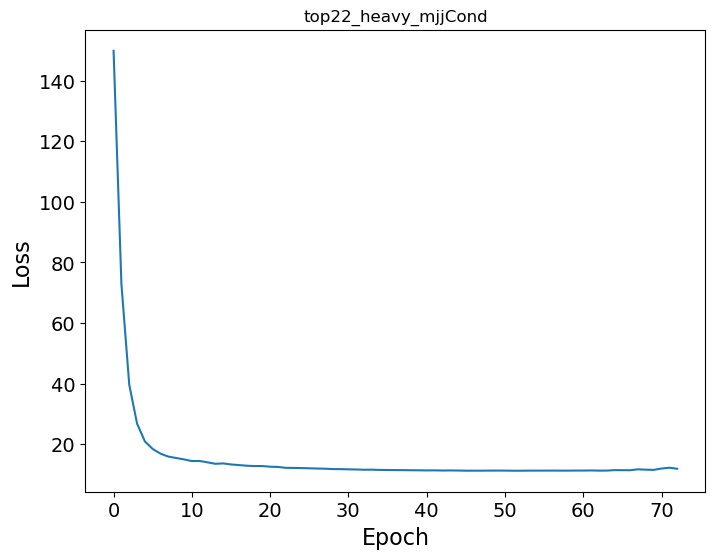

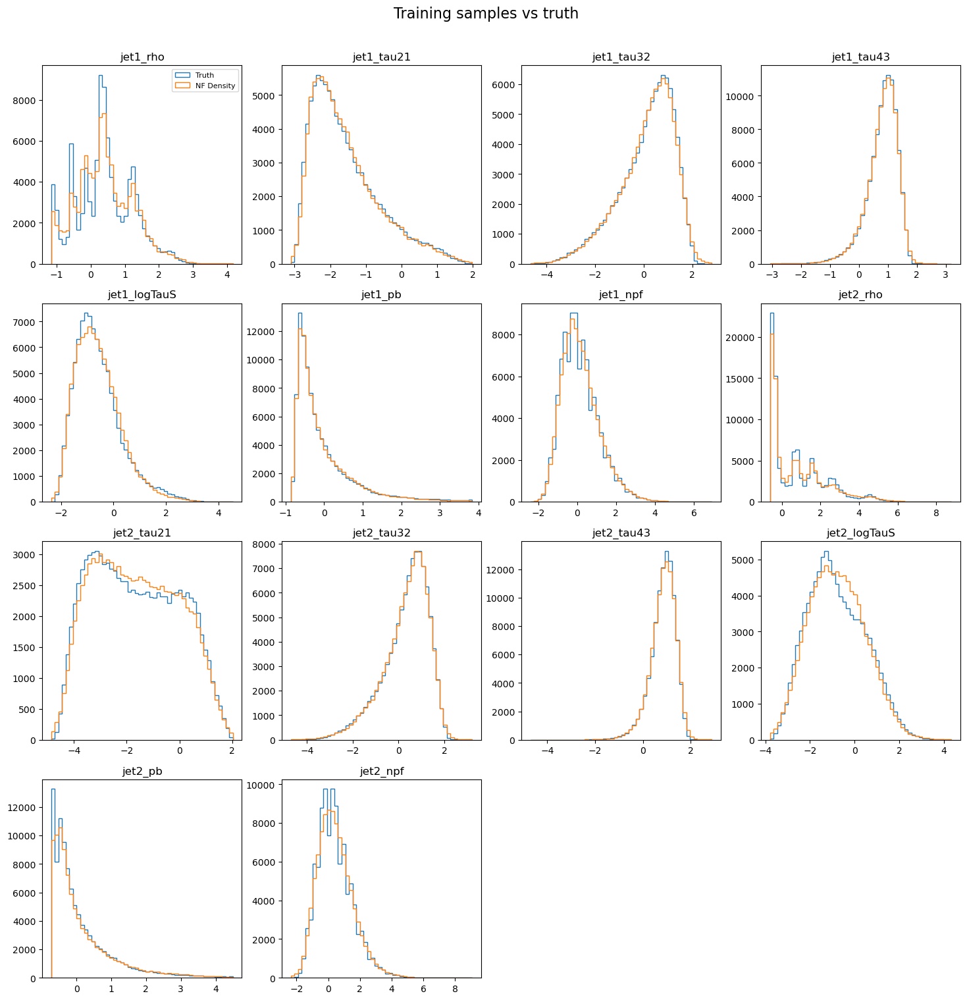

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 54.98it/s]


loading XYY2000_Y170_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 55.92it/s]


loading XYY2000_Y400_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 69.77it/s]


loading XYY2000_Y400_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 60.87it/s]


loading XYY2000_Y170_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 55.47it/s]


loading XYY3000_Y170_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 58.44it/s]


loading XYY3000_Y400_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 55.66it/s]


loading XYY3000_Y400_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 55.16it/s]


loading XYY3000_Y170_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 58.77it/s]


loading XYY5000_Y170_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 58.64it/s]


loading XYY5000_Y400_Yp170, 8333 events


100%|██████████| 1/1 [00:00<00:00, 56.20it/s]


loading XYY5000_Y400_Yp400, 8333 events


100%|██████████| 1/1 [00:00<00:00, 63.84it/s]


loading XYY5000_Y170_Yp400, 8333 events


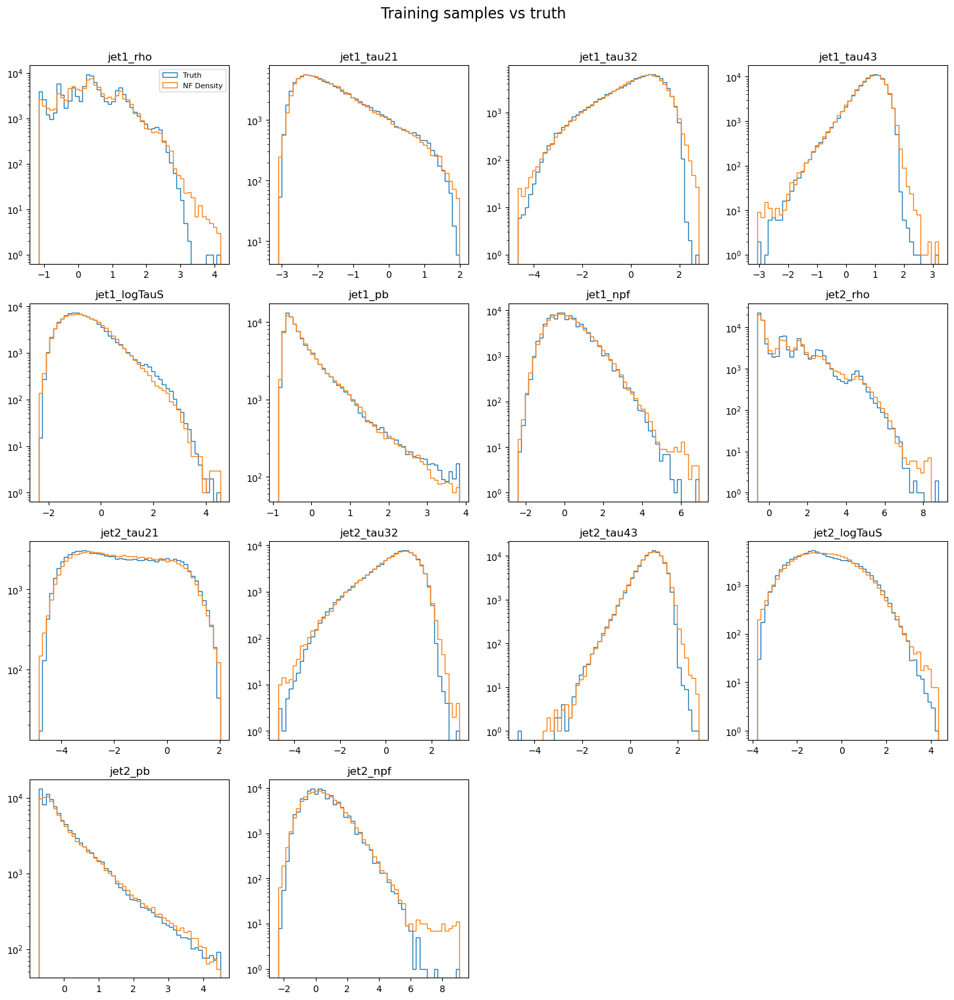

In [16]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "top22_heavy"
sample = topologyGroups_heavyDaughters[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 200000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.17it/s]


loading Wp2000_B170_T170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


loading Wp2000_B400_T170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.10it/s]


loading Wp3000_B170_T170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  3.44it/s]


loading Wp3000_B400_T170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  1.93it/s]


loading Wp5000_B170_T170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.97it/s]


loading Wp5000_B400_T170, 33333 events
199998 training events
Training flow top33_heavy_mjjCond
Iteration 10 Complete
Loss:  16.036333084106445
Iteration 20 Complete
Loss:  14.672499656677246
Iteration 30 Complete
Loss:  14.21073055267334
Iteration 40 Complete
Loss:  14.000575065612793
Iteration 50 Complete
Loss:  13.988163948059082
Iteration 60 Complete
Loss:  13.976252555847168
Iteration 70 Complete
Loss:  14.291326522827148
Iteration 80 Complete
Loss:  14.347759246826172
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 60.67it/s]


loading Wp2000_B170_T170, 8754 events


100%|██████████| 1/1 [00:00<00:00, 66.55it/s]


loading Wp2000_B400_T170, 8184 events


100%|██████████| 1/1 [00:00<00:00, 61.35it/s]


loading Wp3000_B170_T170, 9820 events


100%|██████████| 1/1 [00:00<00:00, 62.54it/s]


loading Wp3000_B400_T170, 9764 events


100%|██████████| 1/1 [00:00<00:00, 65.01it/s]


loading Wp5000_B170_T170, 8686 events


100%|██████████| 1/1 [00:00<00:00, 63.71it/s]

loading Wp5000_B400_T170, 9035 events


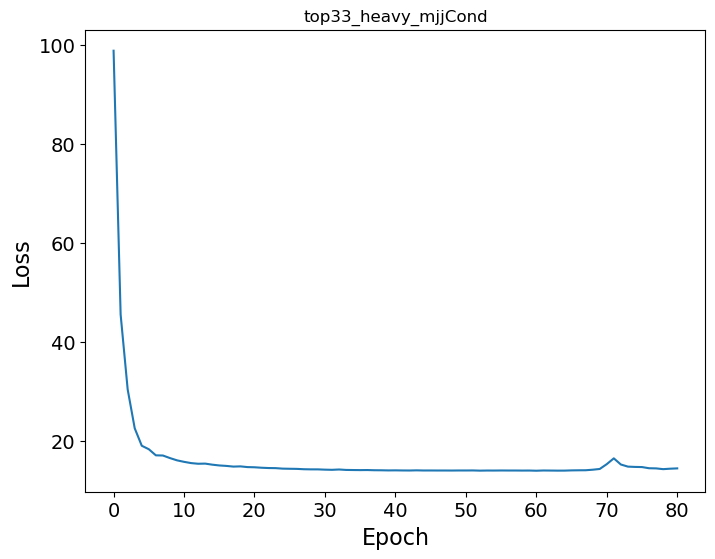

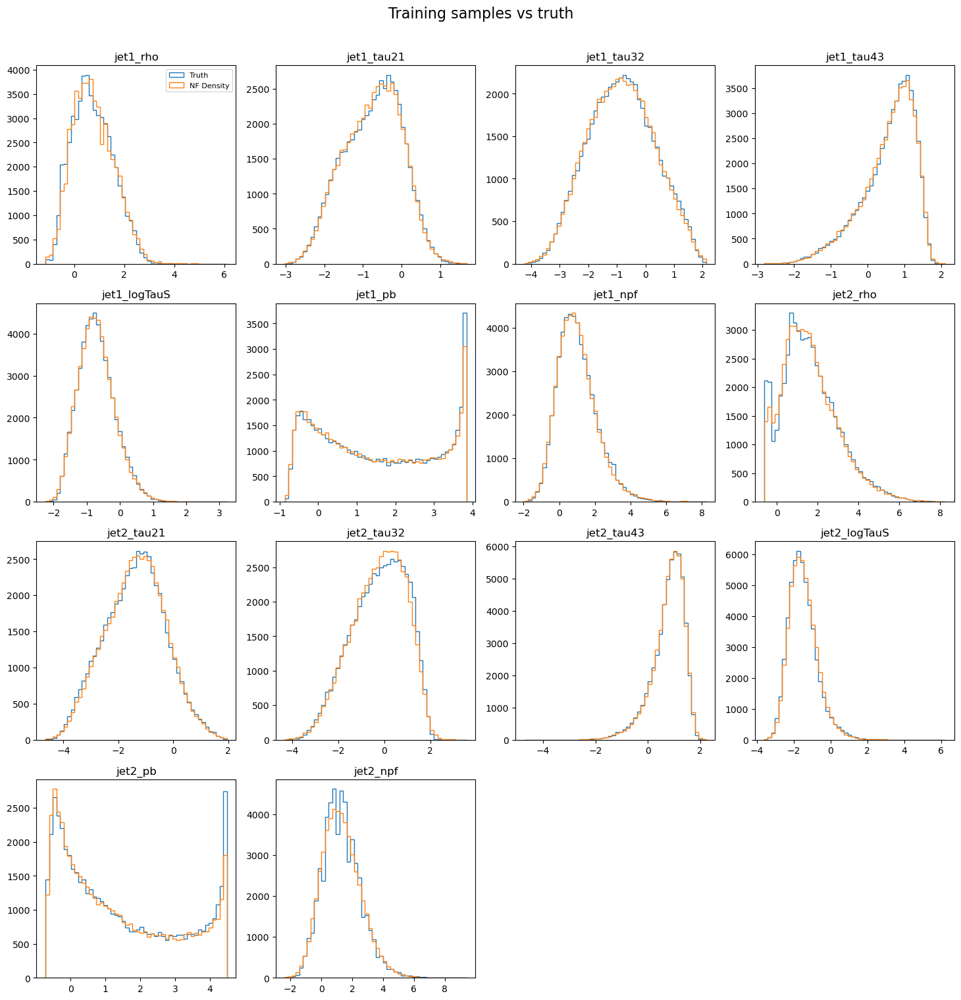

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 56.30it/s]


loading Wp2000_B170_T170, 8754 events


100%|██████████| 1/1 [00:00<00:00, 62.81it/s]


loading Wp2000_B400_T170, 8184 events


100%|██████████| 1/1 [00:00<00:00, 57.26it/s]


loading Wp3000_B170_T170, 9820 events


100%|██████████| 1/1 [00:00<00:00, 55.57it/s]


loading Wp3000_B400_T170, 9764 events


100%|██████████| 1/1 [00:00<00:00, 60.37it/s]


loading Wp5000_B170_T170, 8686 events


100%|██████████| 1/1 [00:00<00:00, 59.49it/s]

loading Wp5000_B400_T170, 9035 events


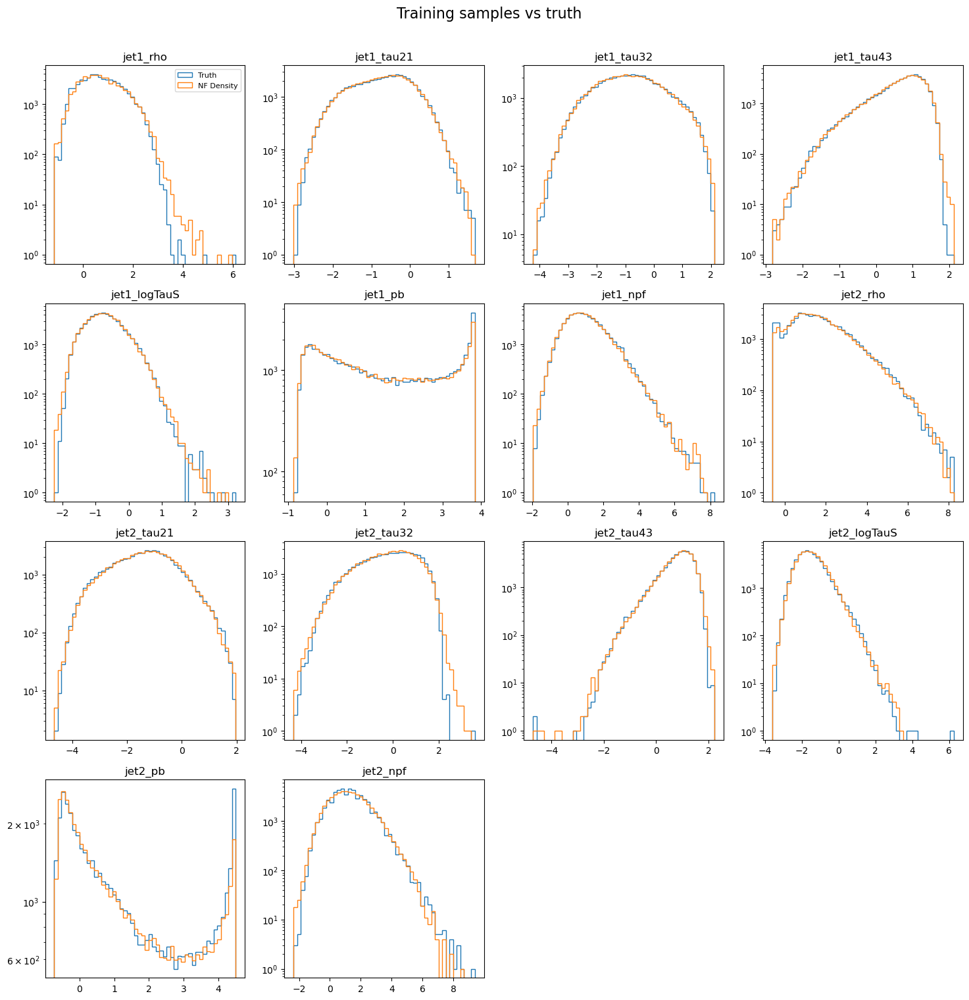

In [17]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "top33_heavy"
sample = topologyGroups_heavyDaughters[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 200000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.69it/s]


loading Wkk2000_R170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  3.57it/s]


loading Wkk2000_R400, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.30it/s]


loading Wkk3000_R170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.44it/s]


loading Wkk3000_R400, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.03it/s]


loading Wkk5000_R170, 33333 events


100%|██████████| 1/1 [00:00<00:00,  2.63it/s]


loading Wkk5000_R400, 33333 events
199998 training events
Training flow top43_heavy_mjjCond
Iteration 10 Complete
Loss:  15.799274444580078
Iteration 20 Complete
Loss:  13.636731147766113
Iteration 30 Complete
Loss:  12.75048828125
Iteration 40 Complete
Loss:  12.140571594238281
Iteration 50 Complete
Loss:  11.996272087097168
Iteration 60 Complete
Loss:  12.00284481048584
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 10.59it/s]


loading Wkk2000_R170, 6867 events


100%|██████████| 1/1 [00:00<00:00, 65.08it/s]


loading Wkk2000_R400, 6106 events


100%|██████████| 1/1 [00:00<00:00, 12.85it/s]


loading Wkk3000_R170, 8411 events


100%|██████████| 1/1 [00:00<00:00, 70.70it/s]


loading Wkk3000_R400, 8056 events


100%|██████████| 1/1 [00:00<00:00, 62.46it/s]


loading Wkk5000_R170, 9232 events


100%|██████████| 1/1 [00:00<00:00, 15.47it/s]


loading Wkk5000_R400, 9096 events


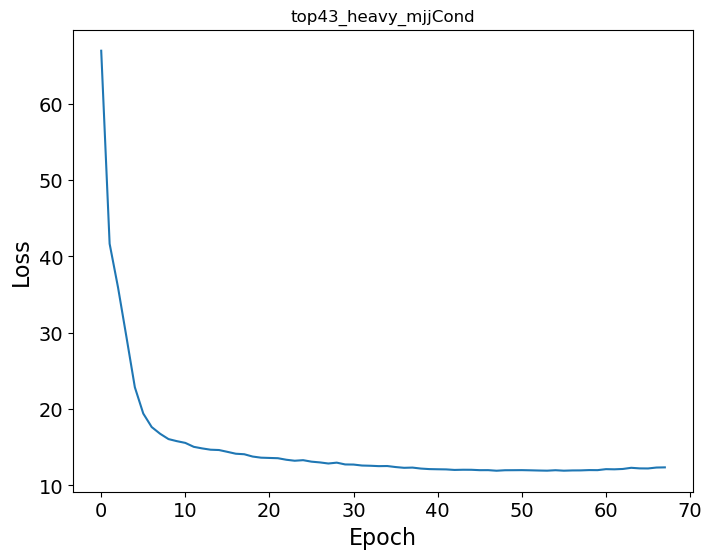

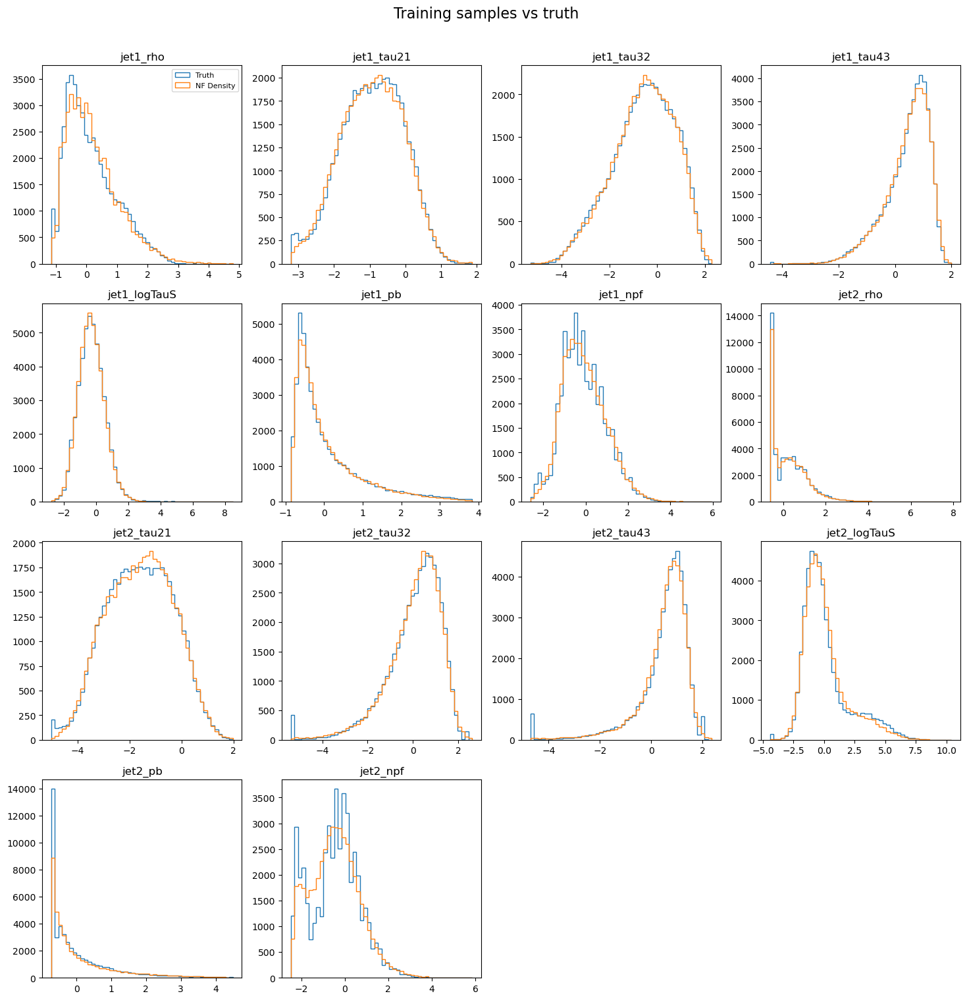

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 63.50it/s]


loading Wkk2000_R170, 6867 events


100%|██████████| 1/1 [00:00<00:00, 69.63it/s]


loading Wkk2000_R400, 6106 events


100%|██████████| 1/1 [00:00<00:00, 70.94it/s]


loading Wkk3000_R170, 8411 events


100%|██████████| 1/1 [00:00<00:00, 72.31it/s]


loading Wkk3000_R400, 8056 events


100%|██████████| 1/1 [00:00<00:00, 69.61it/s]


loading Wkk5000_R170, 9232 events


100%|██████████| 1/1 [00:00<00:00, 68.69it/s]

loading Wkk5000_R400, 9096 events


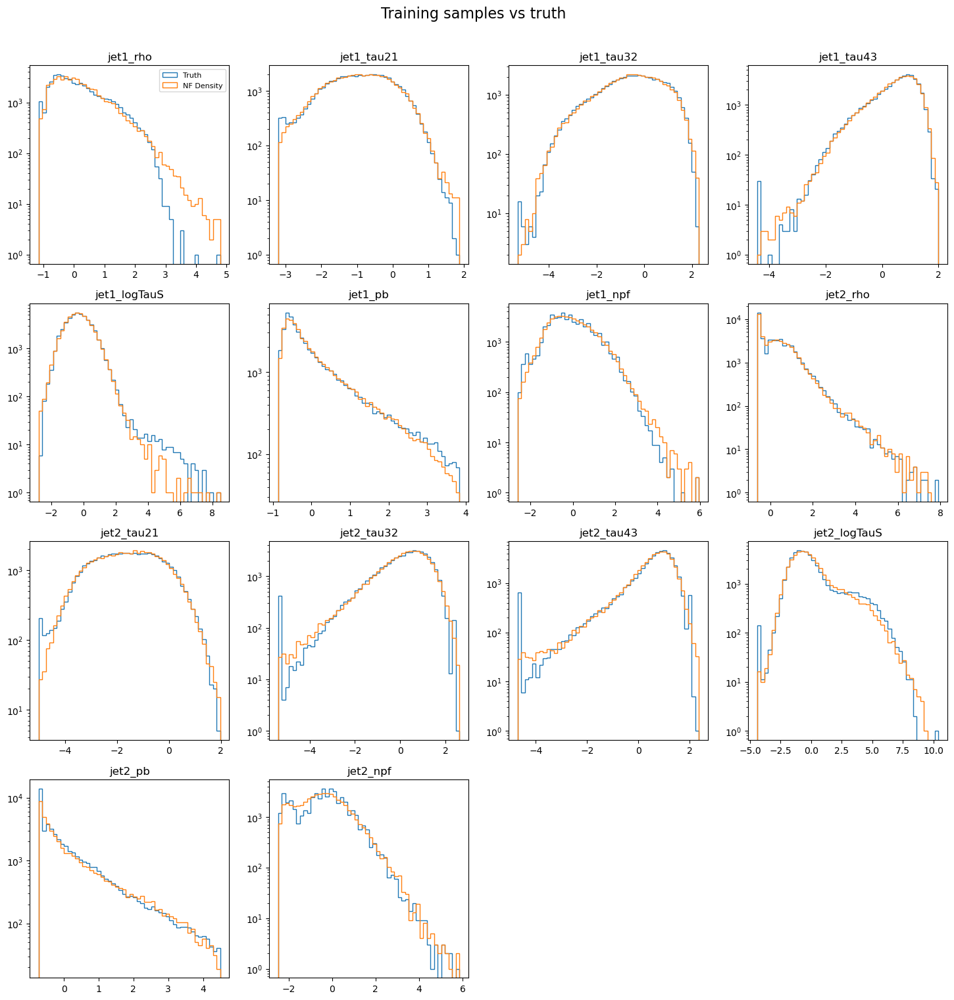

In [18]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "top43_heavy"
sample = topologyGroups_heavyDaughters[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 200000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  2.89it/s]


loading ZTT2000_Tp400, 66666 events


100%|██████████| 1/1 [00:00<00:00,  1.68it/s]


loading ZTT3000_Tp400, 66666 events


100%|██████████| 1/1 [00:00<00:00,  1.70it/s]


loading ZTT5000_Tp400, 66666 events
199998 training events
Training flow top55_heavy_mjjCond
Iteration 10 Complete
Loss:  16.08157730102539
Iteration 20 Complete
Loss:  15.10255241394043
Iteration 30 Complete
Loss:  14.75163745880127
Iteration 40 Complete
Loss:  14.614046096801758
Iteration 50 Complete
Loss:  14.55882740020752
Iteration 60 Complete
Loss:  14.546000480651855
Loading test sample


100%|██████████| 1/1 [00:00<00:00,  9.15it/s]


loading ZTT2000_Tp400, 9925 events


100%|██████████| 1/1 [00:00<00:00,  8.24it/s]


loading ZTT3000_Tp400, 16618 events


100%|██████████| 1/1 [00:00<00:00, 41.73it/s]


loading ZTT5000_Tp400, 16873 events


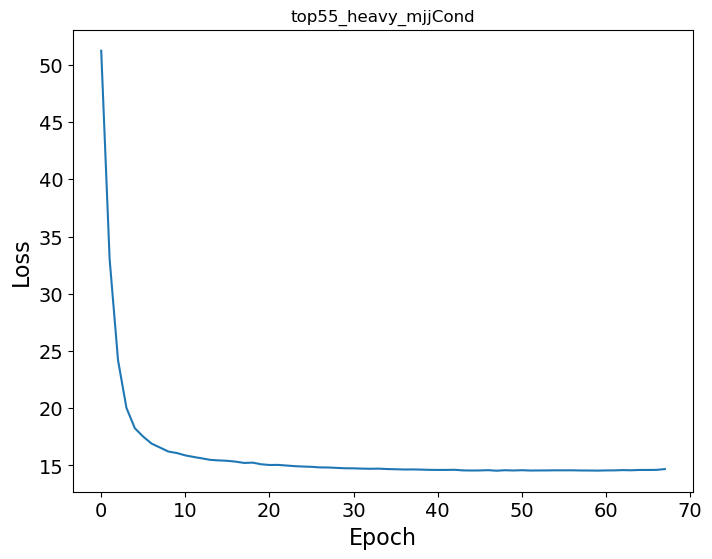

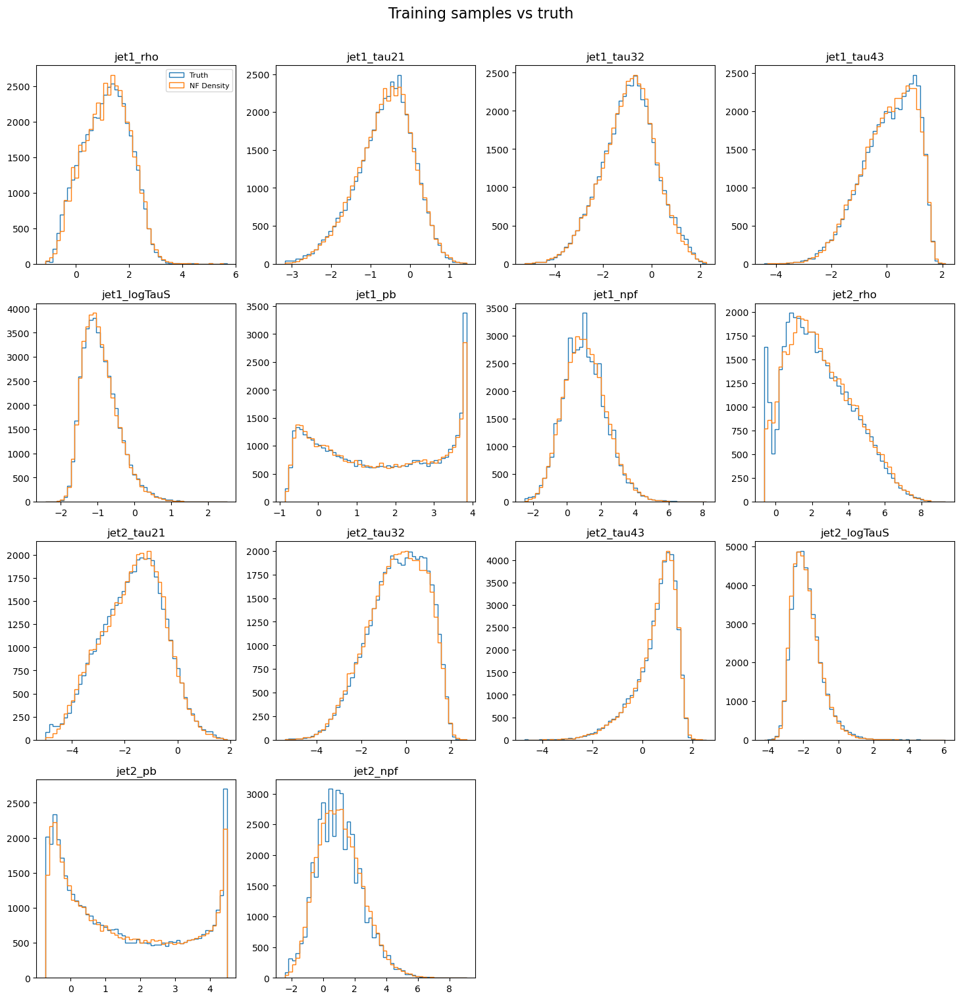

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 52.24it/s]


loading ZTT2000_Tp400, 9925 events


100%|██████████| 1/1 [00:00<00:00, 39.96it/s]


loading ZTT3000_Tp400, 16618 events


100%|██████████| 1/1 [00:00<00:00, 42.28it/s]

loading ZTT5000_Tp400, 16873 events


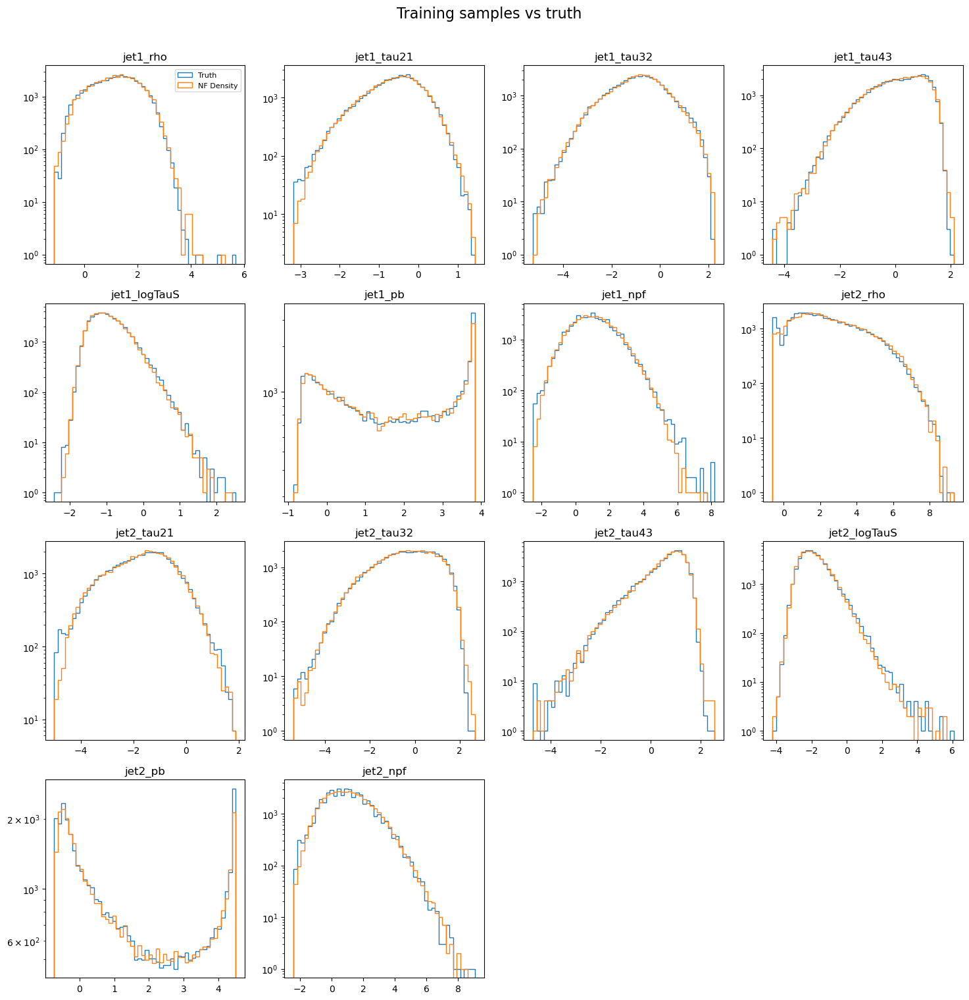

In [19]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "top55_heavy"
sample = topologyGroups_heavyDaughters[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 200000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)

Loading train sample


100%|██████████| 1/1 [00:00<00:00,  1.75it/s]


loading YHH2000_H400, 66666 events


100%|██████████| 1/1 [00:00<00:00,  1.77it/s]


loading YHH3000_H400, 66666 events


100%|██████████| 1/1 [00:00<00:00,  1.99it/s]


loading YHH5000_H400, 66666 events
199998 training events
Training flow top66_heavy_mjjCond
Iteration 10 Complete
Loss:  16.100311279296875
Iteration 20 Complete
Loss:  14.52713394165039
Iteration 30 Complete
Loss:  14.05495548248291
Iteration 40 Complete
Loss:  13.873846054077148
Iteration 50 Complete
Loss:  13.817577362060547
Iteration 60 Complete
Loss:  13.82148265838623
Iteration 70 Complete
Loss:  14.10279369354248
Loading test sample


100%|██████████| 1/1 [00:00<00:00, 38.22it/s]


loading YHH2000_H400, 18959 events


100%|██████████| 1/1 [00:00<00:00,  7.42it/s]


loading YHH3000_H400, 19554 events


100%|██████████| 1/1 [00:00<00:00, 33.80it/s]

loading YHH5000_H400, 20761 events


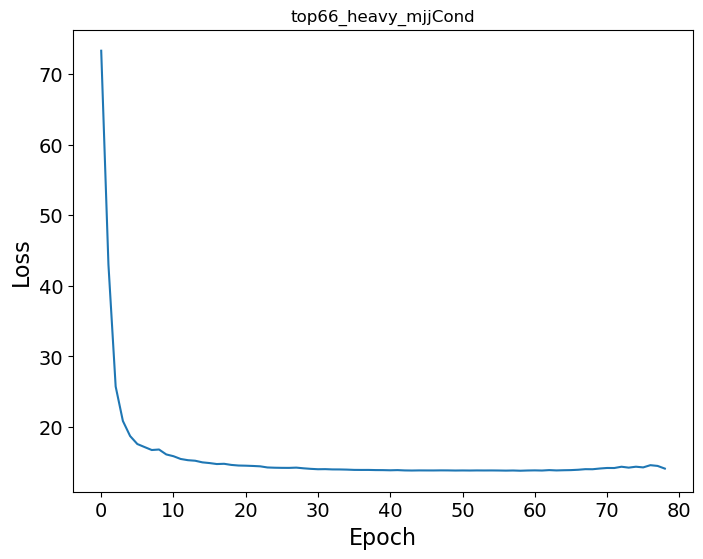

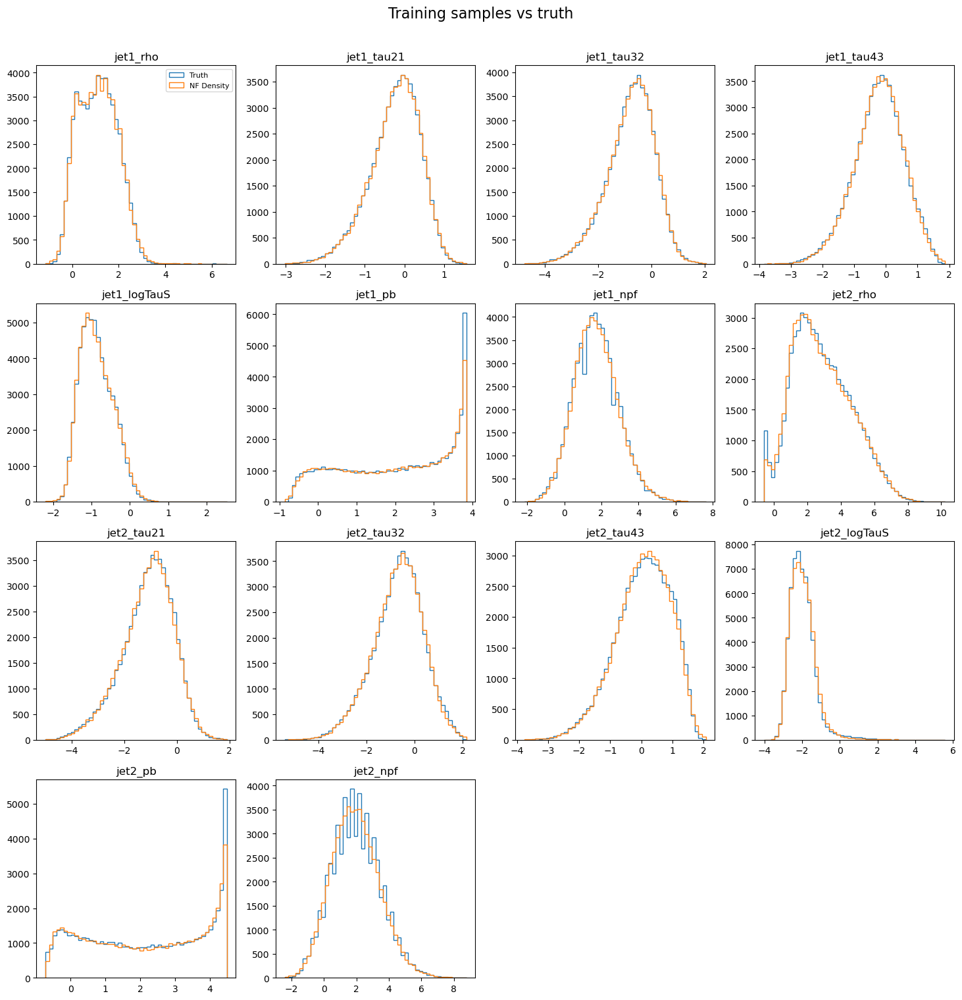

Loading test sample


100%|██████████| 1/1 [00:00<00:00, 37.25it/s]


loading YHH2000_H400, 18959 events


100%|██████████| 1/1 [00:00<00:00, 39.01it/s]


loading YHH3000_H400, 19554 events


100%|██████████| 1/1 [00:00<00:00, 35.20it/s]

loading YHH5000_H400, 20761 events


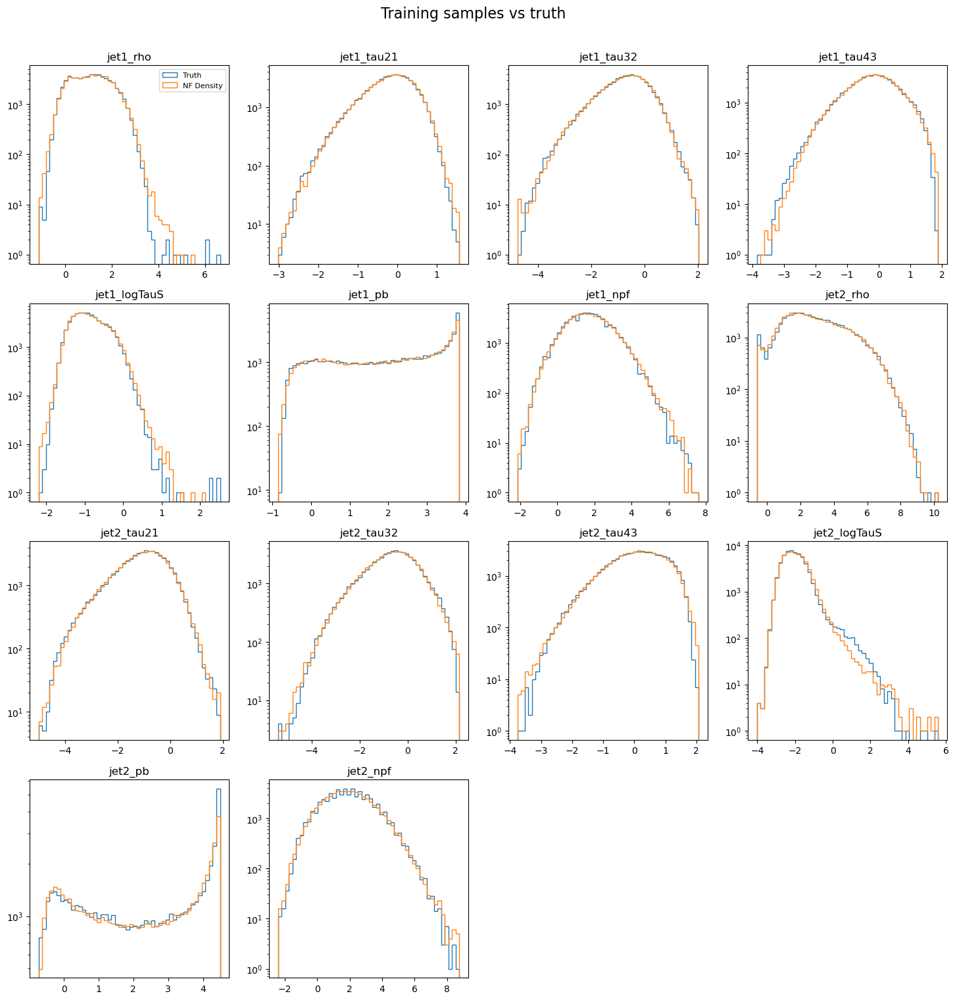

In [20]:
NF_kwargs = {"flow_type":"NSRATQUAD","tail_bound":12,"hidden_features":160,
             "num_layers":6,"num_bins":80,"num_blocks_per_layer":5,"tails":"linear"}
flowName = "top66_heavy"
sample = topologyGroups_heavyDaughters[flowName]
reference = "BKG"
modelName = flowName+"_mjjCond"
variables = ['jet1_rho','jet1_tau21','jet1_tau32','jet1_tau43','jet1_logTauS','jet1_pb','jet1_npf',
             'jet2_rho','jet2_tau21','jet2_tau32','jet2_tau43','jet2_logTauS','jet2_pb','jet2_npf']
context = ['mjj']
nTrain = 200000
trainer = NFTrainer(sample,reference,variables,context,modelName,
                    nTrain=nTrain,NF_kwargs=NF_kwargs)
#trainer.train(bs=10000,n_epoch=200,patience=20,learning_rate=1e-4,
#              print_interval=10,T_max=50,eta_min=1e-5)
trainer.train()
trainer.plotDensity(100000)
trainer.plotDensity(100000,log=True)